In [1]:
import os
import sys
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
sys.path.insert(0, "C:/workspace/data-science//libs")
from simulation_core import Simulation

pd.set_option('display.max_columns', None)

86400 24 3600


The only plot function  left here, all other plotting functions related to the simulations are placed in the ```Simulation``` class of the ```simulation_core.py```

In [2]:
def plot_mints(mitigated_mints: pd.DataFrame, pure_mints: pd.DataFrame, pool_name: str, width: int=10, height: int=10):
    """plot red line of original mints and blue dots of mitigated ones

    Args:
        mitigated_mints (pd.DataFrame): dataset of mitigated mints
        pure_mints (pd.DataFrame): pure dataset of mints without mitigation
        width (int, optional): width. Defaults to 10.
        height (int, optional): height. Defaults to 10.
    """
    fig, ax = plt.subplots(figsize=(width, height))
    ax2 = ax.twinx()

    ax.plot(pd.to_datetime(pure_mints.timestamp, unit='s'), pure_mints.Y_amount, c='red', label='mitigation off')
    ax2.plot_date(pd.to_datetime(mitigated_mints.timestamp, unit='s'), mitigated_mints.Y_amount, linestyle='--', c='blue', label='mitigation on')

    ax.set_title(f'Scatterplot of the mints for {pool_name} pool')
    plt.legend()
    ax.set_xlabel('time')
    ax.set_ylabel('Y token amount')
    ax2.set_ylabel('Y token mitigated amount')
    fig.autofmt_xdate(rotation=25)
    ax.grid(True, linestyle='--')

    plt.show()

Setting up the simulations parameters, with identifying their paths

**cell below is executed ONLY ONCE BECAUSE OF FOUND MINTS TABLE ERROR**

In some unique cases pools set pairs in unexpected order of tokens, meaning that all mints and burns will differ from expected format and therefore it is required to set them back into expected order. Unexpected order can be found if during simulations most of the transactions are blocked by ```NOT_ENOUGH_RESERVES``` status.

Each pool has its simulation parameters required to be set up in order to perform correct reading of the pickle files and where to save all simulation results.

In [3]:
# NFT token pools or NFT-related token pools
axs_weth_sim = Simulation(experiment_id = 11, x_name = 'AXS', y_name = 'WETH', window_size = 24, 
                           base_dir = fr"{os.getcwd()}\data\real_transactions\experiment_")
mana_weth_sim = Simulation(experiment_id = 12, x_name = 'MANA', y_name = 'WETH', window_size = 24, 
                           base_dir = fr"{os.getcwd()}\data\real_transactions\experiment_")
enj_weth_sim = Simulation(experiment_id = 13, x_name = 'ENJ', y_name = 'WETH', window_size = 24, 
                           base_dir = fr"{os.getcwd()}\data\real_transactions\experiment_", x_index = '1', y_index = '0')
sand_weth_sim = Simulation(experiment_id = 14, x_name = 'SAND', y_name = 'WETH', window_size = 24, 
                           base_dir = fr"{os.getcwd()}\data\real_transactions\experiment_")
alice_weth_sim = Simulation(experiment_id = 15, x_name = 'ALICE', y_name = 'WETH', window_size = 24, 
                           base_dir = fr"{os.getcwd()}\data\real_transactions\experiment_")

**IMPORTANT: launch those simulations only if there is no data in package ```data\real_transactions```, otherwise skip this part (comment it)**

In [4]:
# # NFT token or NFT related pools
# axs_weth_sim.run_simulation(isBurnAvailable = True, isMintAvailable = True)     # passed, experiment 11
# mana_weth_sim.run_simulation(isBurnAvailable = True, isMintAvailable = True)    # passed, experiment 12
# enj_weth_sim.run_simulation(isBurnAvailable = True, isMintAvailable = True)     # passed, experiment 13
# sand_weth_sim.run_simulation(isBurnAvailable = True, isMintAvailable = True)    # passed, experiment 14
# alice_weth_sim.run_simulation(isBurnAvailable = True, isMintAvailable = True)   # passed, experiment 15

## NFT and NFT related tokens pools (AXS/WETH, MANA/WETH, ENJ/WETH, SAND/WETH, ALICE/WETH)

In [4]:
axs_weth_swaps_mitigation_off_df, axs_weth_mints_mitigation_off_df, axs_weth_burns_mitigation_off_df = axs_weth_sim.read_simulation(0)
axs_weth_swaps_mitigation_on_df, axs_weth_mints_mitigation_on_df, axs_weth_burns_mitigation_on_df = axs_weth_sim.read_simulation(1)

mana_weth_swaps_mitigation_off_df, mana_weth_mints_mitigation_off_df, mana_weth_burns_mitigation_off_df = mana_weth_sim.read_simulation(0)
mana_weth_swaps_mitigation_on_df, mana_weth_mints_mitigation_on_df, mana_weth_burns_mitigation_on_df = mana_weth_sim.read_simulation(1)

enj_weth_swaps_mitigation_off_df, enj_weth_mints_mitigation_off_df, enj_weth_burns_mitigation_off_df = enj_weth_sim.read_simulation(0)
enj_weth_swaps_mitigation_on_df, enj_weth_mints_mitigation_on_df, enj_weth_burns_mitigation_on_df = enj_weth_sim.read_simulation(1)

sand_weth_swaps_mitigation_off_df, sand_weth_mints_mitigation_off_df, sand_weth_burns_mitigation_off_df = sand_weth_sim.read_simulation(0)
sand_weth_swaps_mitigation_on_df, sand_weth_mints_mitigation_on_df, sand_weth_burns_mitigation_on_df = sand_weth_sim.read_simulation(1)

alice_weth_swaps_mitigation_off_df, alice_weth_mints_mitigation_off_df, alice_weth_burns_mitigation_off_df = alice_weth_sim.read_simulation(0)
alice_weth_swaps_mitigation_on_df, alice_weth_mints_mitigation_on_df, alice_weth_burns_mitigation_on_df = alice_weth_sim.read_simulation(1)

# AXS/WETH (NFT)

In [6]:
axs_weth_mints_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,1,1866.449528,5.847000,1620006142,SUCCESS,0,1620006142,1620006142,1,0.000000e+00,0.000000,0.000000e+00,0,0,False,1866.449528,5.847000,10913.130389,0,0,False
1,34,25.000000,0.071740,1620065650,SUCCESS,3968,1620065662,1620065650,34,1.940744e+03,5.572721,1.081523e+04,188,18897511,False,1965.744285,5.644461,11095.566126,188,18897511,False
2,35,280.000000,0.803485,1620066719,SUCCESS,4039,1620066727,1620066719,35,1.965744e+03,5.644461,1.109557e+04,188,18897511,False,2245.744285,6.447946,14480.437107,188,18897511,False
3,201,50.000000,0.096979,1621069285,SUCCESS,70877,1621069297,1621069285,201,1.000000e-12,0.127364,1.273643e-13,2040,387603419,False,50.000000,0.224343,11.217143,2040,387603419,False
4,208,3.982368,0.010916,1621132663,SUCCESS,75102,1621132672,1621132663,208,5.219505e+01,0.215456,1.124572e+01,3166,441261019,False,56.177416,0.226371,12.716962,3166,441261019,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,4612,1.000000,0.030401,1637048453,SUCCESS,1136155,1637048467,1637048453,4612,8.154576e+01,18.405658,1.500903e+03,314138,3533659432,False,82.545763,18.436059,1521.818522,314138,3533659432,False
68,4620,43.782246,1.390685,1637173219,SUCCESS,1144472,1637173222,1637173219,4620,8.590860e+01,17.488638,1.502424e+03,334014,3534088892,False,129.690849,18.879323,2448.475407,334014,3534088892,False
69,4635,46.772919,1.425133,1637270022,SUCCESS,1150926,1637270032,1637270022,4635,1.544325e+02,15.879384,2.452292e+03,351509,3535045704,False,201.205377,17.304517,3481.761836,351509,3535045704,False
70,4674,20.006538,0.620373,1637578023,SUCCESS,1171459,1637578027,1637578023,4674,2.187103e+02,11.271500,2.465193e+03,376363,3539295142,False,238.716800,11.891872,2838.789731,376363,3539295142,False


In [7]:
axs_weth_burns_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,87,26.456386,0.067974,1620278796,SUCCESS,18177,1620278797,1620278796,87,2383.312412,6.107822,14556.848241,720,104943039,False,2.356856e+03,6.039849,1.423505e+04,720,104943039,False
1,125,326.295177,0.692936,1620374067,SUCCESS,24529,1620374077,1620374067,125,2595.444183,5.509669,14300.037330,930,145987912,False,2.269149e+03,4.816732,1.092988e+04,930,145987912,False
2,200,2345.853223,4.615325,1620904829,CLIPPED,59913,1620904837,1620904829,200,2345.853223,4.742689,11125.652973,2040,387603419,False,1.000000e-12,0.127364,1.273643e-13,2040,387603419,False
3,258,48.409812,0.103813,1621297912,SUCCESS,86118,1621297912,1621297912,258,119.913734,0.266410,31.946250,3548,511154602,False,7.150392e+01,0.162598,1.162636e+01,3548,511154602,False
4,1306,151.944075,0.271016,1622629506,SUCCESS,174891,1622629507,1622629506,1306,1912.180119,3.471824,6638.752787,10277,1158931254,False,1.760236e+03,3.200808,5.634178e+03,10277,1158931254,False
5,1419,608.541769,1.030020,1622702418,SUCCESS,179752,1622702422,1622702418,1419,3251.931955,5.545223,18032.689476,10407,1199337126,False,2.643390e+03,4.515204,1.193545e+04,10407,1199337126,False
6,1436,797.524914,1.410775,1622716039,SUCCESS,180660,1622716042,1622716039,1436,2592.058439,4.612453,11955.749002,10432,1207450569,False,1.794534e+03,3.201679,5.745520e+03,10432,1207450569,False
7,1497,440.578025,0.781316,1622753708,SUCCESS,183172,1622753722,1622753708,1497,1765.776636,3.292112,5813.135224,10499,1228418821,False,1.325199e+03,2.510797,3.327304e+03,10499,1228418821,False
8,1699,461.742241,0.748523,1622924391,SUCCESS,194550,1622924392,1622924391,1699,1298.023207,2.680772,3479.704288,10856,1310810094,False,8.362810e+02,1.932249,1.615903e+03,10856,1310810094,False
9,1759,94.302815,0.151797,1623198483,SUCCESS,212823,1623198487,1623198483,1759,970.833964,1.680091,1631.089249,11387,1447199339,False,8.765311e+02,1.528294,1.339597e+03,11387,1447199339,False


In [8]:
axs_weth_swaps_mitigation_off_df

,id,token_in,token_out,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender,to,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff
0,0,WETH,AXS,1.000000,0.0,0.000000,NaN,NOT_REACHED,NaN,NaN,NaN,NaN,NOT_ENOUGH_RESERVES,0.0,2021-05-03 01:42:22,2021-05-03 01:42:22,0x4bd0e1ac628e46befe15c93c7f5125146dbcb3d39dec...,0x27f9adb26d532a41d97e00206114e429ad58c679,0x27f9adb26d532a41d97e00206114e429ad58c679,0,0.000000,0.000000,0.000000,0,0,False,0.000000,0.000000,0.000000,0,0,False,NaN,NaN
1,2,WETH,AXS,0.400000,0.0,118.390840,0.001600,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1.0,2021-05-03 01:42:37,2021-05-03 01:42:28,0x0439383f710521f46e1af7355efc9462c0b002dec9c5...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x9108048f5ef19c64d00adda718906990b53d02cd,2,1866.449528,5.847000,10913.130389,0,0,False,1748.058688,6.245400,10917.325729,0,0,False,0.003573,0.140479
2,3,WETH,AXS,200.000000,0.0,1694.606685,0.800000,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,2.0,2021-05-03 01:42:52,2021-05-03 01:42:48,0xfdbe038eb39530db99d68b67279c5f6b809b989fad5d...,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,3,1748.058688,6.245400,10917.325729,0,0,False,53.452003,205.445400,10981.468133,0,4198,False,3.843549,1074.791697
3,4,AXS,WETH,269.176166,0.0,171.121491,0.684486,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,2.0,2021-05-03 01:42:52,2021-05-03 01:42:48,0xe101177c2a1cf0a22dbec680da739e5b4f3dad5e5dfe...,0x27f9adb26d532a41d97e00206114e429ad58c679,0x27f9adb26d532a41d97e00206114e429ad58c679,4,53.452003,205.445400,10981.468133,0,4198,False,322.628169,33.639423,10853.025462,0,4198,False,0.104267,-0.972872
4,5,WETH,AXS,0.500000,0.0,4.678589,0.002000,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,2.0,2021-05-03 01:42:52,2021-05-03 01:42:48,0x64dca22095c42da4b1a21e6bf6fa3774bd2ec53ae1c6...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x78a622d8e6fd0fb9c7ada77b6bfb83bf84a2876a,5,322.628169,33.639423,10853.025462,0,4198,False,317.949579,34.137423,10853.979311,0,4198,False,0.107367,0.029737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4582,4692,WETH,AXS,0.198353,0.0,4.408960,0.000793,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1179077.0,2021-11-23 18:31:37,2021-11-23 18:31:35,0x77312ee4b6d267a8573b9b1094902b4360b3b1731629...,0xe66b31678d6c16e9ebf358268a790b763c133750,0x8699202b066866bc878f4fa224314ada9a4e619d,4692,237.707033,10.390813,2469.969364,381658,3541586791,False,233.298073,10.588373,2470.247017,381938,3541733659,False,0.045386,0.038271
4583,4695,AXS,WETH,1.100000,0.0,0.049195,0.000197,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1179994.0,2021-11-23 22:20:52,2021-11-23 22:20:45,0xd955764bf91c159a69073dbee1f2c6b2009313d31295...,0x86d3579b043585a97532514016dcf0c2d6c4b6a1,0xbb2b8038a1640196fbe3e38816f3e67cba72d940,4695,233.298073,10.588373,2470.247017,381938,3541733659,False,234.398073,10.538981,2470.316823,382563,3542036728,False,0.044962,-0.009336
4584,4696,AXS,WETH,5.967619,0.0,0.259102,0.001036,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1180331.0,2021-11-23 23:45:07,2021-11-23 23:45:07,0x19f7f813f1a2632439d675d2dddc576d313ede9a5ee6...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x0612f7b15779ca6ddbe927f92d6c4144fbae1485,4696,234.398073,10.538981,2470.316823,382563,3542036728,False,240.365691,10.278843,2470.681170,382790,3542149157,False,0.042763,-0.048898
4585,4697,AXS,WETH,1.000000,0.0,0.042162,0.000169,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1180450.0,2021-11-24 00:14:52,2021-11-24 00:14:44,0x79cc9376be9d15762f36800b5e4e379e4e3373335a29...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0xd2b0964ca46a4f3401ef65bbf9c616ed

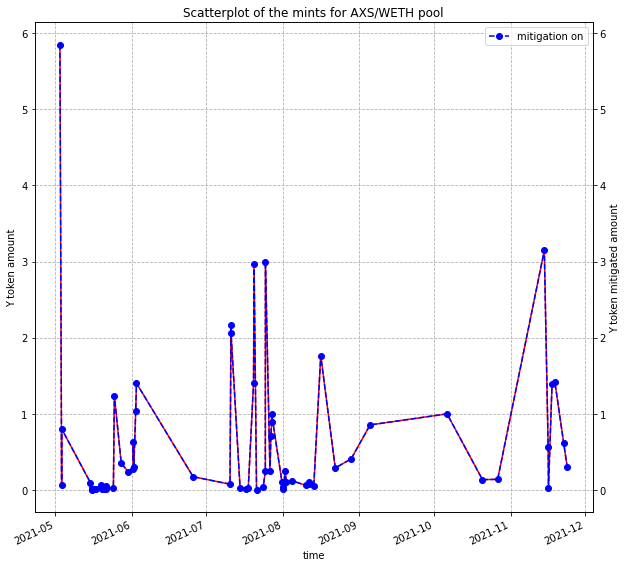

In [9]:
plot_mints(axs_weth_mints_mitigation_on_df, axs_weth_mints_mitigation_off_df, pool_name='AXS/WETH')

## MEV transactions extraction and analysis

### MEV attacks and possible MEVs extraction

There are 77 MEV attacks performed on the pool

In [5]:
axs_weth_filtered_swaps_df, axs_weth_mevs_df = axs_weth_sim.extract_filtered_and_mevs_dfs()

initial len = 4588, filtered len = 4538
txds = 50
out values = 25


In [7]:
axs_weth_suspicious_filtered_swaps_df, axs_weth_possible_mevs_df = axs_weth_sim.extract_suspicious_and_filtered_swaps_dfs()

initial len = 4588, filtered len = 4504
txds = 84
out values = 42.0


In [8]:
axs_weth_mevs_df = axs_weth_sim.calculate_attack_profit(axs_weth_mevs_df)

### Plotting values of MEVs and possible MEVs with filtered swaps values

In [9]:
axs_weth_mevs_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd,profit
0,AXS,WETH,1453.949686,200.157590,312150.092977,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,0x5d4442d9c71e5d513d2fa1a282cae3221a9f0249cec6...,290480.691023
1,WETH,AXS,200.000000,1453.949686,602630.784000,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,0xfdbe038eb39530db99d68b67279c5f6b809b989fad5d...,290480.691023
2,WETH,AXS,1.710000,315.441608,5784.433126,2021-05-03 01:43:46,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0x89cded15c7e0656a6aa6c54d6abb6a09ff0e0199d92f...,1063.370397
3,AXS,WETH,315.441608,1.737494,4721.062730,2021-05-03 01:43:46,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xcbdb50f7f1359d46a11ddcdfd0e5297d65e481fcb5a9...,1063.370397
4,AXS,WETH,171.943376,0.805030,2301.348308,2021-05-03 01:46:13,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0x9bf4cc76bd1430243216909b4b8c1952374115a9e202...,85.190273
5,WETH,AXS,0.750000,171.943376,2386.538581,2021-05-03 01:46:13,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xc0020707c077b51b3ca1bae0e77c94dd9dea3673b41a...,85.190273
6,AXS,WETH,73.429311,0.173512,397.480250,2021-05-28 22:35:20,0x0000000000a1c7212a1c129512d80eb30d14dc08,0x0000000000a1c7212a1c129512d80eb30d14dc08,0x224a3dcfcb12fab2590478482fbcfb2b5083f49fba6b...,64.394538
7,WETH,AXS,0.135561,73.429311,333.085712,2021-05-28 22:35:20,0x0000000000a1c7212a1c129512d80eb30d14dc08,0x0000000000a1c7212a1c129512d80eb30d14dc08,0x8b92ddcc5736ea05a5b30fa8dd1b4fa03452291f0296...,64.394538
8,AXS,WETH,144.283160,0.369760,862.549895,2021-05-31 08:43:54,0x00000000b7ca7e12dcc72290d1fe47b2ef14c607,0x00000000b7ca7e12dcc72290d1fe47b2ef14c607,0x87add25776ca257318f333bb39ba05f62bdaaacbbe7c...,57.493749
9,WETH,AXS,0.345196,144.283160,920.043644,2021-05-31 08:43:54,0x00000000b7ca7e12dcc72290d1fe47b2ef14c607,0x00000000b7ca7e12dcc72290d1fe47b2ef14c607,0xde1f59f3615481b0abe7f33afd52ff1bc91bf5cc47b0...,57.493749


In [14]:
axs_weth_mevs_df[axs_weth_mevs_df['profit'] == axs_weth_mevs_df['profit'].max()]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd,profit
0,AXS,WETH,1453.949686,200.157590,312150.092977,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,0x5d4442d9c71e5d513d2fa1a282cae3221a9f0249cec6...,290480.691023
1,WETH,AXS,200.000000,1453.949686,602630.784000,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,0xfdbe038eb39530db99d68b67279c5f6b809b989fad5d...,290480.691023


In [15]:
axs_weth_possible_mevs_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd
5,AXS,WETH,1453.949686,200.157590,312150.092977,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,0x5d4442d9c71e5d513d2fa1a282cae3221a9f0249cec6...
8,WETH,AXS,200.000000,1453.949686,602630.784000,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,0xfdbe038eb39530db99d68b67279c5f6b809b989fad5d...
10,WETH,AXS,1.710000,315.441608,5784.433126,2021-05-03 01:43:46,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0x89cded15c7e0656a6aa6c54d6abb6a09ff0e0199d92f...
11,AXS,WETH,315.441608,1.737494,4721.062730,2021-05-03 01:43:46,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xcbdb50f7f1359d46a11ddcdfd0e5297d65e481fcb5a9...
16,AXS,WETH,171.943376,0.805030,2301.348308,2021-05-03 01:46:13,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0xda1faeb056a2f568b138ca0ad9ad8a51915ba336,0x9bf4cc76bd1430243216909b4b8c1952374115a9e202...
...,...,...,...,...,...,...,...,...,...
4437,WETH,AXS,0.090000,2.738759,420.474716,2021-11-07 22:46:13,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x27276ae62097b8f1ae6ad2e86c459722c1b9e830,0xecec54573d3543a0f5584238a34f15ba7456c44b6d7a...
4499,AXS,WETH,159.853255,22.421754,64288.248651,2021-11-15 10:23:17,0x7cf09d7a9a74f746edcb06949b9d64bcd9d1604f,0x7cf09d7a9a74f746edcb06949b9d64bcd9d1604f,0x98e6a68378587bf949b5d684db719a86a4dc485850c2...
4500,WETH,AXS,22.403374,158.294883,295635.689643,2021-11-15 10:23:17,0x7cf09d7a9a74f746edcb06949b9d64bcd9d1604f,0x0c365789dbbb94a29f8720dc465554c587e897db,0xaeb440271e91a3404c5364c7d4d5d15d3ab63e434ccd...
4563,WETH,AXS,0.268942,8.468738,1144.172998,2021-11-22 10:07:54,0x00000000500e2fece27a7600435d0c48d64e0c00,0x00000000500e2fece27a7600435d0c48d64e0c00,0x3ef775c8c45e1e6aa5fb9308b104201b6e4b982ea2ad...


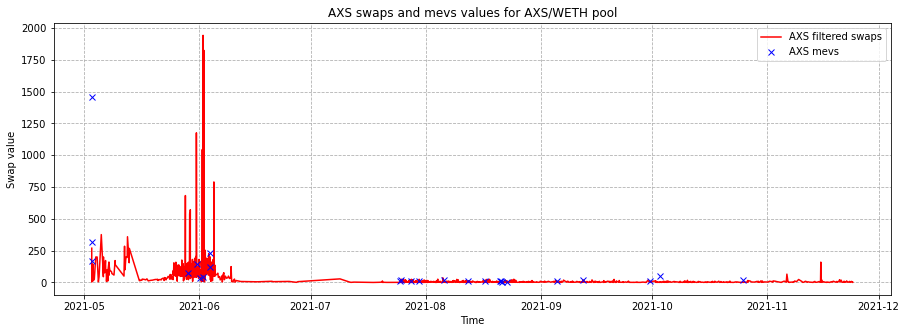

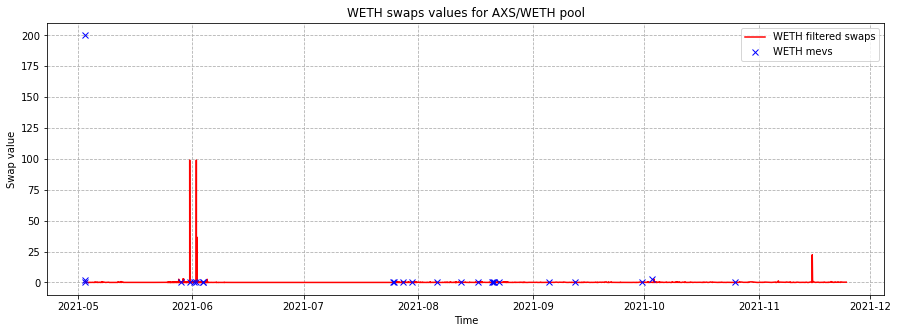

In [13]:
axs_weth_sim.show_swaps_and_mevs_by_token(axs_weth_filtered_swaps_df, axs_weth_mevs_df, width=15, height=5)

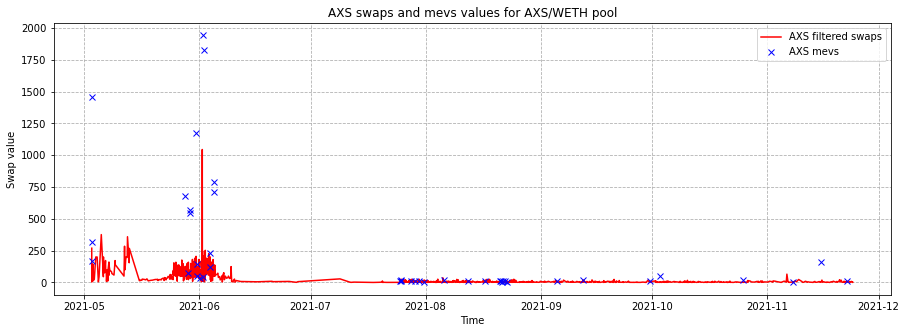

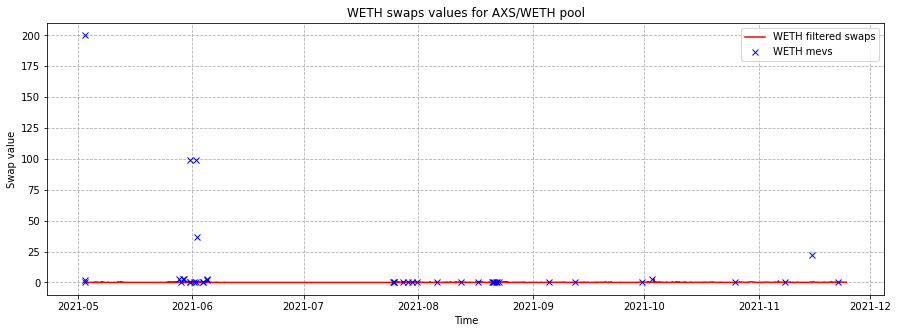

In [14]:
axs_weth_sim.show_swaps_and_mevs_by_token(axs_weth_suspicious_filtered_swaps_df, axs_weth_possible_mevs_df, width=15, height=5)

### Plotting MEV transactions and possible MEV transactions with filtered swaps daily count distributions

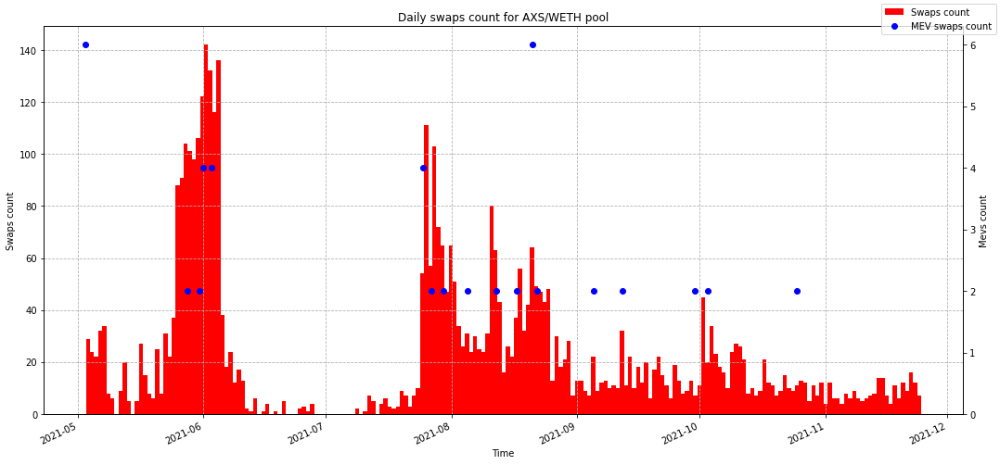

In [15]:
axs_weth_sim.show_swaps_and_mevs_daily_count_by_token(axs_weth_filtered_swaps_df, axs_weth_mevs_df, mevs_alter_axis=True)

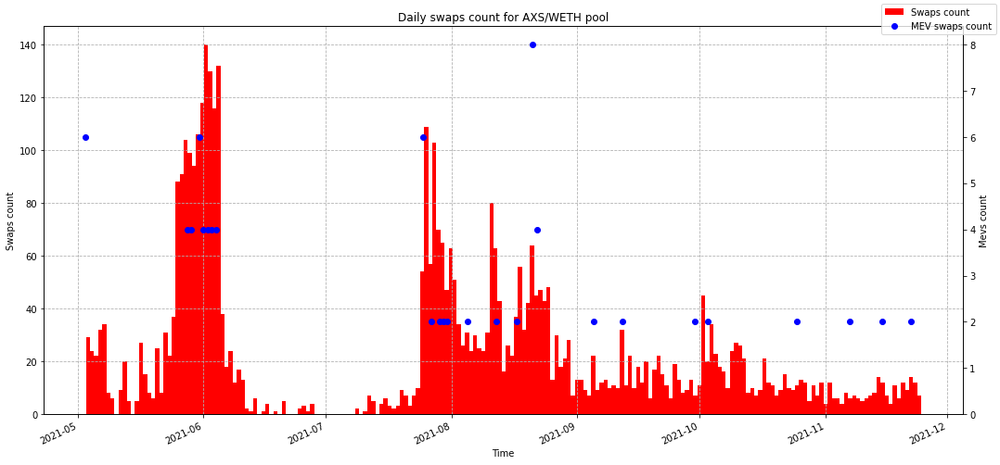

In [16]:
axs_weth_sim.show_swaps_and_mevs_daily_count_by_token(axs_weth_suspicious_filtered_swaps_df, axs_weth_possible_mevs_df, mevs_alter_axis=True)

### Plotting ratio of MEV attacks to filtered swaps

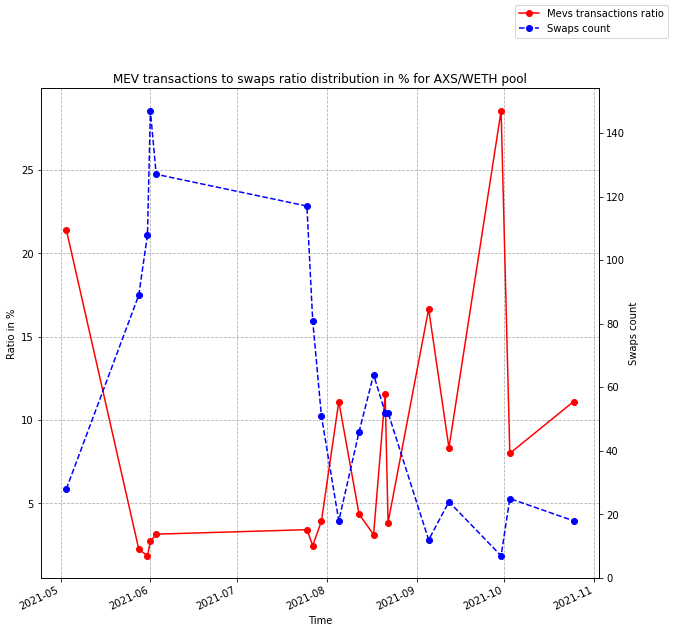

In [17]:
axs_weth_sim.show_mevs_to_swaps_ratio(axs_weth_filtered_swaps_df, axs_weth_mevs_df)

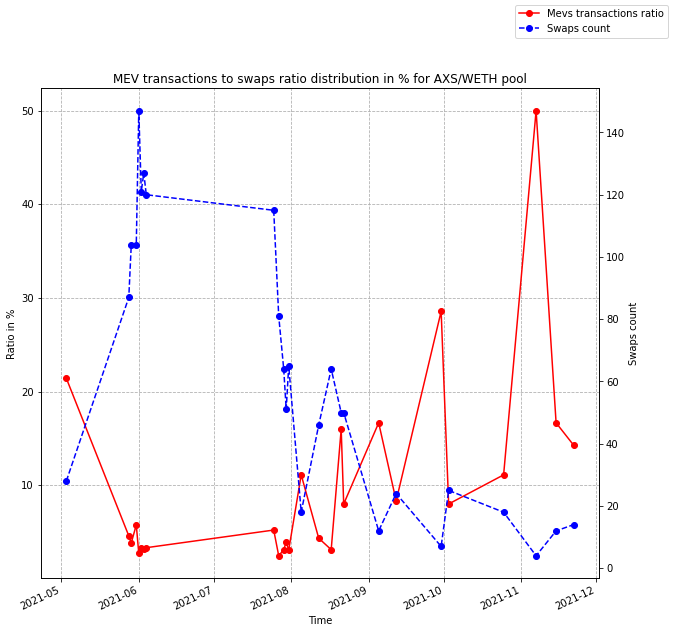

In [18]:
axs_weth_sim.show_mevs_to_swaps_ratio(axs_weth_suspicious_filtered_swaps_df, axs_weth_possible_mevs_df)

### Plotting ratio of MEVs and suspicious transactions to filtered swaps

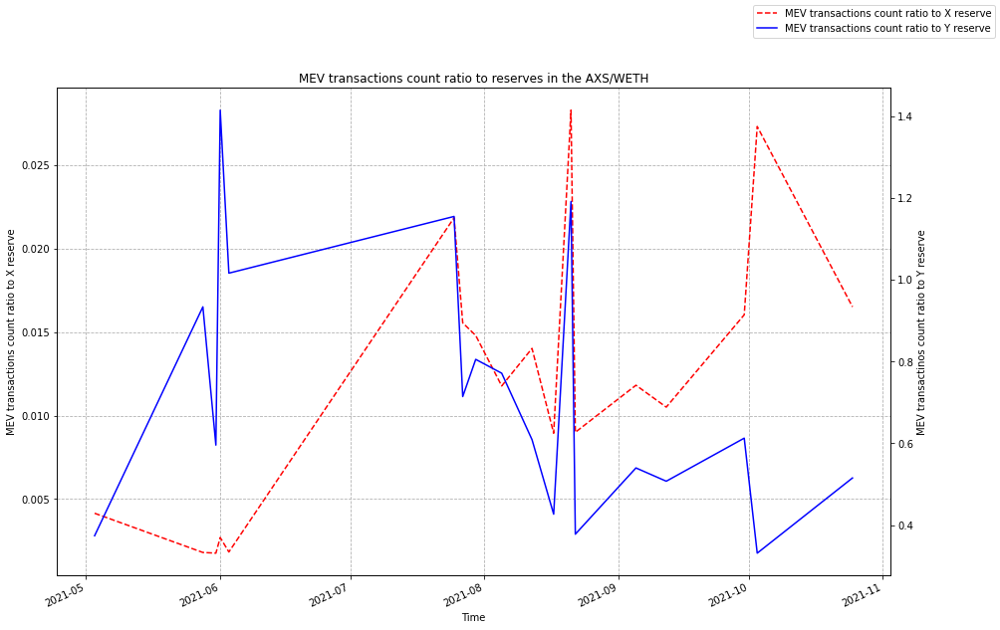

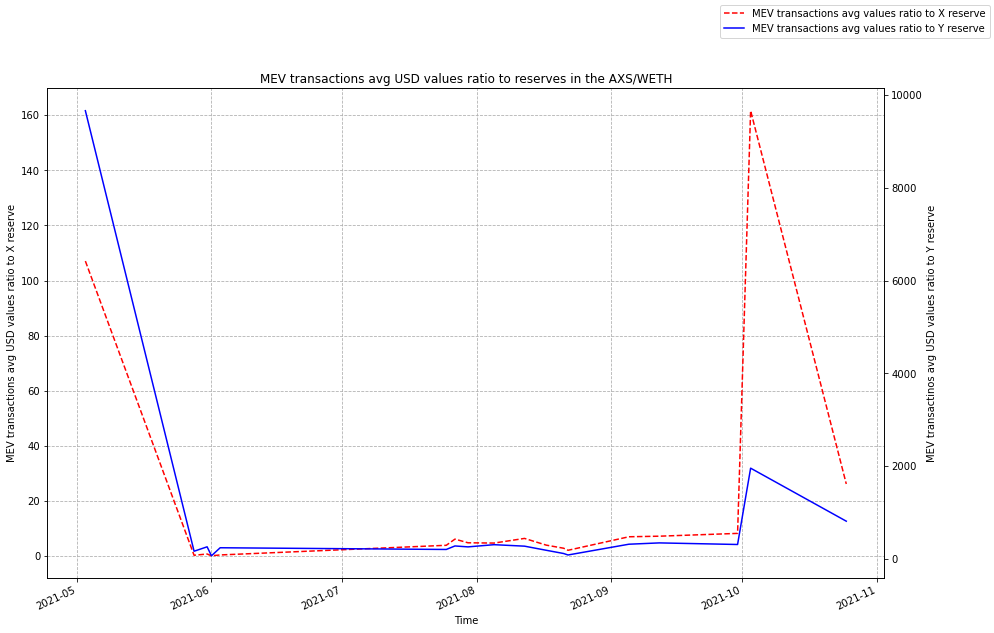

In [19]:
axs_weth_sim.show_mevs_to_reserves_ratio(axs_weth_swaps_mitigation_off_df, axs_weth_mevs_df, width=15, height=10)
axs_weth_sim.show_mevs_values_to_reserves_ratio(axs_weth_swaps_mitigation_off_df, axs_weth_mevs_df, width=15, height=10)

### Plotting transaction values distribution of passed swaps, blocked swaps and not enough reserves swaps

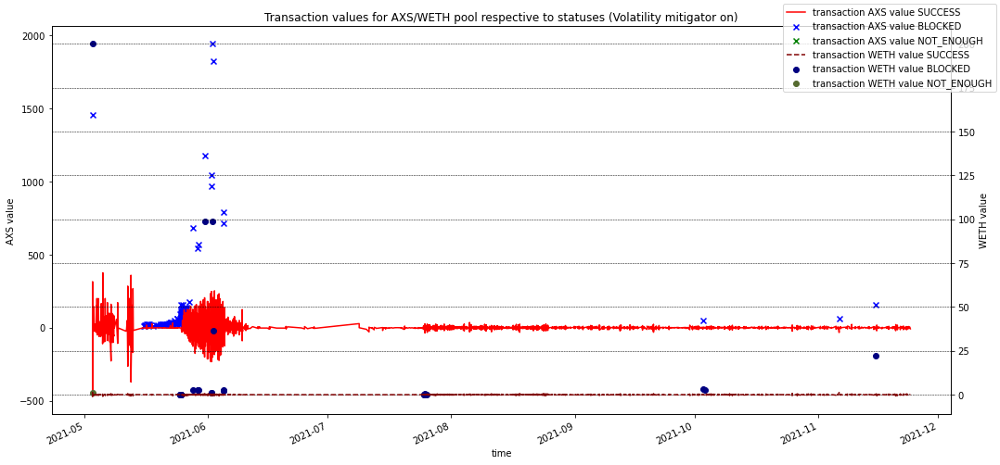

In [20]:
axs_weth_sim.plot_transactions_by_type(axs_weth_swaps_mitigation_on_df, ignore_success=False, width=15, height=7)

### Plotting mitigation comparison, slice factor distribution, reserves distributions, cumulative prices distributions, transaction frequency distributions, price impact after each transaction distributions

Original AXS/WETH pool has next statuses counts:
SUCCESS                4586
NOT_ENOUGH_RESERVES       1
Name: status, dtype: int64
Mitigated AXS/WETH dataframe has next statuses counts:
SUCCESS                             4460
BLOCKED_BY_VOLATILITY_MITIGATION     126
NOT_ENOUGH_RESERVES                    1
Name: status, dtype: int64
TWAP unavailability ratio for AXS/WETH is 0.0013080444735120995
Mitigated AXS/WETH dataframe has next Mitigator statuses:
CHECKED                4580
CANT_CONSULT_ORACLE       6
NOT_REACHED               1
Name: mitigator_check_status, dtype: int64


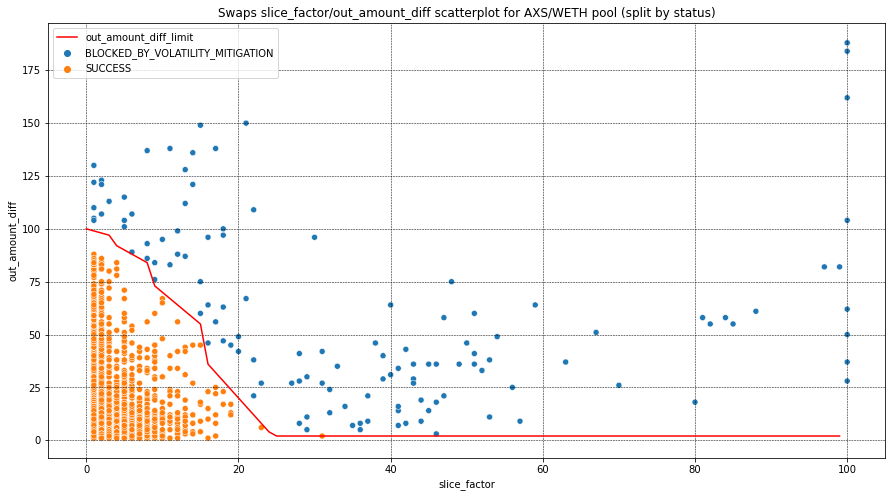

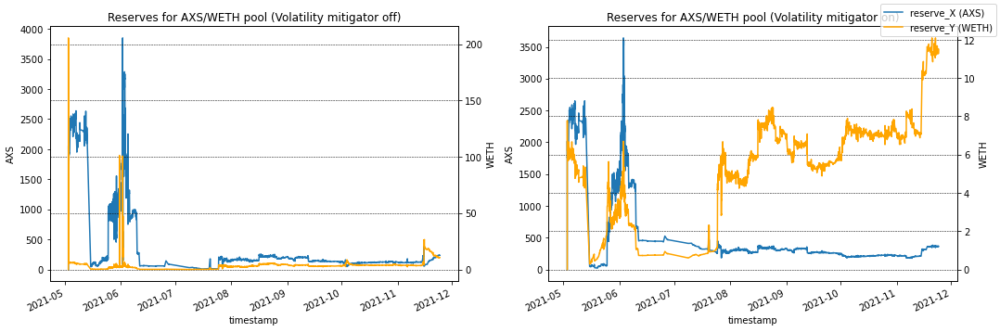

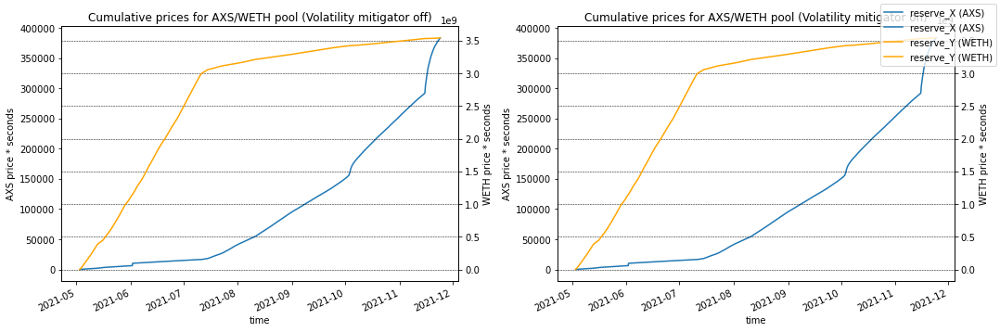

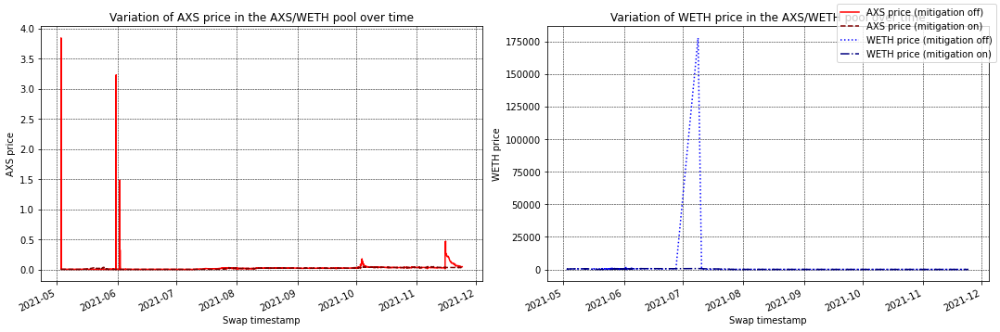

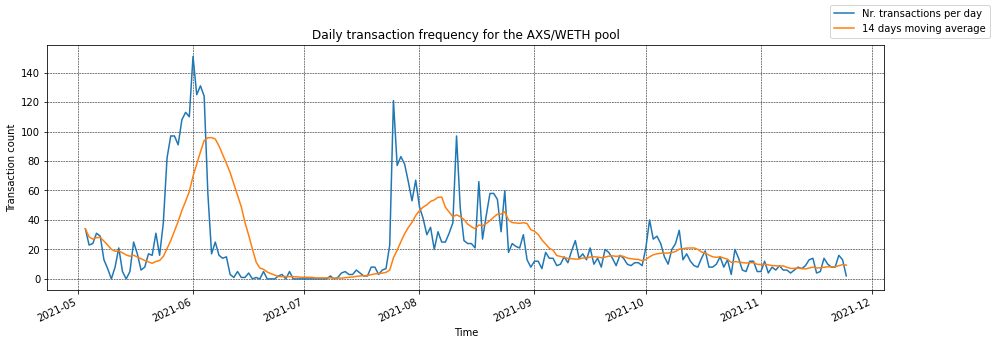

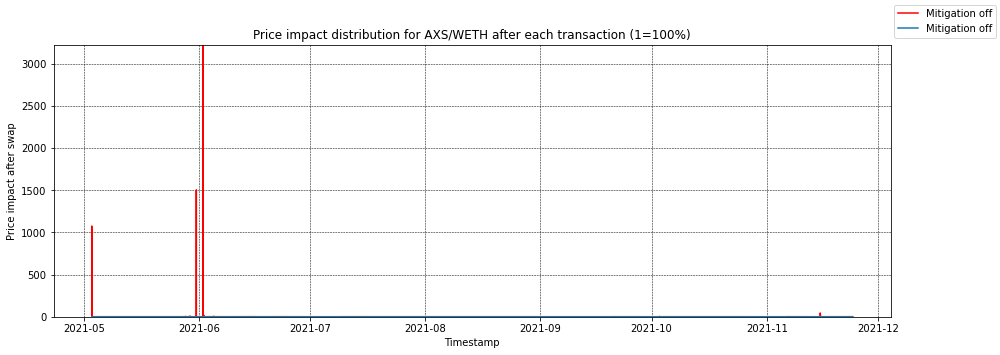

In [21]:
axs_weth_sim.show_mitigation_comparison(axs_weth_swaps_mitigation_off_df, axs_weth_swaps_mitigation_on_df)
axs_weth_sim.px_hist_blocked_transactions_slice(axs_weth_swaps_mitigation_on_df)
axs_weth_sim.px_hist_blocked_transactions_difference_from_oracle(axs_weth_swaps_mitigation_on_df)
axs_weth_sim.plot_slice_distribution_and_diff_limit_line(axs_weth_swaps_mitigation_on_df)
axs_weth_sim.plot_reserves_with_and_without_mitigation(axs_weth_swaps_mitigation_off_df, axs_weth_swaps_mitigation_on_df)
axs_weth_sim.plot_cumulative_prices_with_and_without_mitigation(axs_weth_swaps_mitigation_off_df, axs_weth_swaps_mitigation_off_df)
axs_weth_sim.plot_price_distribution(axs_weth_swaps_mitigation_off_df, axs_weth_swaps_mitigation_on_df, separate_plots=True)
axs_weth_sim.plot_frequency_distribution(axs_weth_swaps_mitigation_on_df)
axs_weth_sim.plot_price_impact(axs_weth_swaps_mitigation_off_df, axs_weth_swaps_mitigation_on_df, 
                                smallest_y=axs_weth_swaps_mitigation_off_df['price_diff'].min(), 
                                biggest_y=axs_weth_swaps_mitigation_off_df['price_diff'].max())

In [22]:
axs_weth_blocked_df = axs_weth_swaps_mitigation_on_df[axs_weth_swaps_mitigation_on_df['status'] == 'BLOCKED_BY_VOLATILITY_MITIGATION']
axs_weth_blocked_mevs_df = pd.merge(axs_weth_blocked_df, axs_weth_mevs_df, on='txd')
axs_weth_blocked_mevs_df

,id,token_in_x,token_out_x,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender_x,to_x,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff,token_in_y,token_out_y,amount_in,amount_out,amount_usd,timestamp,sender_y,to_y,profit
0,3,WETH,AXS,200.000000,0.0,1694.606685,NaN,CHECKED,55979.078615,188.0,100.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2.0,2021-05-03 01:42:52,2021-05-03 01:42:48,0xfdbe038eb39530db99d68b67279c5f6b809b989fad5d...,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,3,1748.058688,6.245400,10917.325729,0,0,True,1748.058688,6.245400,10917.325729,0,4198,True,0.003573,0.0,WETH,AXS,200.000000,1453.949686,602630.784000,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,290480.691023
1,9,AXS,WETH,1453.949686,0.0,2.934657,NaN,CHECKED,5.194618,55.0,85.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2.0,2021-05-03 01:42:52,2021-05-03 01:42:48,0x5d4442d9c71e5d513d2fa1a282cae3221a9f0249cec6...,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,9,1705.566612,6.411952,10936.011110,0,4198,True,1705.566612,6.411952,10936.011110,0,4198,True,0.003759,0.0,AXS,WETH,1453.949686,200.157590,312150.092977,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,290480.691023
2,1938,WETH,AXS,0.223231,0.0,21.554718,NaN,CHECKED,56.411946,89.0,6.0,12.0,BLOCKED_BY_VOLATILITY_MITIGATION,478179.0,2021-07-25 02:07:07,2021-07-25 02:07:05,0x32442ef586567b23ef1676d8233683668be6e69a2113...,0x00000000032962b51589768828ad878876299e14,0x0c365789dbbb94a29f8720dc465554c587e897db,1938,437.151909,4.261081,1862.739830,27722,3245602322,True,437.151909,4.261081,1862.739830,27722,3245602322,True,0.009747,0.0,WETH,AXS,0.223231,13.929999,495.922944,2021-07-25 02:07:05,0x00000000032962b51589768828ad878876299e14,0x0c365789dbbb94a29f8720dc465554c587e897db,32.854960
3,4073,AXS,WETH,47.774361,0.0,1.164826,NaN,CHECKED,1.445713,21.0,22.0,88.0,BLOCKED_BY_VOLATILITY_MITIGATION,881517.0,2021-10-03 02:41:37,2021-10-03 02:41:37,0x7c174ca66441129fed5bec63427ffb9bc5d9d3aa9e31...,0x6b650ca58d7b7f1525c362ee1bb380df6140c766,0x47b18cdcc4205bcada65afefb7fdd294fb043d05,4073,220.671166,6.599537,1456.327536,150941,3549510414,True,220.671166,6.599537,1456.327536,151100,3549688468,True,0.029907,0.0,AXS,WETH,47.774361,3.269284,8367.927839,2021-10-03 02:41:37,0x6b650ca58d7b7f1525c362ee1bb380df6140c766,0x47b18cdcc4205bcada65afefb7fdd294fb043d05,6923.745130
4,4074,WETH,AXS,3.034927,0.0,69.035376,NaN,CHECKED,100.310078,36.0,46.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,881517.0,2021-10-03 02:41:37,2021-10-03 02:41:37,0xb189f446534b147da91ea4aea8bcac39d22215621065...,0x6b650ca58d7b7f1525c362ee1bb380df6140c766,0x6b650ca58d7b7f1525c362ee1bb380df6140c766,4074,220.671166,6.599537,1456.327536,151100,3549688468,True,220.671166,6.599537,1456.327536,151100,3549688468,True,0.029907,0.0,WETH,AXS,3.034927,47.774361,15291.672969,2021-10-03 02:41:37,0x6b650ca58d7b7f1525c362ee1bb380df6140c766,0x6b650ca58d7b7f1525c362ee1bb380df6140c766,6923.745130


In [16]:
axs_weth_blocked_df = axs_weth_swaps_mitigation_on_df[axs_weth_swaps_mitigation_on_df['status'] == 'BLOCKED_BY_VOLATILITY_MITIGATION']
axs_weth_blocked_mevs_df = pd.merge(axs_weth_blocked_df, axs_weth_possible_mevs_df, on='txd')
axs_weth_blocked_mevs_df

,id,token_in_x,token_out_x,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender_x,to_x,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff,token_in_y,token_out_y,amount_in,amount_out,amount_usd,timestamp,sender_y,to_y
0,3,WETH,AXS,200.000000,0.0,1694.606685,NaN,CHECKED,55979.078615,188.0,100.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2.0,2021-05-03 01:42:52,2021-05-03 01:42:48,0xfdbe038eb39530db99d68b67279c5f6b809b989fad5d...,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,3,1748.058688,6.245400,10917.325729,0,0,True,1748.058688,6.245400,10917.325729,0,4198,True,0.003573,0.0,WETH,AXS,200.000000,1453.949686,602630.784000,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad
1,9,AXS,WETH,1453.949686,0.0,2.934657,NaN,CHECKED,5.194618,55.0,85.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2.0,2021-05-03 01:42:52,2021-05-03 01:42:48,0x5d4442d9c71e5d513d2fa1a282cae3221a9f0249cec6...,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad,9,1705.566612,6.411952,10936.011110,0,4198,True,1705.566612,6.411952,10936.011110,0,4198,True,0.003759,0.0,AXS,WETH,1453.949686,200.157590,312150.092977,2021-05-03 01:42:48,0xd78a3280085ee846196cb5fab7d510b279486d44,0xf6da21e95d74767009accb145b96897ac3630bad
2,703,WETH,AXS,2.617447,0.0,686.049428,NaN,CHECKED,1312.954383,62.0,100.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,145273.0,2021-05-28 07:00:37,2021-05-28 07:00:25,0xcbcb22edbbd0c0450c84b56a5bf83d3cf977414cf320...,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,0x0c365789dbbb94a29f8720dc465554c587e897db,703,1370.246176,2.584275,3541.093245,17798,566457778,True,1370.246176,2.584275,3541.093245,17801,567332649,True,0.001886,0.0,WETH,AXS,2.617447,624.638047,11184.204639,2021-05-28 07:00:25,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,0x0c365789dbbb94a29f8720dc465554c587e897db
3,704,AXS,WETH,682.819669,0.0,0.853737,NaN,CHECKED,1.375919,46.0,50.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,145273.0,2021-05-28 07:00:37,2021-05-28 07:00:25,0x0c1e1deefa5e39d3f11bfdf4479f209043ec0bdb8f3a...,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,704,1370.246176,2.584275,3541.093245,17801,567332649,True,1370.246176,2.584275,3541.093245,17801,567332649,True,0.001886,0.0,AXS,WETH,682.819669,2.708996,4850.975743,2021-05-28 07:00:25,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666
4,827,WETH,AXS,2.922807,0.0,612.268165,NaN,CHECKED,1475.823330,82.0,99.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,151966.0,2021-05-29 10:53:52,2021-05-29 10:53:43,0x41c9f329f9321a6bb78c858c4cd6ecf90a56fb34509a...,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,0x0c365789dbbb94a29f8720dc465554c587e897db,827,1234.195621,2.939229,3627.583520,17995,617042627,True,1234.195621,2.939229,3627.583520,18000,618050398,True,0.002381,0.0,WETH,AXS,2.922807,519.925830,11584.933770,2021-05-29 10:53:43,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,0x0c365789dbbb94a29f8720dc465554c587e897db
5,828,AXS,WETH,542.185289,0.0,0.890857,NaN,CHECKED,1.078211,19.0,44.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,151966.0,2021-05-29 10:53:52,2021-05-29 10:53:43,0x45a66b0b6bf002268acaf778a3890ee633d340273851...,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,828,1234.195621,2.939229,3627.583520,18000,618050398,True,1234.195621,2.939229,3627.583520,18000,618050398,True,0.002381,0.0,AXS,WETH,542.185289,2.968876,5157.453899,2021-05-29 10:53:43,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666,0xcc1deb828b1baddd45dbb75ceab110b0d57a2666
6,845,AXS,WETH,571.236300,0.0,0.950788,NaN,CHECK

# MANA/WETH (NFT)

In [23]:
mana_weth_mints_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,0,8138.778341,1.420382,1589830836,SUCCESS,0,1589830836,1589830836,0,0.000000e+00,0.000000,0.000000e+00,0,0,False,8.138778e+03,1.420382,1.156017e+04,0,0,False
1,2,197.637271,0.036959,1589842204,SUCCESS,758,1589842206,1589842204,2,7.864695e+03,1.470182,1.156253e+04,0,0,False,8.062333e+03,1.507141,1.215107e+04,0,0,False
2,3,5071.078019,0.948313,1589844352,SUCCESS,902,1589844366,1589844352,3,8.062333e+03,1.507141,1.215107e+04,0,0,False,1.313341e+04,2.455454,3.224849e+04,0,0,False
3,5,2238.013091,0.371897,1589848515,SUCCESS,1179,1589848521,1589848515,5,1.393341e+04,2.315243,3.225923e+04,2,77421973,False,1.617142e+04,2.687140,4.345487e+04,2,77421973,False
4,8,2810.821822,0.482834,1589870069,SUCCESS,2616,1589870076,1589870069,8,1.590769e+04,2.731960,4.345918e+04,3,102149965,False,1.871852e+04,3.214794,6.017616e+04,3,102149965,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
951,73627,1992.997484,1.957821,1637358552,SUCCESS,3168515,1637358561,1637358552,73627,1.654727e+06,1596.667635,2.642048e+09,12269,228801440225,False,1.656720e+06,1598.625457,2.648474e+09,12269,228801440225,False
952,73628,98.868176,0.093216,1637384199,SUCCESS,3170225,1637384211,1637384199,73628,1.656720e+06,1598.625457,2.648474e+09,12269,228801440225,False,1.656819e+06,1598.718673,2.648787e+09,12269,228801440225,False
953,73629,1483.217000,1.340178,1637450465,SUCCESS,3174642,1637450466,1637450465,73629,1.656819e+06,1598.718673,2.648787e+09,12269,228801440225,False,1.658302e+06,1600.058850,2.653380e+09,12269,228801440225,False
954,73630,1283.997884,1.155872,1637542311,SUCCESS,3180765,1637542311,1637542311,73630,1.658302e+06,1600.058850,2.653380e+09,12269,228801440225,False,1.659586e+06,1601.214722,2.657353e+09,12269,228801440225,False


In [24]:
mana_weth_burns_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,34,1119.607426,0.205747,1590121032,SUCCESS,19347.0,1.590121e+09,1590121032,34,2.290664e+04,4.203083,9.627851e+04,48,1529769066,False,2.178703e+04,3.997336,8.709008e+04,48,1529769066,False
1,61,460.941138,0.085813,1590263059,SUCCESS,28815.0,1.590263e+09,1590263059,61,1.011408e+05,19.168721,1.938739e+06,77,2305271046,False,1.006798e+05,19.082908,1.921264e+06,77,2305271046,False
2,159,2774.958609,0.466815,1590902362,SUCCESS,71436.0,1.590902e+09,1590902362,159,1.377379e+05,23.388400,3.221469e+06,201,5693283011,False,1.349630e+05,22.921585,3.093565e+06,201,5693283011,False
3,223,24058.809930,4.143955,1591383125,SUCCESS,103486.0,1.591383e+09,1591383125,223,1.577478e+05,27.512888,4.340097e+06,283,8400633958,False,1.336890e+05,23.368933,3.124169e+06,283,8400633958,False
4,257,3003.841988,0.507565,1591556659,SUCCESS,115055.0,1.591557e+09,1591556659,257,3.854990e+05,65.505257,2.525221e+07,315,9436818469,False,3.824952e+05,64.997692,2.486130e+07,315,9436818469,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
672,70403,328.730402,0.197591,1636262703,SUCCESS,3095458.0,1.636263e+09,1636262703,70403,2.014854e+06,1219.793639,2.457706e+09,11516,227161435945,False,2.014525e+06,1219.596048,2.456907e+09,11516,227161435945,False
673,70904,1602.694942,0.871143,1636553902,SUCCESS,3114872.0,1.636554e+09,1636553902,70904,2.117729e+06,1173.309114,2.484751e+09,11683,227663384387,False,2.116126e+06,1172.437972,2.481027e+09,11683,227663384387,False
674,71296,80.266123,0.056017,1636717980,SUCCESS,3125810.0,1.636718e+09,1636717980,71296,1.941235e+06,1286.105196,2.496632e+09,11777,227957487698,False,1.941155e+06,1286.049179,2.496420e+09,11777,227957487698,False
675,71609,6233.196161,4.960454,1636777166,SUCCESS,3129756.0,1.636777e+09,1636777166,71609,1.826099e+06,1376.688294,2.513969e+09,11817,228043526476,False,1.819866e+06,1371.727840,2.496360e+09,11817,228043526476,False


In [25]:
mana_weth_swaps_mitigation_off_df

,id,token_in,token_out,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender,to,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff
0,1,WETH,MANA,0.050000,0.0,274.082935,0.000200,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,175,2020-05-18 20:24:21,2020-05-18 20:24:15,0x3fc44e5ee6779bcfaef10ce8a61f93e05aedfebff8d9...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x7440779a961306dd7d8f27acb67ab6496aa3570c,1,8.138778e+03,1.420382,1.156017e+04,0,0,False,7.864695e+03,1.470182,1.156253e+04,0,0,False,0.000187,0.071133
1,4,MANA,WETH,800.000000,0.0,0.139653,0.000559,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1140,2020-05-19 00:25:36,2020-05-19 00:25:27,0x139665acff25e60636028420a2dff6b8e009cdfa9701...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,4,1.313341e+04,2.455454,3.224849e+04,0,0,False,1.393341e+04,2.315243,3.225923e+04,2,77421973,False,0.000166,-0.111239
2,6,WETH,MANA,0.005000,0.0,29.734726,0.000020,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1395,2020-05-19 01:29:21,2020-05-19 01:29:18,0xc0e676a272ce5cd33d5b9c36024f6d2e43c5429e86c7...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0xa53496e93e8183b62d80b3081ca6f8bd2cb9ada0,6,1.617142e+04,2.687140,4.345487e+04,2,77421973,False,1.614169e+04,2.692120,4.345536e+04,3,100441133,False,0.000167,0.003699
3,7,WETH,MANA,0.040000,0.0,233.995787,0.000160,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1414,2020-05-19 01:34:06,2020-05-19 01:34:01,0x395c4738a2d0991e06b58c18e69f614abf05402f9100...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0xe3d4b572c452138bf62cd0566ecea482f49b6424,7,1.614169e+04,2.692120,4.345536e+04,3,100441133,False,1.590769e+04,2.731960,4.345918e+04,3,102149965,False,0.000172,0.029726
4,9,WETH,MANA,0.033072,0.0,188.715400,0.000132,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,2656,2020-05-19 06:44:36,2020-05-19 06:44:23,0xc5a68b1d08516ee37e0b648030dd88136db3c78fa62b...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x196a3dc8446920cef0f0d1f6bf7ba5b40702c79f,9,1.871852e+04,3.214794,6.017616e+04,3,102149965,False,1.852980e+04,3.247733,6.017984e+04,6,210625342,False,0.000175,0.020535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71994,73622,WETH,MANA,0.028746,0.0,29.689068,0.000115,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,3168425,2021-11-19 21:26:51,2021-11-19 21:26:45,0x3ed6624e690b6fd4ea198f39646f5d4bb7d249be98b1...,0xdef1c0ded9bec7f1a1670819833240f027b25eff,0x74de5d4fcbf63e00296fd95d33236b9794016631,73622,1.660198e+06,1591.373364,2.641996e+09,12267,228799755265,False,1.660169e+06,1591.401995,2.641996e+09,12268,228800115186,False,0.000959,0.000036
71995,73623,WETH,MANA,3.144065,0.0,3240.786865,0.012576,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,3168432,2021-11-19 21:28:36,2021-11-19 21:28:22,0xa3b1487d38dc9889cb9f86f0b780b82c637f47336ed6...,0xdef1c0ded9bec7f1a1670819833240f027b25eff,0x95b47fa438762af1856a2d7dd68ef80af90c4ea9,73623,1.660169e+06,1591.401995,2.641996e+09,12268,228800115186,False,1.656928e+06,1594.533484,2.642027e+09,12268,228800224723,False,0.000962,0.003928
71996,73624,WETH,MANA,0.171873,0.0,176.793442,0.000687,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,3168471,2021-11-19 21:38:21,2021-11-19 21:38:21,0xbfface16a7a11a1b20dd6b3eca3fe1233d440f281bab...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x666e8e22895fae5e3f8fa42dedcb407e60859ccb,73624,1.656928e+06,1594.533484,2.642027e+09,12268,228800224723,False,1.656751e+06,1594.704669,2.642029e+09,12268,228800832614,False,0.000963,0.000214
71997,73625,WETH,MANA,1.936086,0.0,1988.910427,0.007744,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,3168506,2021-11-19 21:47:06,2021-11-19 21:46:53,0x0b1

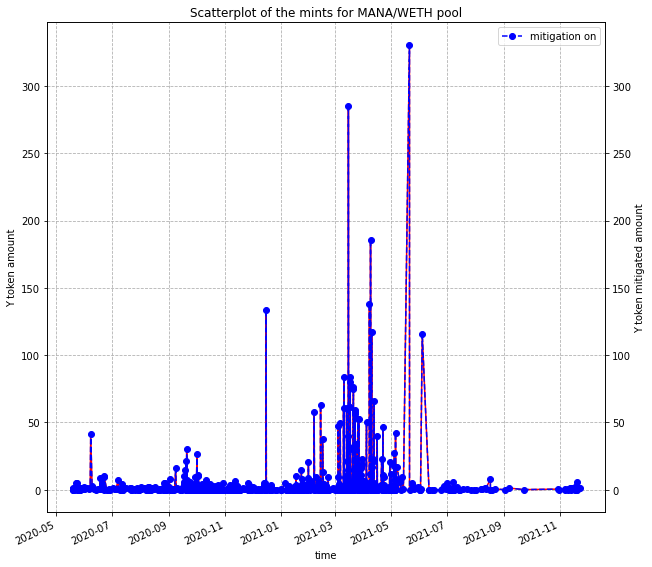

In [26]:
plot_mints(mana_weth_mints_mitigation_on_df, mana_weth_mints_mitigation_off_df, pool_name='MANA/WETH')

## MEV transactions extraction and analysis

### MEV attacks and possible MEVs extraction

There are 136 MEV attacks performed on the pool and 8789 possible attacks

In [6]:
mana_weth_filtered_swaps_df, mana_weth_mevs_df = mana_weth_sim.extract_filtered_and_mevs_dfs()

initial len = 71999, filtered len = 71175
txds = 824
out values = 412


In [28]:
mana_weth_suspicious_filtered_swaps_df, mana_weth_possible_mevs_df = mana_weth_sim.extract_suspicious_and_filtered_swaps_dfs()

initial len = 71999, filtered len = 70857
txds = 1142
out values = 571.0


In [29]:
mana_weth_mevs_df = mana_weth_sim.calculate_attack_profit(mana_weth_mevs_df)

### Plotting values of MEVs and possible MEVs with filtered swaps values

In [30]:
mana_weth_mevs_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd,profit
0,MANA,WETH,2381.293568,0.457245,103.673264,2020-06-21 01:48:01,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x263039051ae2d90c7df6aac281f1cea72fd8cb884044...,0.348852
1,WETH,MANA,0.455000,2381.293568,103.324412,2020-06-21 01:48:01,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0xaaa2e80ab7d7b3c216af30fc8165e7823e74cc62,0xdc55cd0b06400b1145028d27ac0cb1444451f8637771...,0.348852
2,WETH,MANA,1.596094,8992.203316,610.719618,2020-09-17 05:42:41,0x743dd3139c6b70f664ab4329b2cde646f0bac99a,0x743dd3139c6b70f664ab4329b2cde646f0bac99a,0x00fdc90ee71401a966cd88088c6701227d9859416e43...,56.850345
3,MANA,WETH,8992.203316,1.773011,667.569963,2020-09-17 05:42:41,0x743dd3139c6b70f664ab4329b2cde646f0bac99a,0x743dd3139c6b70f664ab4329b2cde646f0bac99a,0x730c87b3843b5ebc6ea52dc55ebcbc60b3c74c60644a...,56.850345
4,WETH,MANA,0.878126,3888.450000,294.572598,2020-09-23 09:26:34,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x1d6c43b4d829334d88ce609d7728dc5f4736b3c7,0x22645626f338868d593ddd1fdd68ad19637d9312db2b...,1.258084
...,...,...,...,...,...,...,...,...,...,...
819,MANA,WETH,8424.198350,8.376879,33691.529275,2021-11-18 22:04:16,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x8a2d49cc6c97122d47edee4ea8938eea01e432346e48...,217.100746
820,MANA,WETH,13949.808302,14.054855,56315.848731,2021-11-18 22:14:55,0x0000000000b92ac90d898eba87fa5f2483f32234,0x0000000000b92ac90d898eba87fa5f2483f32234,0x3e84b3f4620aefbc5a6cf712bb301c1f7a9c792c3153...,1276.687095
821,WETH,MANA,13.736229,13949.808302,55039.161637,2021-11-18 22:14:55,0x0000000000b92ac90d898eba87fa5f2483f32234,0x0000000000b92ac90d898eba87fa5f2483f32234,0xa25e91ada9bed356950bfdb451b28099dab655301d84...,1276.687095
822,WETH,MANA,10.170380,10579.185460,43398.317335,2021-11-19 19:17:57,0x00000000a1f2d3063ed639d19a6a56be87e25b1a,0x00000000a1f2d3063ed639d19a6a56be87e25b1a,0x17b8fdbe43e88eb5424eef2af00ad450a17a876320e8...,1311.880516


In [31]:
mana_weth_mevs_df[mana_weth_mevs_df['profit'] == mana_weth_mevs_df['profit'].max()]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd,profit
682,WETH,MANA,157.614400,157934.997453,676320.821948,2021-10-30 23:09:24,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x19bf1bbac36753fc08590829eb6f2900938529eb9c55...,18413.418116
683,MANA,WETH,157934.997453,161.905588,694734.240064,2021-10-30 23:09:24,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x2b46aa4d666e4b1efd5346abaf1a68b4dc78c99fce5a...,18413.418116


In [32]:
mana_weth_possible_mevs_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd
912,MANA,WETH,3151.239145,0.532322,126.257659,2020-07-10 20:11:56,0x2cfc01e9da094b41b15f8284c6b0b3d3204f3942,0x2cfc01e9da094b41b15f8284c6b0b3d3204f3942,0x676a9f786f817ff5cd2400b9e62b225cfce3db96bfc6...
913,WETH,MANA,0.536000,3151.239145,127.388720,2020-07-10 20:11:56,0x2cfc01e9da094b41b15f8284c6b0b3d3204f3942,0x2cfc01e9da094b41b15f8284c6b0b3d3204f3942,0x85e9479ec9a385b8527c51932b24f04e36a6ae489e39...
934,WETH,MANA,1.731597,10000.000000,412.496307,2020-07-11 12:51:58,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x36abe99e7661965fc873a800a1bb58068ba3f2f0,0x17009e64c0603af22f12d21dd2693bed9e8eda21ab86...
935,MANA,WETH,10482.933837,1.803133,423.775410,2020-07-11 12:51:58,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x4ee252e1db14cf8bdf51260d28bdbd9f730e93d91c9a...
1624,MANA,WETH,9678.692485,1.433910,444.997840,2020-07-29 00:34:49,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x79e0249815bb6111c7545f9d1307c03225a59d2892dc...
...,...,...,...,...,...,...,...,...,...
71922,MANA,WETH,68186.669937,69.771339,294646.699236,2021-11-19 15:25:19,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,0xcf0f5bade7968e1ede7839637e4354b4d0e216216710...
71950,WETH,MANA,6.547937,6623.813662,27673.019184,2021-11-19 16:54:24,0x00000000500e2fece27a7600435d0c48d64e0c00,0x00000000500e2fece27a7600435d0c48d64e0c00,0x14c01c2a54709f7d1e252e37af16684efb2fbf994a69...
71951,MANA,WETH,6623.807038,6.604556,27919.631652,2021-11-19 16:54:24,0x00000000500e2fece27a7600435d0c48d64e0c00,0x00000000500e2fece27a7600435d0c48d64e0c00,0xb414426fe3dd7d558eddc88a1378d0f5d7b818f259c3...
71972,WETH,MANA,10.170380,10579.185460,43398.317335,2021-11-19 19:17:57,0x00000000a1f2d3063ed639d19a6a56be87e25b1a,0x00000000a1f2d3063ed639d19a6a56be87e25b1a,0x17b8fdbe43e88eb5424eef2af00ad450a17a876320e8...


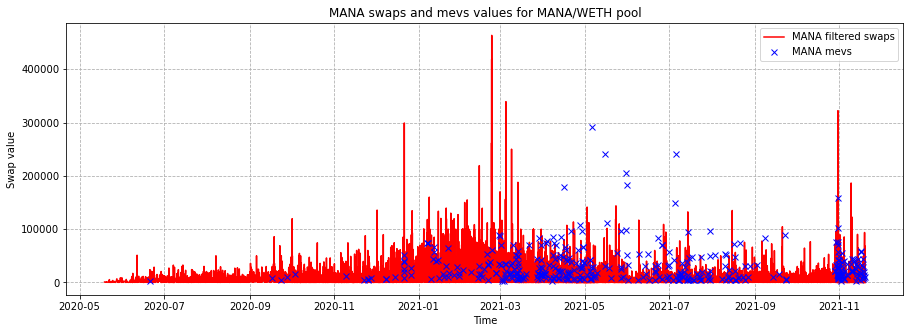

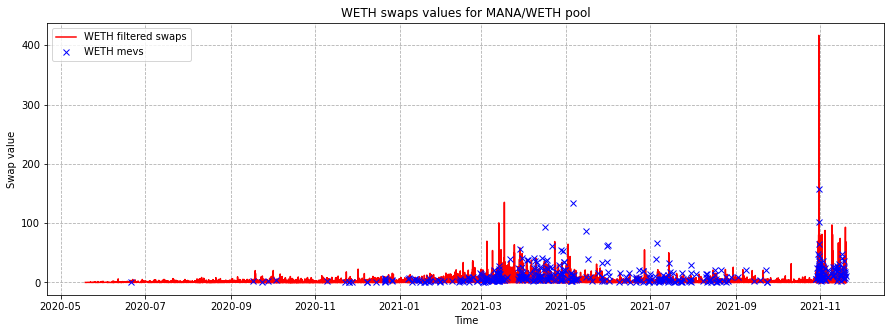

In [30]:
mana_weth_sim.show_swaps_and_mevs_by_token(mana_weth_filtered_swaps_df, mana_weth_mevs_df, width=15, height=5)

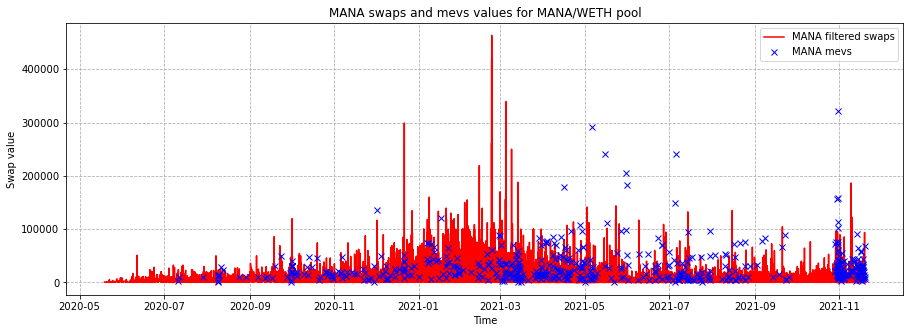

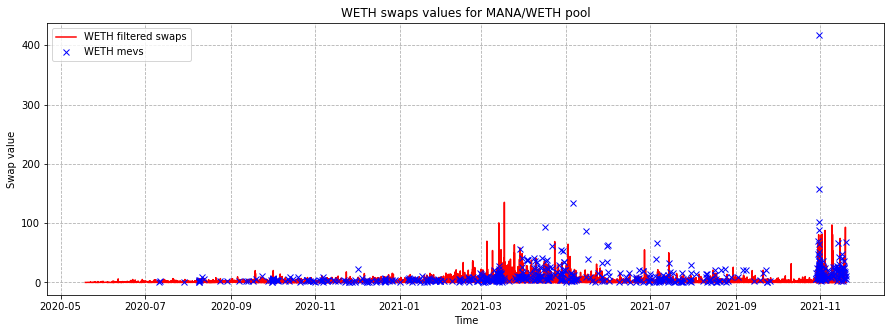

In [31]:
mana_weth_sim.show_swaps_and_mevs_by_token(mana_weth_suspicious_filtered_swaps_df, mana_weth_possible_mevs_df, width=15, height=5)

### Plotting MEV transactions and possible MEV transactions with filtered swaps daily count distributions

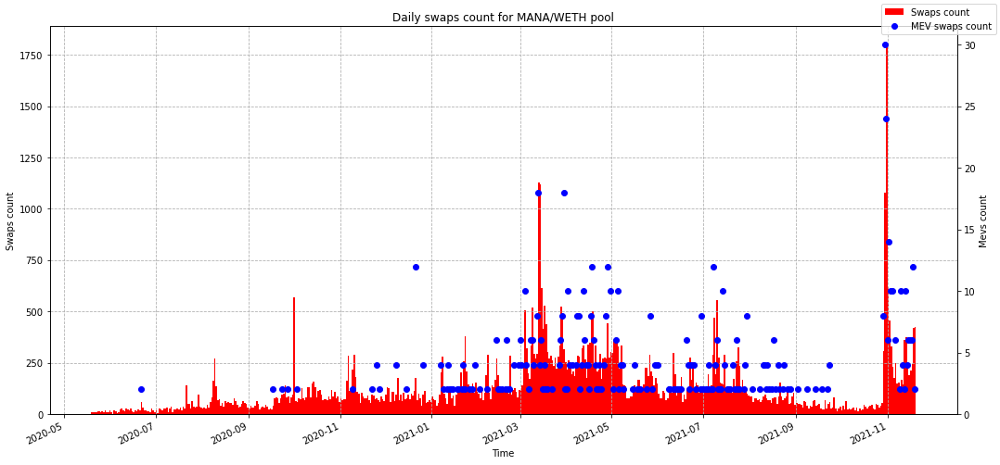

In [32]:
mana_weth_sim.show_swaps_and_mevs_daily_count_by_token(mana_weth_filtered_swaps_df, mana_weth_mevs_df, mevs_alter_axis=True)

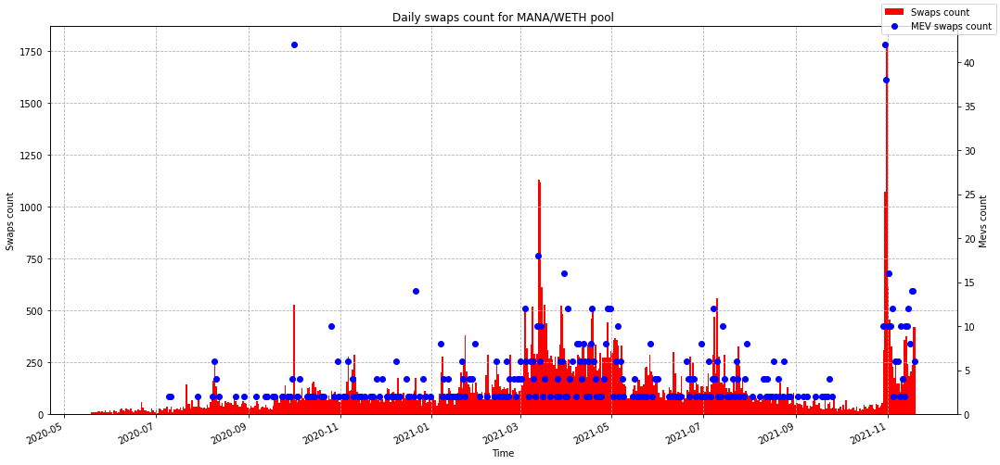

In [33]:
mana_weth_sim.show_swaps_and_mevs_daily_count_by_token(mana_weth_suspicious_filtered_swaps_df, mana_weth_possible_mevs_df, mevs_alter_axis=True)

### Plotting ratio of MEV attacks to filtered swaps

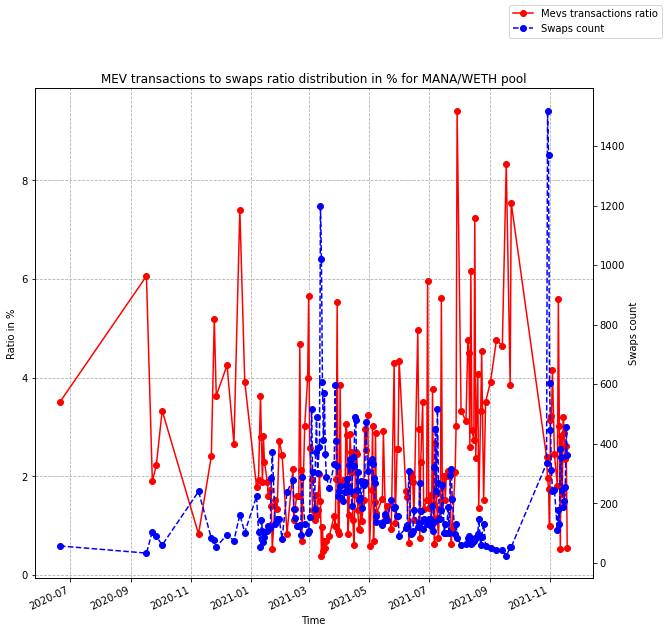

In [34]:
mana_weth_sim.show_mevs_to_swaps_ratio(mana_weth_filtered_swaps_df, mana_weth_mevs_df)

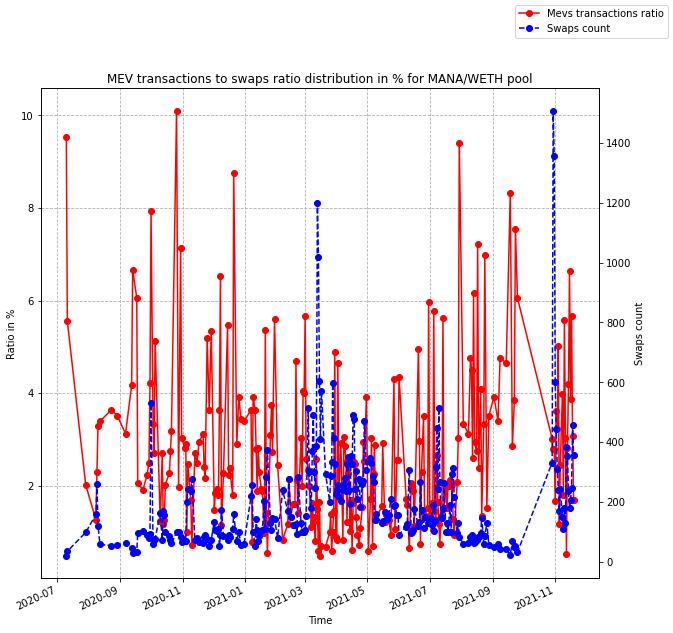

In [35]:
mana_weth_sim.show_mevs_to_swaps_ratio(mana_weth_suspicious_filtered_swaps_df, mana_weth_possible_mevs_df)

### Plotting ratio of MEVs and suspicious transactions to filtered swaps

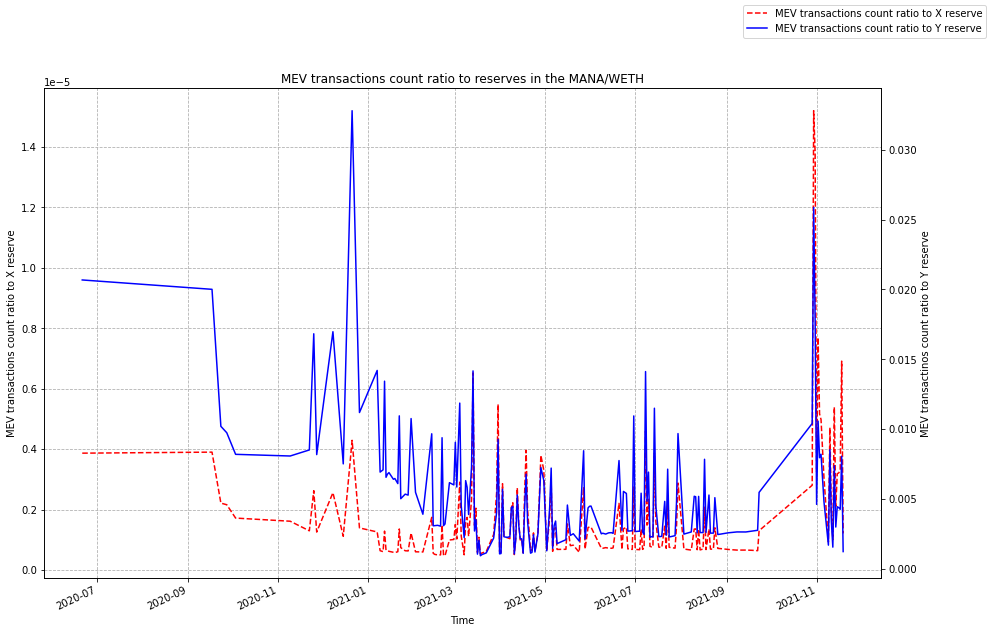

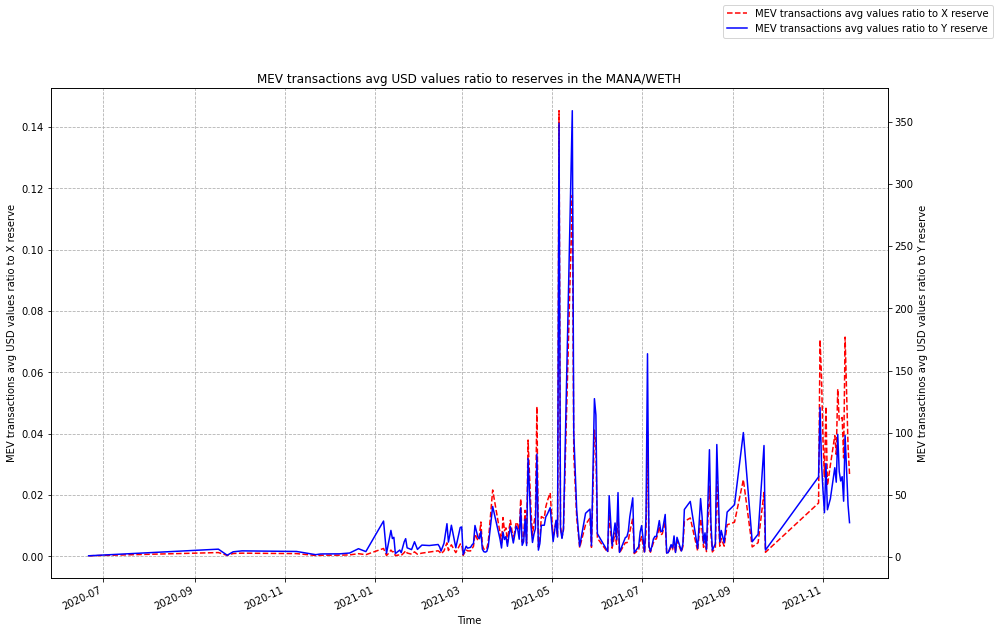

In [36]:
mana_weth_sim.show_mevs_to_reserves_ratio(mana_weth_swaps_mitigation_off_df, mana_weth_mevs_df, width=15, height=10)
mana_weth_sim.show_mevs_values_to_reserves_ratio(mana_weth_swaps_mitigation_off_df, mana_weth_mevs_df, width=15, height=10)

### Plotting transaction values distribution of passed swaps, blocked swaps and not enough reserves swaps

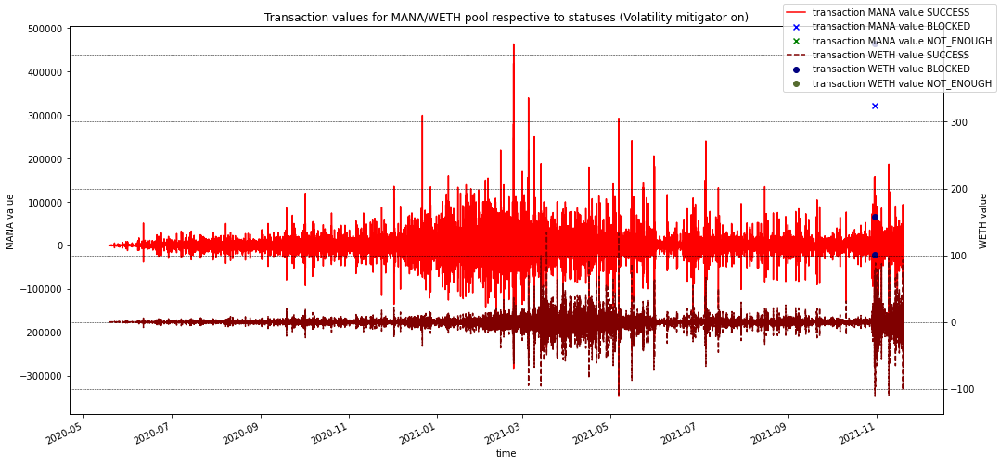

In [37]:
mana_weth_sim.plot_transactions_by_type(mana_weth_swaps_mitigation_on_df, ignore_success=False, width=15, height=7)

### Plotting mitigation comparison, slice factor distribution, reserves distributions, cumulative prices distributions, transaction frequency distributions, price impact after each transaction distributions

Original MANA/WETH pool has next statuses counts:
SUCCESS    71999
Name: status, dtype: int64
Mitigated MANA/WETH dataframe has next statuses counts:
SUCCESS                             71995
BLOCKED_BY_VOLATILITY_MITIGATION        4
Name: status, dtype: int64
TWAP unavailability ratio for MANA/WETH is 1.3889081792802678e-05
Mitigated MANA/WETH dataframe has next Mitigator statuses:
CHECKED                71998
CANT_CONSULT_ORACLE        1
Name: mitigator_check_status, dtype: int64


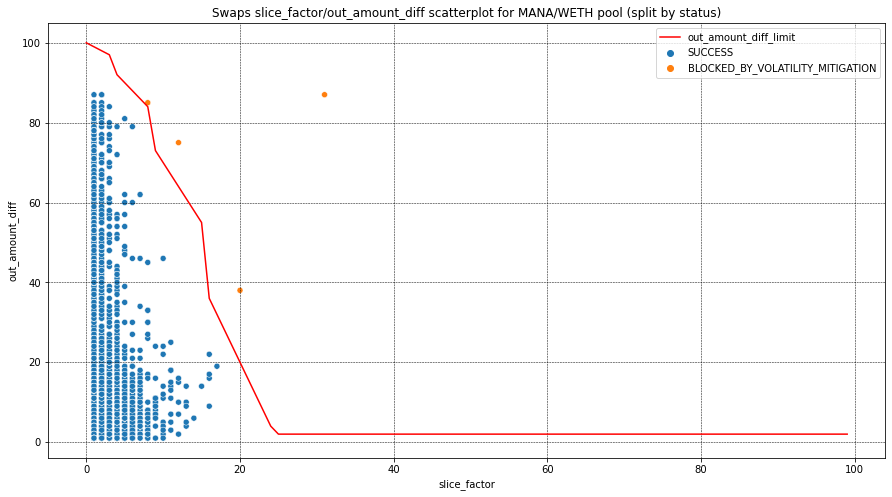

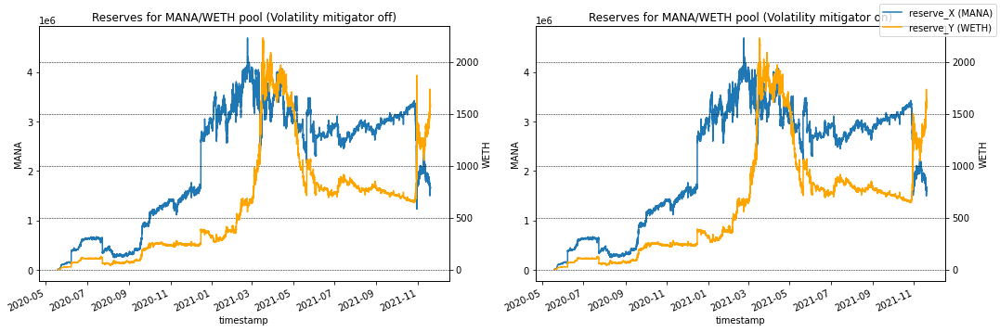

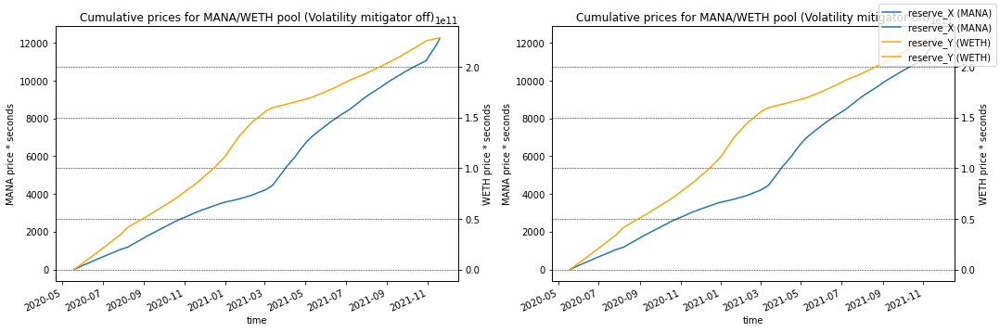

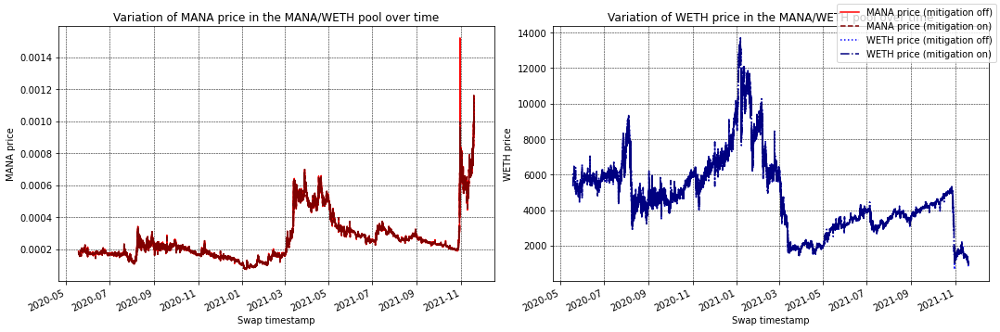

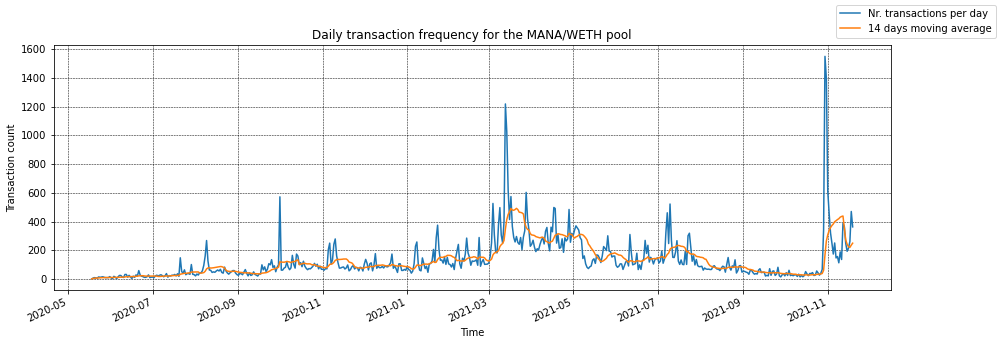

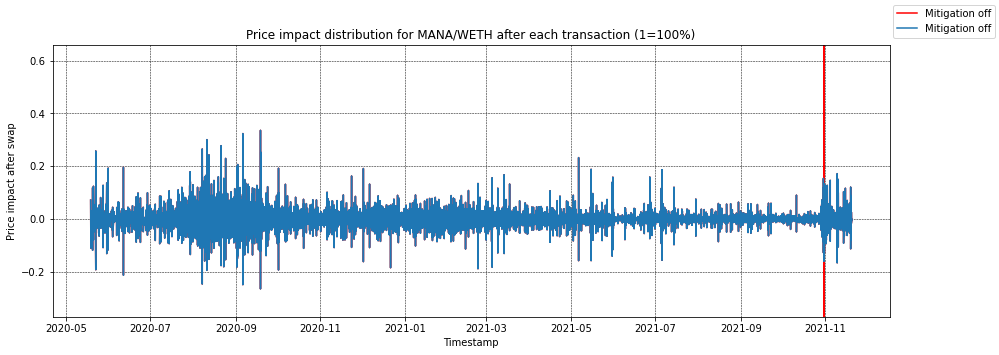

In [38]:
mana_weth_sim.show_mitigation_comparison(mana_weth_swaps_mitigation_off_df, mana_weth_swaps_mitigation_on_df)
mana_weth_sim.px_hist_blocked_transactions_slice(mana_weth_swaps_mitigation_on_df)
mana_weth_sim.px_hist_blocked_transactions_difference_from_oracle(mana_weth_swaps_mitigation_on_df)
mana_weth_sim.plot_slice_distribution_and_diff_limit_line(mana_weth_swaps_mitigation_on_df)
mana_weth_sim.plot_reserves_with_and_without_mitigation(mana_weth_swaps_mitigation_off_df, mana_weth_swaps_mitigation_on_df)
mana_weth_sim.plot_cumulative_prices_with_and_without_mitigation(mana_weth_swaps_mitigation_off_df, mana_weth_swaps_mitigation_off_df)
mana_weth_sim.plot_price_distribution(mana_weth_swaps_mitigation_off_df, mana_weth_swaps_mitigation_on_df, separate_plots=True)
mana_weth_sim.plot_frequency_distribution(mana_weth_swaps_mitigation_on_df)
mana_weth_sim.plot_price_impact(mana_weth_swaps_mitigation_off_df, mana_weth_swaps_mitigation_on_df, 
                                smallest_y=mana_weth_swaps_mitigation_off_df['price_diff'].min(), 
                                biggest_y=mana_weth_swaps_mitigation_off_df['price_diff'].max())

In [39]:
mana_weth_blocked_df = mana_weth_swaps_mitigation_on_df[mana_weth_swaps_mitigation_on_df['status'] == 'BLOCKED_BY_VOLATILITY_MITIGATION']
mana_weth_blocked_mevs_df = pd.merge(mana_weth_blocked_df, mana_weth_mevs_df, on='txd')
mana_weth_blocked_mevs_df

,id,token_in_x,token_out_x,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender_x,to_x,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff,token_in_y,token_out_y,amount_in,amount_out,amount_usd,timestamp,sender_y,to_y,profit
0,66696,WETH,MANA,101.3944,0.0,104953.044880,NaN,CHECKED,260962.423593,85.0,8.0,16.0,BLOCKED_BY_VOLATILITY_MITIGATION,3053576,2021-10-30 22:54:36,2021-10-30 22:54:24,0xe1dc71519543d701b017004215a1077b16d21b9fdada...,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,66696,1.595474e+06,1425.581717,2.274478e+09,11100,226203538886,True,1.595474e+06,1425.581717,2.274478e+09,11100,226203538886,True,0.000894,0.0,WETH,MANA,101.3944,102409.400099,433368.819987,2021-10-30 22:54:24,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,8005.056912
1,66750,WETH,MANA,157.6144,0.0,180277.964609,NaN,CHECKED,398712.177485,75.0,12.0,36.0,BLOCKED_BY_VOLATILITY_MITIGATION,3053636,2021-10-30 23:09:36,2021-10-30 23:09:24,0x19bf1bbac36753fc08590829eb6f2900938529eb9c55...,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,66750,1.714919e+06,1328.297315,2.277923e+09,11101,226204690222,True,1.714919e+06,1328.297315,2.277923e+09,11101,226204709588,True,0.000775,0.0,WETH,MANA,157.6144,157934.997453,676320.821948,2021-10-30 23:09:24,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,18413.418116


In [33]:
mana_weth_blocked_df = mana_weth_swaps_mitigation_on_df[mana_weth_swaps_mitigation_on_df['status'] == 'BLOCKED_BY_VOLATILITY_MITIGATION']
mana_weth_blocked_mevs_df = pd.merge(mana_weth_blocked_df, mana_weth_possible_mevs_df, on='txd')
mana_weth_blocked_mevs_df

,id,token_in_x,token_out_x,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender_x,to_x,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff,token_in_y,token_out_y,amount_in,amount_out,amount_usd,timestamp,sender_y,to_y
0,66696,WETH,MANA,101.394400,0.0,104953.044880,NaN,CHECKED,260962.423593,85.0,8.0,16.0,BLOCKED_BY_VOLATILITY_MITIGATION,3053576,2021-10-30 22:54:36,2021-10-30 22:54:24,0xe1dc71519543d701b017004215a1077b16d21b9fdada...,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,66696,1.595474e+06,1425.581717,2.274478e+09,11100,226203538886,True,1.595474e+06,1425.581717,2.274478e+09,11100,226203538886,True,0.000894,0.0,WETH,MANA,101.394400,102409.400099,4.333688e+05,2021-10-30 22:54:24,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d
1,66750,WETH,MANA,157.614400,0.0,180277.964609,NaN,CHECKED,398712.177485,75.0,12.0,36.0,BLOCKED_BY_VOLATILITY_MITIGATION,3053636,2021-10-30 23:09:36,2021-10-30 23:09:24,0x19bf1bbac36753fc08590829eb6f2900938529eb9c55...,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,66750,1.714919e+06,1328.297315,2.277923e+09,11101,226204690222,True,1.714919e+06,1328.297315,2.277923e+09,11101,226204709588,True,0.000775,0.0,WETH,MANA,157.614400,157934.997453,6.763208e+05,2021-10-30 23:09:24,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d
2,67034,WETH,MANA,416.647577,0.0,385352.442036,NaN,CHECKED,981528.045239,87.0,31.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,3054162,2021-10-31 01:21:06,2021-10-31 01:20:52,0x5405aa851d1ae34b2fd5f01ef9705ebd19431f94f498...,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,67034,1.669716e+06,1374.782229,2.295496e+09,11106,226215601071,True,1.669716e+06,1374.782229,2.295496e+09,11106,226215673943,True,0.000823,0.0,WETH,MANA,416.647577,322138.347555,1.826339e+06,2021-10-31 01:20:52,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40
3,67037,MANA,WETH,322138.348763,0.0,227.330893,NaN,CHECKED,153.472894,38.0,20.0,80.0,BLOCKED_BY_VOLATILITY_MITIGATION,3054162,2021-10-31 01:21:06,2021-10-31 01:20:52,0xb9bfa01c3d3308a5451b0e6029f2f525f920ea9c72f2...,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,67037,1.642265e+06,1397.972757,2.295842e+09,11106,226215673943,True,1.642265e+06,1397.972757,2.295842e+09,11106,226215673943,True,0.000851,0.0,MANA,WETH,322138.348763,429.238601,1.881530e+06,2021-10-31 01:20:52,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40


# ENJ/WETH (NFT)

In [40]:
enj_weth_mints_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,0,17232.487792,12.826616,1589839109,SUCCESS,0,1589839109,1589839109,0,0.000000,0.000000,0.000000e+00,0,0,False,17232.487792,12.826616,2.210345e+05,0,0,False
1,1,2108.580074,1.569474,1589842118,SUCCESS,201,1589842124,1589842118,1,17232.487792,12.826616,2.210345e+05,0,0,False,19341.067866,14.396091,2.784358e+05,0,0,False
2,2,268.828166,0.200096,1589842178,SUCCESS,205,1589842184,1589842178,2,19341.067866,14.396091,2.784358e+05,0,0,False,19609.896031,14.596187,2.862297e+05,0,0,False
3,4,3060.607620,2.356681,1589851038,SUCCESS,796,1589851049,1589851038,4,19282.925428,14.845187,2.862586e+05,0,0,False,22343.533049,17.201868,3.843505e+05,0,0,False
4,14,315.332743,0.240934,1589894441,SUCCESS,3689,1589894444,1589894441,14,22433.035649,17.136130,3.844154e+05,32,53733216,False,22748.368392,17.377065,3.952999e+05,32,53733216,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
947,74876,1152.000000,0.756470,1636037138,SUCCESS,3079869,1636037144,1636037138,74876,601517.145787,544.281591,3.273947e+08,26410,104058418233,False,602669.145787,545.038061,3.284776e+08,26410,104058418233,False
948,75763,178.909394,0.123547,1637132087,SUCCESS,3152866,1637132099,1637132087,75763,606888.930131,539.290642,3.272895e+08,27348,105345908221,False,607067.839525,539.414189,3.274610e+08,27348,105345908221,False
949,76064,340.200831,0.294524,1637423712,SUCCESS,3172307,1637423714,1637423712,76064,602618.101628,543.770374,3.276859e+08,27606,105674575082,False,602958.302459,544.064898,3.280484e+08,27606,105674575082,False
950,76430,526.395460,0.499812,1637725647,SUCCESS,3192436,1637725649,1637725647,76430,491069.974319,676.101601,3.320132e+08,27879,106012460634,False,491596.369779,676.601413,3.326148e+08,27879,106012460634,False


In [41]:
enj_weth_burns_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,100,359.640139,0.324013,1590114864,SUCCESS,18384,1590114869,1590114864,100,76007.886482,68.697628,5.221561e+06,206,321864618,False,75648.246343,68.373614,5.172344e+06,206,321864618,False
1,128,354.773011,0.297889,1590172953,SUCCESS,22257,1590172964,1590172953,128,78462.118190,66.024398,5.180414e+06,263,398055007,False,78107.345179,65.726509,5.133723e+06,263,398055007,False
2,180,4879.430957,4.020403,1590314127,SUCCESS,31668,1590314129,1590314127,180,104301.932523,85.882863,8.957749e+06,384,565575040,False,99422.501566,81.862461,8.138971e+06,384,565575040,False
3,181,4759.360616,3.921471,1590314187,SUCCESS,31672,1590314189,1590314187,181,99422.501566,81.862461,8.138971e+06,384,565575040,False,94663.140950,77.940990,7.378139e+06,384,565575040,False
4,190,13591.069990,11.301433,1590345257,SUCCESS,33744,1590345269,1590345257,190,94264.370403,78.305680,7.381436e+06,404,595199923,False,80673.300412,67.004248,5.405454e+06,404,595199923,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
737,75590,609.870037,0.397470,1636915584,SUCCESS,3138432,1636915589,1636915584,75590,632322.854521,511.002945,3.231188e+08,27159,105085629756,False,631712.984484,510.605475,3.225561e+08,27159,105085629756,False
738,75738,190.482613,0.129985,1637099107,SUCCESS,3150667,1637099114,1637099107,75738,603130.908916,542.731833,3.273383e+08,27318,105309091130,False,602940.426303,542.601849,3.271566e+08,27318,105309091130,False
739,75815,1236.481371,0.846058,1637215626,SUCCESS,3158435,1637215634,1637215626,75815,616246.381763,531.703001,3.276601e+08,27420,105438265926,False,615009.900393,530.856943,3.264823e+08,27420,105438265926,False
740,76126,87.999242,0.071368,1637484958,SUCCESS,3176390,1637484959,1637484958,76126,613612.026315,535.148636,3.283736e+08,27661,105744657944,False,613524.027074,535.077268,3.282828e+08,27661,105744657944,False


In [42]:
enj_weth_swaps_mitigation_off_df

,id,token_in,token_out,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender,to,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff
0,3,WETH,ENJ,0.250000,0.0,326.970603,0.001000,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,595.0,2020-05-19 00:27:14,2020-05-19 00:27:03,0x70eb748663e95bcbfa16a060822a419c501198aeeaef...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x52cc3da7d6907b25fcd4e2c3b83f7edc5b31c949,3,19609.896031,14.596187,2.862297e+05,0,0,False,19282.925428,14.845187,2.862586e+05,0,0,False,0.000770,0.034305
1,5,WETH,ENJ,0.003249,0.0,4.177344,0.000013,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,829.0,2020-05-19 01:25:44,2020-05-19 01:25:30,0x9bb753a638997e639952f3fc859e523877b35e0021e5...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x1880b9b34fc7f59cb43dd53a6b5c6de9fedfd271,5,22343.533049,17.201868,3.843505e+05,0,0,False,22339.355704,17.205104,3.843509e+05,2,4559144,False,0.000770,0.000375
2,6,WETH,ENJ,0.050000,0.0,64.087132,0.000200,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,922.0,2020-05-19 01:48:59,2020-05-19 01:48:49,0xad45c006d28353fc5e472a850237dadea38688234e7d...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x537158466a8ca115157f0b291a984efa8e528876,6,22339.355704,17.205104,3.843509e+05,2,4559144,False,22275.268573,17.254904,3.843576e+05,3,6370432,False,0.000775,0.005780
3,7,WETH,ENJ,0.050000,0.0,63.719373,0.000200,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,938.0,2020-05-19 01:52:59,2020-05-19 01:52:46,0xc6d101a2253e47f58f62eb809cfca170542695561b6e...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x0b2387b557e4f1ce550047cf1639249cd9db886c,7,22275.268573,17.254904,3.843576e+05,3,6370432,False,22211.549200,17.304704,3.843643e+05,3,6680261,False,0.000779,0.005763
4,8,WETH,ENJ,0.010000,0.0,12.699934,0.000040,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,954.0,2020-05-19 01:56:59,2020-05-19 01:56:57,0xd7de4379d9a6c45e84d92da6ebade9de48da8e531c94...,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x672b8144fe28a33bfe9678e880ff2e78b4c82705,8,22211.549200,17.304704,3.843643e+05,3,6680261,False,22198.849265,17.314664,3.843656e+05,4,6988314,False,0.000780,0.001148
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74870,76564,WETH,ENJ,1.181879,0.0,919.849455,0.004728,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,3195324.0,2021-11-24 15:49:29,2021-11-24 15:49:20,0x5c9809f233381a474f8e185fabf404bcdc20257ee85e...,0x6f8fa2495bd93c2a8f3984f1b1bd761bc1689eb4,0x6f8fa2495bd93c2a8f3984f1b1bd761bc1689eb4,76564,510635.939979,648.365250,3.310786e+08,27935,106045210870,False,509716.090524,649.542401,3.310822e+08,27936,106045647974,False,0.001274,0.003623
74871,76565,ENJ,WETH,2304.294278,0.0,2.894096,0.011576,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,3195375.0,2021-11-24 16:02:14,2021-11-24 16:02:08,0xcbc8beb677625355510d257d15d30d972ce10c3b5b73...,0xdef1c0ded9bec7f1a1670819833240f027b25eff,0x9008d19f58aabd9ed0d60971565aa8510560ab41,76565,509716.090524,649.542401,3.310822e+08,27936,106045647974,False,512020.384801,646.636729,3.310912e+08,27937,106046248293,False,0.001263,-0.008954
74872,76566,ENJ,WETH,841.767937,0.0,1.050738,0.004203,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,3195393.0,2021-11-24 16:06:44,2021-11-24 16:06:42,0x786495220790e0f4e3c22ac79fc9f2c347a2e12d7a6e...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x0cecc726d097c756c62272f1180ebfff29cb57f9,76566,512020.384801,646.636729,3.310912e+08,27937,106046248293,False,512862.152739,645.581788,3.310945e+08,27937,106046462085,False,0.001259,-0.003270
74873,76567,WETH,ENJ,2.697346,0.0,2112.655134,0.010789,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,3195396.0,2021-11-24 16:07:29,2021-11-24 16:07:23,0x40

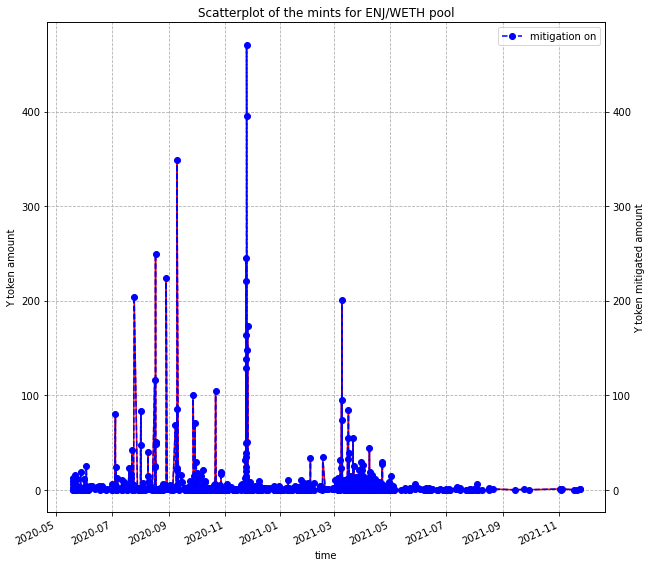

In [43]:
plot_mints(enj_weth_mints_mitigation_on_df, enj_weth_mints_mitigation_off_df, pool_name='ENJ/WETH')

## MEV transactions extraction and analysis

### MEV attacks and possible MEVs extraction

There are 136 MEV attacks performed on the pool and 8789 possible attacks

In [7]:
enj_weth_filtered_swaps_df, enj_weth_mevs_df = enj_weth_sim.extract_filtered_and_mevs_dfs()

initial len = 74876, filtered len = 74084
txds = 792
out values = 396


In [35]:
enj_weth_suspicious_filtered_swaps_df, enj_weth_possible_mevs_df = enj_weth_sim.extract_suspicious_and_filtered_swaps_dfs()

initial len = 74876, filtered len = 73812
txds = 1064
out values = 532.0


In [36]:
enj_weth_mevs_df = enj_weth_sim.calculate_attack_profit(enj_weth_mevs_df)

### Plotting values of MEVs and possible MEVs with filtered swaps values

In [37]:
enj_weth_mevs_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd,profit
0,ENJ,WETH,662.819938,0.535345,130.226365,2020-06-08 10:50:08,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0x76e6f84c717415f830511897756521926b8a78679c71...,0.550361
1,WETH,ENJ,0.532000,662.819938,129.676004,2020-06-08 10:50:08,0xf164fc0ec4e93095b804a4795bbe1e041497b92a,0xaaa2e80ab7d7b3c216af30fc8165e7823e74cc62,0xe2acd67928335b70a4d2cc89d7d871235070ddedba36...,0.550361
2,WETH,ENJ,0.985333,1297.063144,231.717919,2020-06-24 18:06:50,0xeca2e07abc83c78a7178c46b84962af86de342ff,0xeca2e07abc83c78a7178c46b84962af86de342ff,0x318e4daae6fb0bf639aae3461f9108c48ca61dee194d...,0.745406
3,ENJ,WETH,1297.063144,1.003827,230.972512,2020-06-24 18:06:50,0xeca2e07abc83c78a7178c46b84962af86de342ff,0xeca2e07abc83c78a7178c46b84962af86de342ff,0x74af70156234248ea93c0d3dcb7eb37bc2b8898a7cf0...,0.745406
4,ENJ,WETH,553.672738,0.405665,90.021480,2020-06-29 12:37:46,0xeca2e07abc83c78a7178c46b84962af86de342ff,0xeca2e07abc83c78a7178c46b84962af86de342ff,0x02340276cbca62ed21746076c0660bc92389be841768...,0.615229
...,...,...,...,...,...,...,...,...,...,...
787,WETH,ENJ,3.124676,3826.767730,13609.676308,2021-11-21 04:03:34,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,0xb03ba9ef250bd0092de7a74eae769c7b6ffc10b09a4b...,133.009338
788,ENJ,WETH,2396.686135,2.269874,9789.794720,2021-11-23 15:18:49,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,0x1b938f76c1ec07dfca2f23bc1c2aac2cc403d0090441...,139.934583
789,WETH,ENJ,2.237428,2396.686135,9649.860137,2021-11-23 15:18:49,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,0x44223fb45cc1daf338dc2a6e09d946e0afb576d97c8c...,139.934583
790,ENJ,WETH,6060.278615,5.998629,25582.406849,2021-11-24 06:00:00,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,0xad64f50ab093e30b287e1de370ad2e3bbaa358a02bd5...,71.659717


In [38]:
enj_weth_mevs_df[enj_weth_mevs_df['profit'] == enj_weth_mevs_df['profit'].max()]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd,profit
720,ENJ,WETH,119441.203284,101.144244,380036.633200,2021-09-02 12:15:13,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,0x3405caac5f15ed5ca2756a47ed2456a06f8ae5692aa5...,4299.350486
721,WETH,ENJ,100.000000,119441.203284,375737.282714,2021-09-02 12:15:13,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,0x46ca2cc2e52020b5b6ea91b6d8606de3657cd34f95a6...,4299.350486


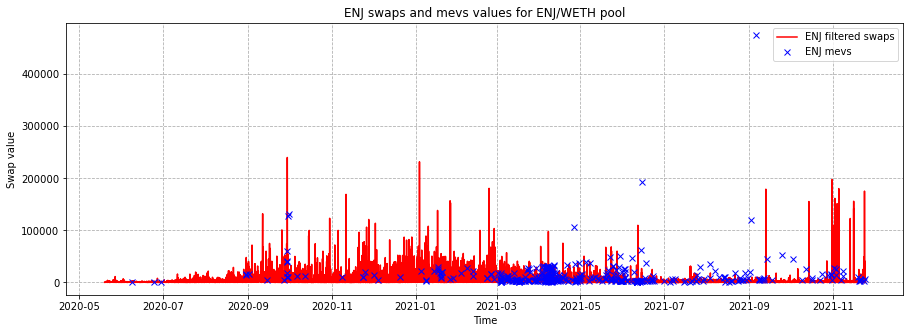

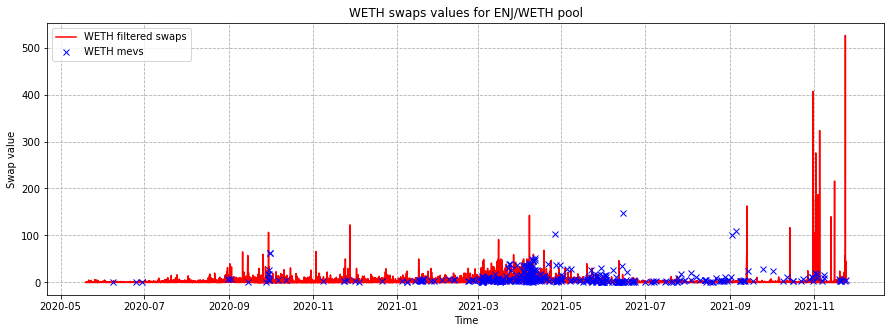

In [47]:
enj_weth_sim.show_swaps_and_mevs_by_token(enj_weth_filtered_swaps_df, enj_weth_mevs_df, width=15, height=5)

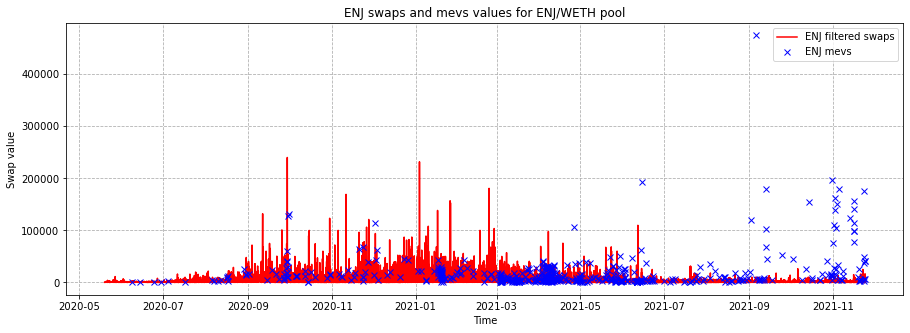

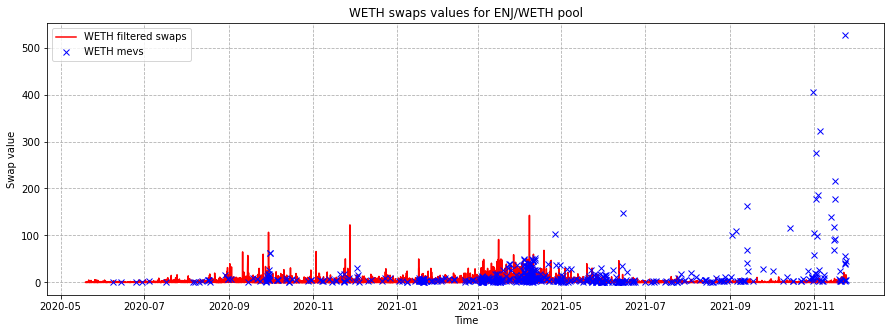

In [48]:
enj_weth_sim.show_swaps_and_mevs_by_token(enj_weth_suspicious_filtered_swaps_df, enj_weth_possible_mevs_df, width=15, height=5)

### Plotting MEV transactions and possible MEV transactions with filtered swaps daily count distributions

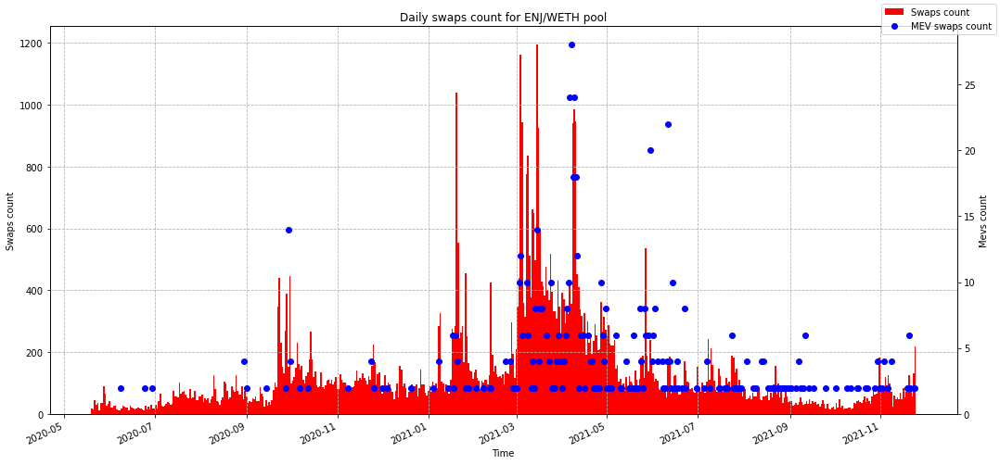

In [49]:
enj_weth_sim.show_swaps_and_mevs_daily_count_by_token(enj_weth_filtered_swaps_df, enj_weth_mevs_df, mevs_alter_axis=True)

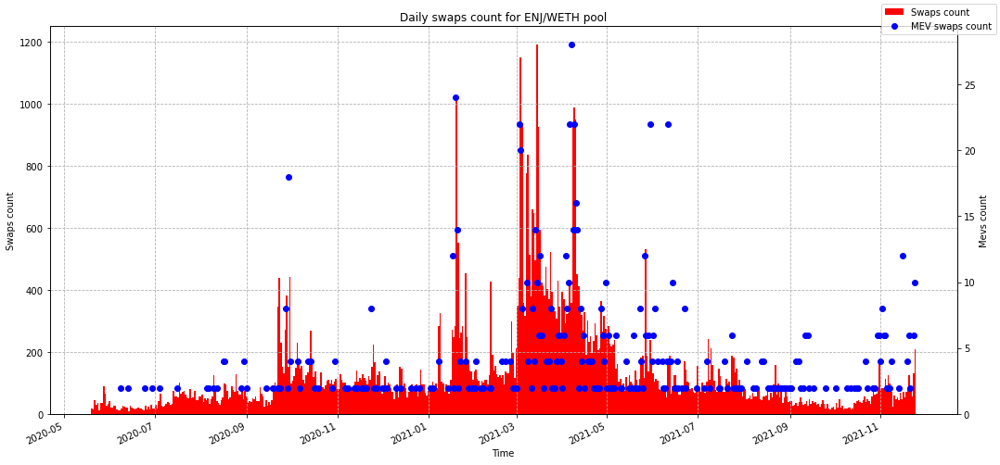

In [50]:
enj_weth_sim.show_swaps_and_mevs_daily_count_by_token(enj_weth_suspicious_filtered_swaps_df, enj_weth_possible_mevs_df, mevs_alter_axis=True)

### Plotting ratio of MEV attacks to filtered swaps

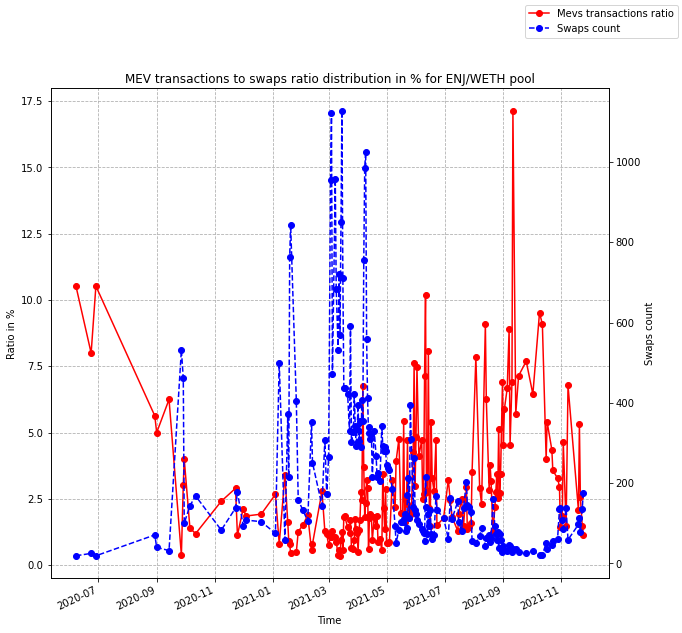

In [51]:
enj_weth_sim.show_mevs_to_swaps_ratio(enj_weth_filtered_swaps_df, enj_weth_mevs_df)

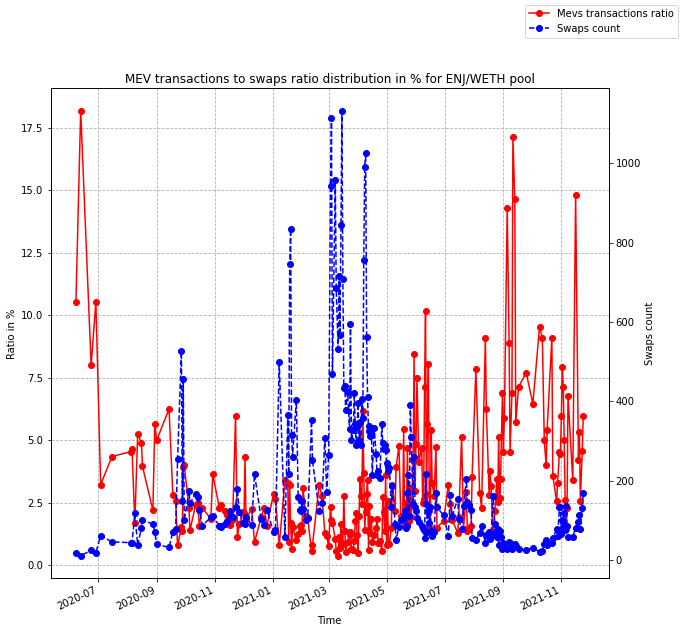

In [52]:
enj_weth_sim.show_mevs_to_swaps_ratio(enj_weth_suspicious_filtered_swaps_df, enj_weth_possible_mevs_df)

### Plotting ratio of MEVs and suspicious transactions to filtered swaps

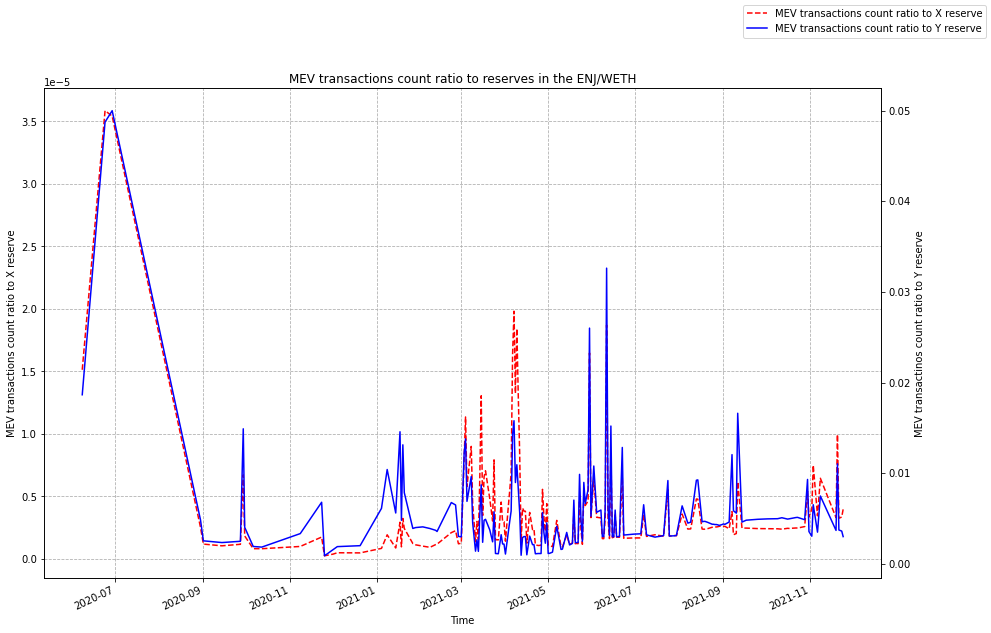

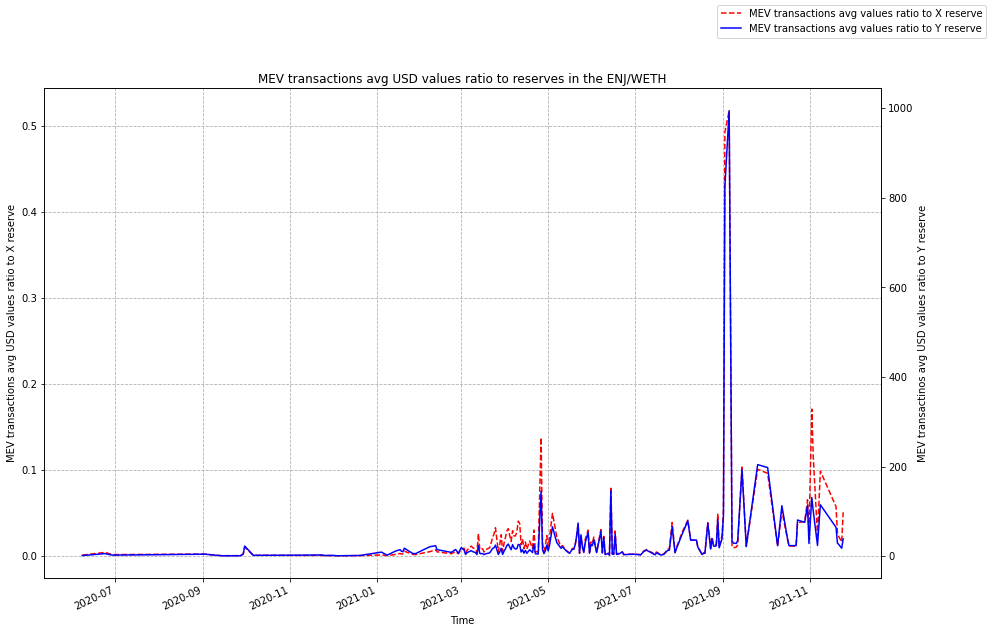

In [53]:
enj_weth_sim.show_mevs_to_reserves_ratio(enj_weth_swaps_mitigation_off_df, enj_weth_mevs_df, width=15, height=10)
enj_weth_sim.show_mevs_values_to_reserves_ratio(enj_weth_swaps_mitigation_off_df, enj_weth_mevs_df, width=15, height=10)

### Plotting transaction values distribution of passed swaps, blocked swaps and not enough reserves swaps

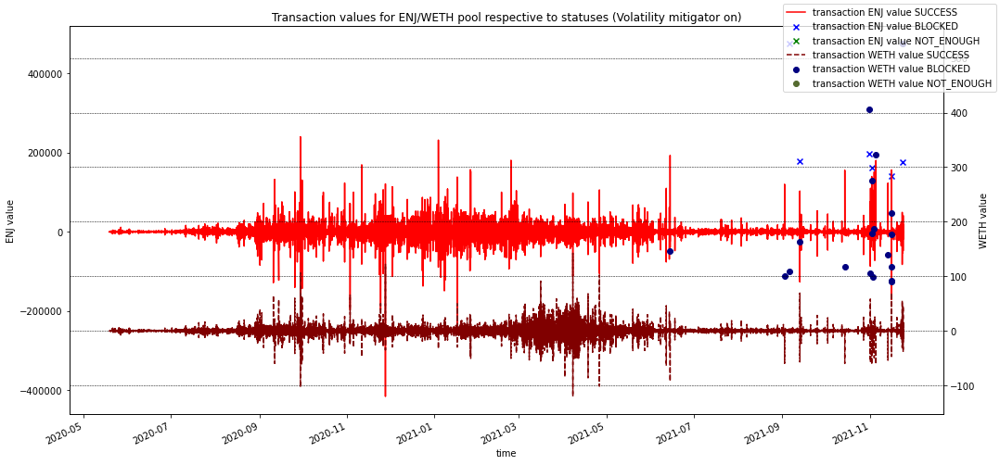

In [54]:
enj_weth_sim.plot_transactions_by_type(enj_weth_swaps_mitigation_on_df, ignore_success=False, width=15, height=7)

### Plotting mitigation comparison, slice factor distribution, reserves distributions, cumulative prices distributions, transaction frequency distributions, price impact after each transaction distributions

Original ENJ/WETH pool has next statuses counts:
SUCCESS    74875
Name: status, dtype: int64
Mitigated ENJ/WETH dataframe has next statuses counts:
SUCCESS                             74850
BLOCKED_BY_VOLATILITY_MITIGATION       25
Name: status, dtype: int64
TWAP unavailability ratio for ENJ/WETH is 1.335559265442404e-05
Mitigated ENJ/WETH dataframe has next Mitigator statuses:
CHECKED                74874
CANT_CONSULT_ORACLE        1
Name: mitigator_check_status, dtype: int64


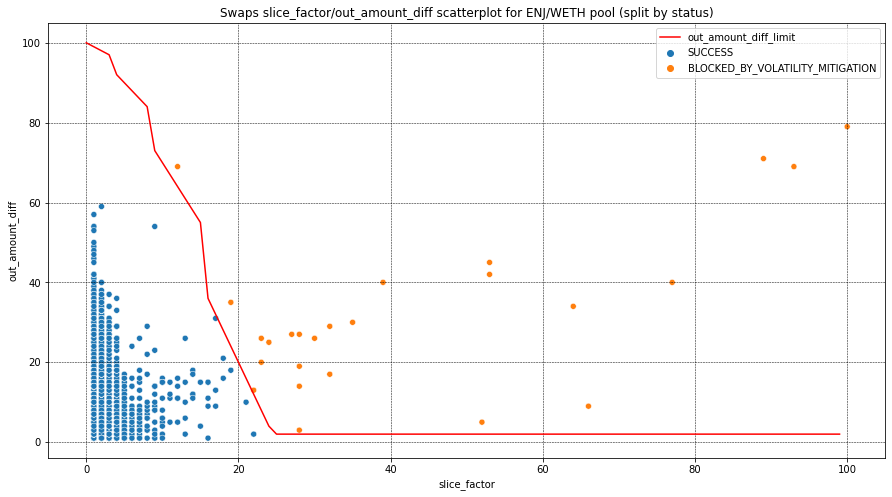

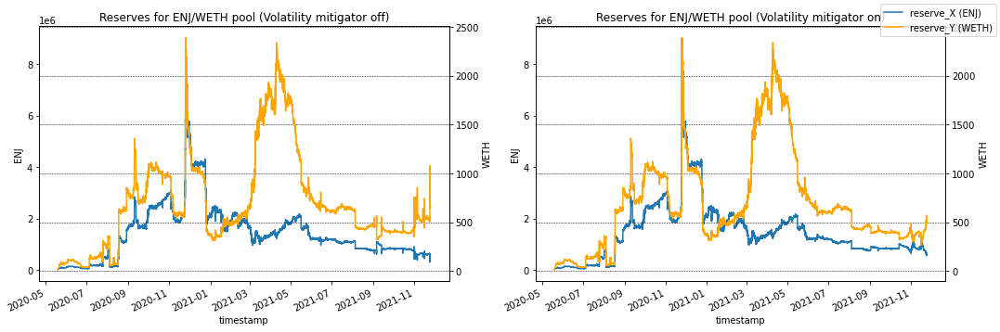

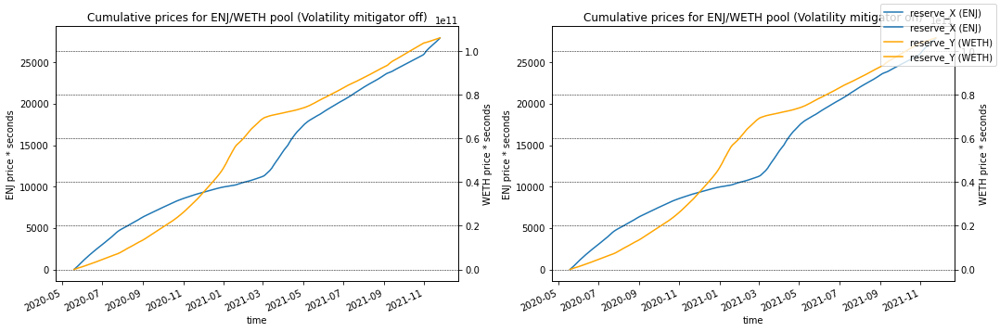

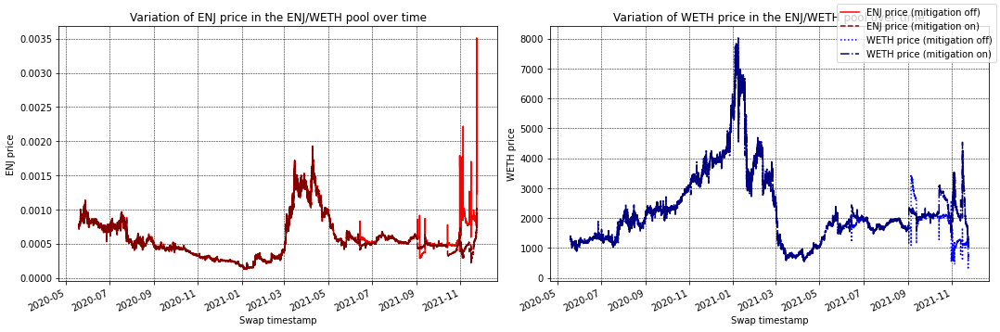

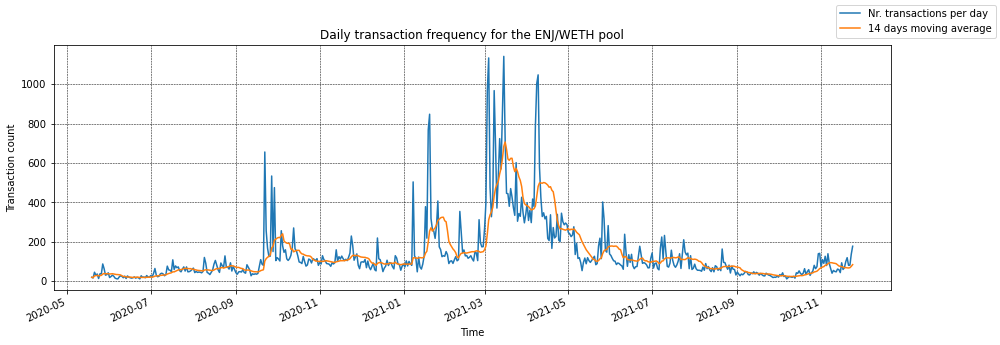

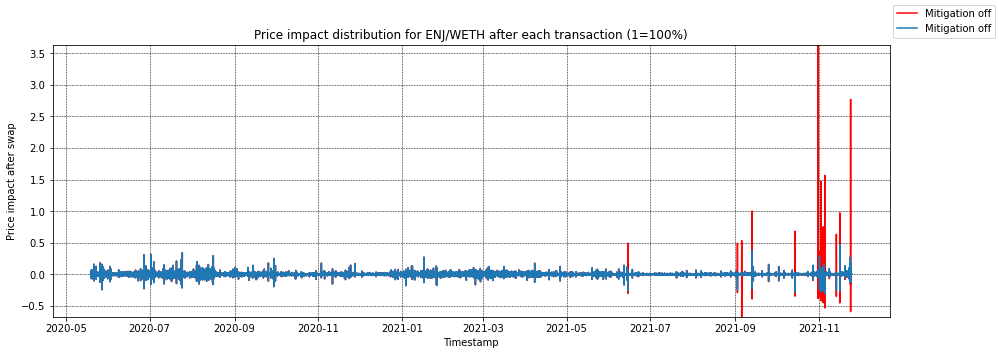

In [55]:
enj_weth_sim.show_mitigation_comparison(enj_weth_swaps_mitigation_off_df, enj_weth_swaps_mitigation_on_df)
enj_weth_sim.px_hist_blocked_transactions_slice(enj_weth_swaps_mitigation_on_df)
enj_weth_sim.px_hist_blocked_transactions_difference_from_oracle(enj_weth_swaps_mitigation_on_df)
enj_weth_sim.plot_slice_distribution_and_diff_limit_line(enj_weth_swaps_mitigation_on_df)
enj_weth_sim.plot_reserves_with_and_without_mitigation(enj_weth_swaps_mitigation_off_df, enj_weth_swaps_mitigation_on_df)
enj_weth_sim.plot_cumulative_prices_with_and_without_mitigation(enj_weth_swaps_mitigation_off_df, enj_weth_swaps_mitigation_off_df, make_big_num_convert=True)
enj_weth_sim.plot_price_distribution(enj_weth_swaps_mitigation_off_df, enj_weth_swaps_mitigation_on_df, separate_plots=True)
enj_weth_sim.plot_frequency_distribution(enj_weth_swaps_mitigation_on_df)
enj_weth_sim.plot_price_impact(enj_weth_swaps_mitigation_off_df, enj_weth_swaps_mitigation_on_df, 
                                smallest_y=enj_weth_swaps_mitigation_off_df['price_diff'].min(), 
                                biggest_y=enj_weth_swaps_mitigation_off_df['price_diff'].max())

In [56]:
enj_weth_blocked_df = enj_weth_swaps_mitigation_on_df[enj_weth_swaps_mitigation_on_df['status'] == 'BLOCKED_BY_VOLATILITY_MITIGATION']
enj_weth_blocked_mevs_df = pd.merge(enj_weth_blocked_df, enj_weth_mevs_df, on='txd')
enj_weth_blocked_mevs_df

,id,token_in_x,token_out_x,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender_x,to_x,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff,token_in_y,token_out_y,amount_in,amount_out,amount_usd,timestamp,sender_y,to_y,profit
0,64798,WETH,ENJ,146.950021,0.0,214326.824767,NaN,CHECKED,279696.081362,26.0,23.0,92.0,BLOCKED_BY_VOLATILITY_MITIGATION,2255979.0,2021-06-14 13:53:14,2021-06-14 13:53:10,0x457e11bd876883c21fbfb4cb2c099b3be4f50eb75876...,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,64798,1.186617e+06,659.969996,7.831316e+08,19651,80518283580,True,1.186617e+06,659.969996,7.831316e+08,19651,80518607218,True,0.000556,0.0,WETH,ENJ,146.950021,192999.675250,375919.246880,2021-06-14 13:53:10,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,639.258363
1,72184,WETH,ENJ,100.000000,0.0,141043.219538,NaN,CHECKED,173254.588109,20.0,23.0,92.0,BLOCKED_BY_VOLATILITY_MITIGATION,2716387.0,2021-09-02 12:15:14,2021-09-02 12:15:13,0x46ca2cc2e52020b5b6ea91b6d8606de3657cd34f95a6...,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,72184,7.796647e+05,448.256422,3.494897e+08,23424,93268495797,True,7.796647e+05,448.256422,3.494897e+08,23424,93270426451,True,0.000575,0.0,WETH,ENJ,100.000000,119441.203284,375737.282714,2021-09-02 12:15:13,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,4299.350486
2,72285,WETH,ENJ,109.616662,0.0,188762.807808,NaN,CHECKED,249043.693139,27.0,28.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2734364.0,2021-09-05 15:09:29,2021-09-05 15:09:16,0x526947bb7c1ed564d1da2535983c5b307e4683a5fb63...,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,72285,8.787655e+05,396.685316,3.485934e+08,23542,93886439769,True,8.787655e+05,396.685316,3.485934e+08,23542,93886439769,True,0.000451,0.0,WETH,ENJ,109.616662,481516.825905,430115.158190,2021-09-05 15:09:16,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,12.271375
3,72287,ENJ,WETH,474572.006540,0.0,135.646802,NaN,CHECKED,208.899696,42.0,53.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2734364.0,2021-09-05 15:09:29,2021-09-05 15:09:16,0x4864b6e6ae638c5d6b0468d487189d2c90ffc60526e7...,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,72287,8.887655e+05,392.248446,3.486169e+08,23542,93886439769,True,8.887655e+05,392.248446,3.486169e+08,23542,93886439769,True,0.000441,0.0,ENJ,WETH,474572.006540,109.616662,430127.429565,2021-09-05 15:09:16,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,12.271375


In [39]:
enj_weth_blocked_df = enj_weth_swaps_mitigation_on_df[enj_weth_swaps_mitigation_on_df['status'] == 'BLOCKED_BY_VOLATILITY_MITIGATION']
enj_weth_blocked_mevs_df = pd.merge(enj_weth_blocked_df, enj_weth_possible_mevs_df, on='txd')
enj_weth_blocked_mevs_df

,id,token_in_x,token_out_x,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender_x,to_x,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff,token_in_y,token_out_y,amount_in,amount_out,amount_usd,timestamp,sender_y,to_y
0,64798,WETH,ENJ,146.950021,0.0,214326.824767,NaN,CHECKED,279696.081362,26.0,23.0,92.0,BLOCKED_BY_VOLATILITY_MITIGATION,2255979.0,2021-06-14 13:53:14,2021-06-14 13:53:10,0x457e11bd876883c21fbfb4cb2c099b3be4f50eb75876...,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,64798,1.186617e+06,659.969996,7.831316e+08,19651,80518283580,True,1.186617e+06,659.969996,7.831316e+08,19651,80518607218,True,0.000556,0.0,WETH,ENJ,146.950021,192999.675250,3.759192e+05,2021-06-14 13:53:10,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40
1,72184,WETH,ENJ,100.000000,0.0,141043.219538,NaN,CHECKED,173254.588109,20.0,23.0,92.0,BLOCKED_BY_VOLATILITY_MITIGATION,2716387.0,2021-09-02 12:15:14,2021-09-02 12:15:13,0x46ca2cc2e52020b5b6ea91b6d8606de3657cd34f95a6...,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,72184,7.796647e+05,448.256422,3.494897e+08,23424,93268495797,True,7.796647e+05,448.256422,3.494897e+08,23424,93270426451,True,0.000575,0.0,WETH,ENJ,100.000000,119441.203284,3.757373e+05,2021-09-02 12:15:13,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e
2,72285,WETH,ENJ,109.616662,0.0,188762.807808,NaN,CHECKED,249043.693139,27.0,28.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2734364.0,2021-09-05 15:09:29,2021-09-05 15:09:16,0x526947bb7c1ed564d1da2535983c5b307e4683a5fb63...,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,72285,8.787655e+05,396.685316,3.485934e+08,23542,93886439769,True,8.787655e+05,396.685316,3.485934e+08,23542,93886439769,True,0.000451,0.0,WETH,ENJ,109.616662,481516.825905,4.301152e+05,2021-09-05 15:09:16,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40
3,72287,ENJ,WETH,474572.006540,0.0,135.646802,NaN,CHECKED,208.899696,42.0,53.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2734364.0,2021-09-05 15:09:29,2021-09-05 15:09:16,0x4864b6e6ae638c5d6b0468d487189d2c90ffc60526e7...,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,72287,8.887655e+05,392.248446,3.486169e+08,23542,93886439769,True,8.887655e+05,392.248446,3.486169e+08,23542,93886439769,True,0.000441,0.0,ENJ,WETH,474572.006540,109.616662,4.301274e+05,2021-09-05 15:09:16,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40
4,72580,WETH,ENJ,162.780309,0.0,233563.931533,NaN,CHECKED,350474.278496,40.0,39.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2777687.0,2021-09-13 03:40:14,2021-09-13 03:40:03,0xa7f1fcdca7031e633c5deb43833d3b517ea444cef7a9...,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,72580,8.357164e+05,415.468201,3.472136e+08,23838,95313669238,True,8.357164e+05,415.468201,3.472136e+08,23838,95313940792,True,0.000497,0.0,WETH,ENJ,162.780309,175043.833991,5.362569e+05,2021-09-13 03:40:03,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e
5,72581,ENJ,WETH,179129.757929,0.0,72.729021,NaN,CHECKED,83.200593,13.0,22.0,88.0,BLOCKED_BY_VOLATILITY_MITIGATION,2777687.0,2021-09-13 03:40:14,2021-09-13 03:40:03,0xfee180c777801b5098b06927e07ee418f792874c64ba...,0x000000000035b5e5ad9019092c665357240f594e,0x000000000035b5e5ad9019092c665357240f594e,72581,8.357164e+05,415.468201,3.472136e+08,23838,95313940792,True,8.357164e+05,415.468201,3.472136e+08,23838,95313940792,True,

# SAND/WETH (NFT)

In [57]:
sand_weth_mints_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,0,1250.000000,0.168750,1597937179,SUCCESS,0,1597937179,1597937179,0,0.000000e+00,0.000000,0.000000e+00,0,0,False,1.250000e+03,0.168750,2.109375e+02,0,0,False
1,1,3000.000000,0.405000,1597937378,SUCCESS,14,1597937389,1597937378,1,1.250000e+03,0.168750,2.109375e+02,0,0,False,4.250000e+03,0.573750,2.438437e+03,0,0,False
2,3,14171.000000,2.032416,1597938570,SUCCESS,93,1597938574,1597938570,3,4.124392e+03,0.591329,2.438874e+03,0,0,False,1.829539e+04,2.623745,4.800245e+04,0,0,False
3,6,1250.000000,0.318767,1597939343,SUCCESS,145,1597939354,1597939343,6,1.375067e+04,3.496550,4.807990e+04,0,4657194,False,1.500067e+04,3.815316,5.723230e+04,0,4657194,False
4,11,10000.000000,2.470893,1597941768,SUCCESS,306,1597941769,1597941768,11,1.524660e+04,3.756876,5.727959e+04,0,13898097,False,2.524660e+04,6.227769,1.572300e+05,0,13898097,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,14464,6501.878843,0.498644,1606844333,SUCCESS,593811,1606844344,1606844333,14464,2.325619e+07,1786.629223,4.155020e+10,996,83873645273,False,2.326270e+07,1787.127867,4.157341e+10,996,83873645273,False
1996,14469,119.122908,0.009126,1606851946,SUCCESS,594318,1606851949,1606851946,14469,2.327449e+07,1786.229508,4.157357e+10,996,83970387617,False,2.327461e+07,1786.238634,4.157400e+10,996,83970387617,False
1997,14472,1419.066263,0.107953,1606853472,SUCCESS,594420,1606853479,1606853472,14472,2.335483e+07,1780.139645,4.157486e+10,996,83991105423,False,2.335625e+07,1780.247598,4.157991e+10,996,83991105423,False
1998,14474,2899.167241,0.220488,1606853713,SUCCESS,594436,1606853719,1606853713,14474,2.335935e+07,1780.012856,4.157994e+10,996,83994844527,False,2.336225e+07,1780.233344,4.159025e+10,996,83994844527,False


In [58]:
sand_weth_burns_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,180,1.444377e+04,1.752435,1598290424,SUCCESS,23550,1598290429,1598290424,180,1.164475e+05,14.088489,1.640570e+06,45,2731827358,False,1.020038e+05,12.336054,1.258324e+06,45,2731827358,False
1,214,1.882109e+04,2.694975,1598327363,SUCCESS,26013,1598327374,1598327363,214,1.131791e+05,16.174445,1.830610e+06,50,2997206031,False,9.435805e+04,13.479470,1.271896e+06,50,2997206031,False
2,278,1.412124e+04,3.530601,1598541722,SUCCESS,40303,1598541724,1598541722,278,8.885790e+04,22.029842,1.957525e+06,80,4619114257,False,7.473666e+04,18.499241,1.382571e+06,80,4619114257,False
3,337,1.741263e+04,3.007004,1598721855,SUCCESS,52312,1598721859,1598721855,337,1.554199e+06,268.259378,4.169286e+08,111,5629977225,False,1.536787e+06,265.252373,4.076363e+08,111,5629977225,False
4,351,1.346420e+04,2.271845,1598770650,SUCCESS,55565,1598770654,1598770650,351,1.555255e+06,262.239101,4.078487e+08,120,5917481435,False,1.541791e+06,259.967257,4.008152e+08,120,5917481435,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,109917,-8.390000e-16,1.199387,1631228697,CLIPPED,2219435,1631228704,1631228697,109917,9.991610e-13,172572.124665,1.724273e-07,2457858757179222590165272,196447729038,False,1.000000e-12,172570.925279,1.725709e-07,2457858757179222590165272,196447729038,False
1996,109985,-1.705000e-15,0.498905,1631241395,CLIPPED,2220282,1631241409,1631241395,109985,9.982950e-13,172870.334140,1.725756e-07,2459711169615590147626227,196447729038,False,1.000000e-12,172869.835235,1.728698e-07,2459711169615590147626227,196447729038,False
1997,110054,-4.660000e-16,1.116136,1631255621,CLIPPED,2221230,1631255629,1631255621,110054,9.995340e-13,172952.550909,1.728720e-07,2462642824849253499336975,196447729038,False,1.000000e-12,172951.434773,1.729514e-07,2462642824849253499336975,196447729038,False
1998,110083,-2.490000e-16,0.868581,1631264271,CLIPPED,2221807,1631264284,1631264271,110083,9.997510e-13,172995.746235,1.729527e-07,2464069723379132402861315,196447729038,False,1.000000e-12,172994.877653,1.729949e-07,2464069723379132402861315,196447729038,False


In [59]:
sand_weth_swaps_mitigation_off_df

,id,token_in,token_out,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender,to,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff
0,2,WETH,SAND,0.017650,0.0,1.256080e+02,0.000071,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,80.0,2020-08-20 15:46:19,2020-08-20 15:46:06,0x37ed56f910e4cbb227e227808253ebb3284e165b2aab...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x669f6505301592951630e2951b5132d29ca87e2c,2,4.250000e+03,0.573750,2.438437e+03,0,0,False,4.124392e+03,0.591329,2.438874e+03,0,0,False,1.433737e-04,6.202750e-02
1,4,WETH,SAND,0.400000,0.0,2.399201e+03,0.001600,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,120.0,2020-08-20 15:56:19,2020-08-20 15:56:12,0xa5c3510c8d2bdaefcef8d8a54b75c30492f7ef5ec440...,0xbf06789ee859698ed737d6c9eb404791a85f5e9e,0xbf06789ee859698ed737d6c9eb404791a85f5e9e,4,1.829539e+04,2.623745,4.800245e+04,0,0,False,1.589619e+04,3.022145,4.804060e+04,0,4183803,False,1.901176e-04,3.256910e-01
2,5,WETH,SAND,0.476309,0.0,2.145522e+03,0.001905,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,126.0,2020-08-20 15:57:49,2020-08-20 15:57:40,0xdb86739b7bfe561b0efb5168cf1bd0dd16ddb64982f1...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0xb9a130e9c8f53d08e37a2d2183a4c87e0aa700ec,5,1.589619e+04,3.022145,4.804060e+04,0,4183803,False,1.375067e+04,3.496550,4.807990e+04,0,4657194,False,2.542821e-04,3.374993e-01
3,7,WETH,SAND,0.031877,0.0,1.230583e+02,0.000128,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,145.0,2020-08-20 16:02:34,2020-08-20 16:02:32,0x37f34948aa06656ba2b6771ff16122b73008ab4d1a90...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x7330707800b149effd2dcf37886181a01415664b,7,1.500067e+04,3.815316,5.723230e+04,0,4657194,False,1.487761e+04,3.847066,5.723515e+04,0,5777728,False,2.585809e-04,1.666170e-02
4,8,WETH,SAND,0.008500,0.0,3.247198e+01,0.000034,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,219.0,2020-08-20 16:21:04,2020-08-20 16:20:56,0xe11c12ff69938a56771c948e82f6f792d20cc78b3d14...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x3e38f73779ea15d338cebe7fb68fa97fd22c212c,8,1.487761e+04,3.847066,5.723515e+04,0,5777728,False,1.484514e+04,3.855532,5.723590e+04,0,10070389,False,2.597168e-04,4.392834e-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129988,133988,WETH,SAND,0.076869,0.0,0.000000e+00,0.000307,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,2593862.0,2021-11-13 23:11:49,2021-11-13 23:11:42,0xdf8d7964d2fb6f8d8e822a82c0a1a003e3b2094cccb4...,0x11111112542d85b3ef69ae05771c2dccff4faa26,0x74de5d4fcbf63e00296fd95d33236b9794016631,133988,7.259320e-13,240527.916699,1.746069e-07,3657737883727316708932353,196447729038,False,7.259320e-13,240527.993260,1.746070e-07,3657857164941000126399222,196447729038,False,3.313368e+17,3.183050e-07
129989,133989,WETH,SAND,0.153232,0.0,0.000000e+00,0.000613,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,2593889.0,2021-11-13 23:18:34,2021-11-13 23:18:28,0x8311dd3f410e84189bd109a4f2b2ddd78d4fdd20bcd7...,0xdef1c0ded9bec7f1a1670819833240f027b25eff,0xe66b31678d6c16e9ebf358268a790b763c133750,133989,7.259320e-13,240527.993260,1.746070e-07,3657857164941000126399222,196447729038,False,7.259320e-13,240528.145879,1.746071e-07,3657991356349107752716259,196447729038,False,3.313370e+17,6.345169e-07
129990,133990,WETH,SAND,10.727217,0.0,3.200000e-17,0.042909,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,2593895.0,2021-11-13 23:20:04,2021-11-13 23:19:54,0x42e5e167ffcfed5caf95ef2ddd1f5cf1215bad682997...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x4da0eda15a164e78fddc0eddbee9295a78aa230e,133990,7.259320e-13,240528.145879,1.746071e-07,3657991356349107752716259,196447729038,False,7.259000e-13,240538.830187,1.746071e

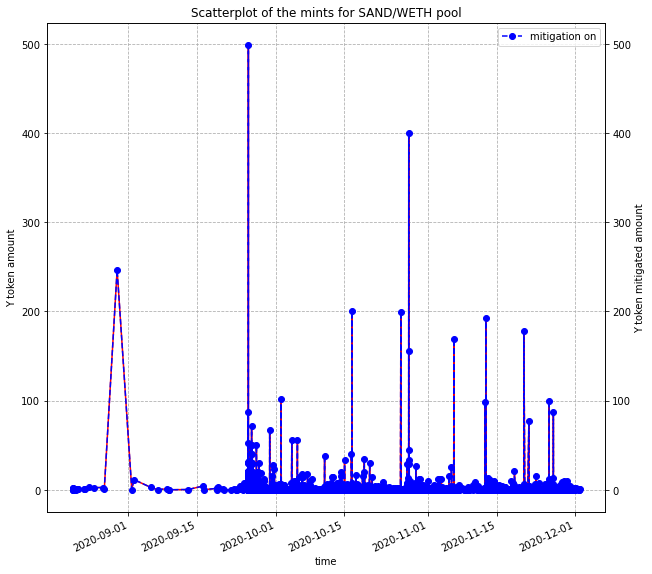

In [60]:
plot_mints(sand_weth_mints_mitigation_on_df, sand_weth_mints_mitigation_off_df, pool_name='SAND/WETH')

## MEV transactions extraction and analysis

### MEV attacks and possible MEVs extraction

There are 77 MEV attacks performed on the pool

In [8]:
sand_weth_filtered_swaps_df, sand_weth_mevs_df = sand_weth_sim.extract_filtered_and_mevs_dfs()

initial len = 129994, filtered len = 128700
txds = 1294
out values = 647


In [41]:
sand_weth_suspicious_filtered_swaps_df, sand_weth_possible_mevs_df = sand_weth_sim.extract_suspicious_and_filtered_swaps_dfs()

initial len = 129994, filtered len = 128588
txds = 1406
out values = 703.0


In [42]:
sand_weth_mevs_df = sand_weth_sim.calculate_attack_profit(sand_weth_mevs_df)

### Plotting values of MEVs and possible MEVs with filtered swaps values

In [43]:
sand_weth_mevs_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd,profit
0,SAND,WETH,118333.466152,17.386836,6323.179425,2020-09-15 11:10:11,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xd25174f42596bc4eaa83116a368dd237664c9392,0x7d6d48beb1f5e8959f064205e73e94958b269a9ef293...,276.208551
1,WETH,SAND,16.955749,118333.466152,6599.387976,2020-09-15 11:10:11,0x494cc492c9f01699bff1449180201dbfbd592ea5,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xe91d979c590e2f3e0eb14ebcc8e30830f43f92a82d34...,276.208551
2,SAND,WETH,43096.029735,5.855678,2104.246690,2020-09-16 12:10:50,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xd25174f42596bc4eaa83116a368dd237664c9392,0x88a6999cf2724b03bb42e988cf9f1d36b240a3b147d8...,21.124332
3,WETH,SAND,5.674984,43096.029735,2083.122357,2020-09-16 12:10:50,0x494cc492c9f01699bff1449180201dbfbd592ea5,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xabe68044cfe94cde0913c46e5491fc055eb15f54f60a...,21.124332
4,WETH,SAND,5.674984,43606.883080,2099.229261,2020-09-16 12:47:59,0x494cc492c9f01699bff1449180201dbfbd592ea5,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xd713c16a51c60934cc3644e8b6b616da03deba37b491...,83.078662
...,...,...,...,...,...,...,...,...,...,...
1345,SAND,WETH,19501.231147,11.768869,54815.026241,2021-11-13 01:54:36,0x000000005736775feb0c8568e7dee77222a26880,0x000000005736775feb0c8568e7dee77222a26880,0xd3989ac6e21e035a44fe85422f338db92c7558164a28...,349.995564
1346,SAND,WETH,20489.353461,12.845562,59679.586160,2021-11-13 02:30:19,0x000000005736775feb0c8568e7dee77222a26880,0x000000005736775feb0c8568e7dee77222a26880,0x21bbbde8371cb97208e74b9db7bfcb632010958593b2...,708.659757
1347,WETH,SAND,12.693029,20489.353461,58970.926403,2021-11-13 02:30:19,0x000000005736775feb0c8568e7dee77222a26880,0x000000005736775feb0c8568e7dee77222a26880,0x56fad757939d82a82c1976daf4f851bf309afc01e237...,708.659757
1348,SAND,WETH,105063.419069,70.109627,324602.318361,2021-11-13 08:46:25,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x3c1e03453ca898512b9752d11ed0969ee69e5b1c1e2c...,2097.672949


In [44]:
sand_weth_mevs_df[sand_weth_mevs_df['profit'] == sand_weth_mevs_df['profit'].max()]

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd,profit
1222,SAND,WETH,99051.668562,43.255129,185062.881379,2021-10-30 17:22:08,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x8959603cb46cc7ac66a742472a9bec4b81c787ac14b2...,17749.210488
1223,WETH,SAND,39.106569,99051.668562,167313.670891,2021-10-30 17:22:08,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0xea14ed87cbca679d598767743244299bd5e05cccaaf4...,17749.210488


In [45]:
sand_weth_possible_mevs_df

,token_in,token_out,amount_in,amount_out,amount_usd,timestamp,sender,to,txd
935,SAND,WETH,118333.466152,17.386836,6323.179425,2020-09-15 11:10:11,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xd25174f42596bc4eaa83116a368dd237664c9392,0x7d6d48beb1f5e8959f064205e73e94958b269a9ef293...
937,WETH,SAND,16.955749,118333.466152,6599.387976,2020-09-15 11:10:11,0x494cc492c9f01699bff1449180201dbfbd592ea5,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xe91d979c590e2f3e0eb14ebcc8e30830f43f92a82d34...
977,SAND,WETH,43526.185887,5.555634,1999.497878,2020-09-15 18:40:53,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xd25174f42596bc4eaa83116a368dd237664c9392,0xbe8846de9a4675486d9dea5da46f35b87c0b6b940525...
978,WETH,SAND,5.588306,43526.185887,2055.005978,2020-09-15 18:40:53,0x494cc492c9f01699bff1449180201dbfbd592ea5,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xc31cfff92e5bb388524b51d50ee193a33fdf3cf99bd2...
1078,SAND,WETH,43096.029735,5.855678,2104.246690,2020-09-16 12:10:50,0x494cc492c9f01699bff1449180201dbfbd592ea5,0xd25174f42596bc4eaa83116a368dd237664c9392,0x88a6999cf2724b03bb42e988cf9f1d36b240a3b147d8...
...,...,...,...,...,...,...,...,...,...
129358,WETH,SAND,12.693029,20489.353461,58970.926403,2021-11-13 02:30:19,0x000000005736775feb0c8568e7dee77222a26880,0x000000005736775feb0c8568e7dee77222a26880,0x56fad757939d82a82c1976daf4f851bf309afc01e237...
129536,SAND,WETH,105063.419069,70.109627,324602.318361,2021-11-13 08:46:25,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x3c1e03453ca898512b9752d11ed0969ee69e5b1c1e2c...
129538,WETH,SAND,69.656558,105063.419069,322504.645412,2021-11-13 08:46:25,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0x1d6e8bac6ea3730825bde4b005ed7b2b39a2932d,0xbeba6d9961c9d2ec4fe278ffee723aa32a12b4e0905b...
129619,WETH,SAND,36.362099,52814.358671,167388.932464,2021-11-13 10:48:14,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x00000000003b3cc22af3ae1eac0440bcee416b40,0x81885bdd6382d751c66e581273d4ae107b6d2fb80e0f...


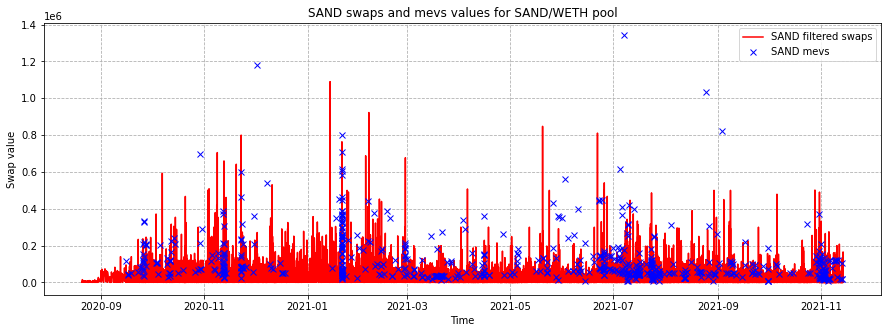

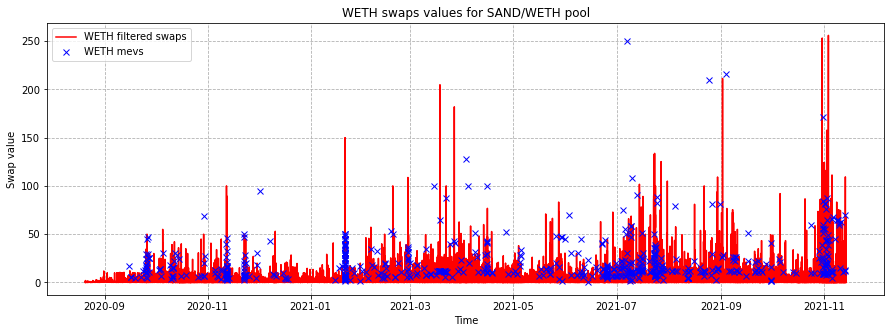

In [64]:
sand_weth_sim.show_swaps_and_mevs_by_token(sand_weth_filtered_swaps_df, sand_weth_mevs_df, width=15, height=5)

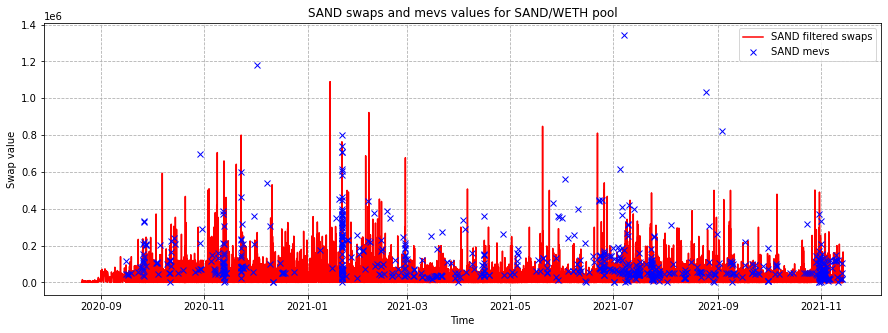

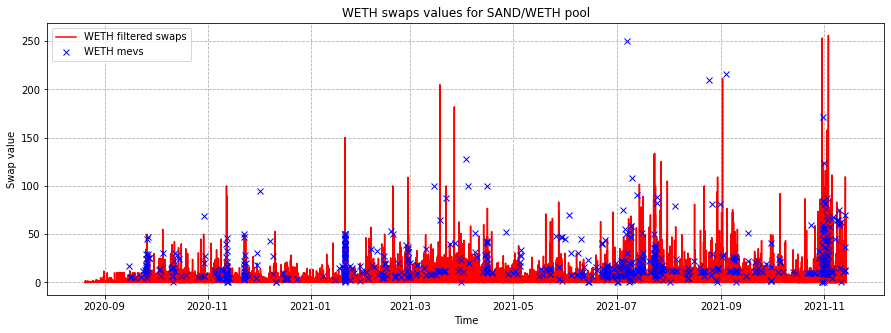

In [65]:
sand_weth_sim.show_swaps_and_mevs_by_token(sand_weth_suspicious_filtered_swaps_df, sand_weth_possible_mevs_df, width=15, height=5)

### Plotting MEV transactions and possible MEV transactions with filtered swaps daily count distributions

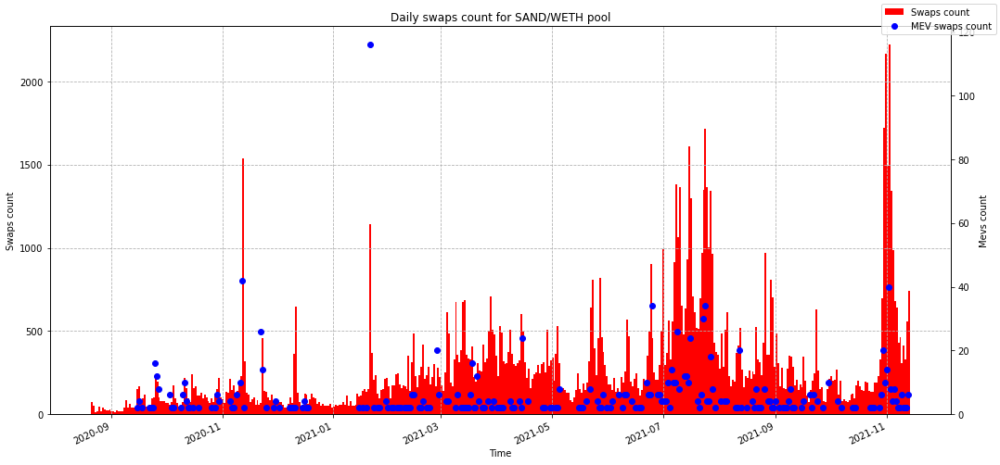

In [66]:
sand_weth_sim.show_swaps_and_mevs_daily_count_by_token(sand_weth_filtered_swaps_df, sand_weth_mevs_df, mevs_alter_axis=True)

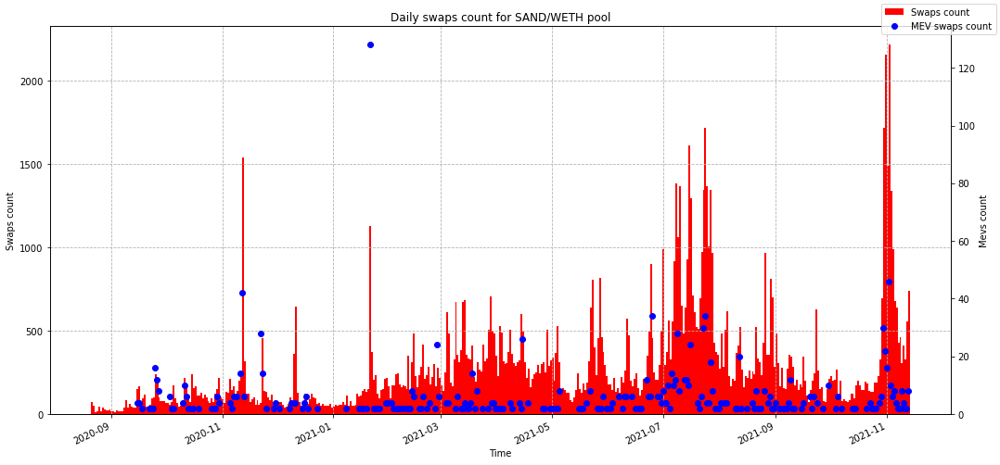

In [67]:
sand_weth_sim.show_swaps_and_mevs_daily_count_by_token(sand_weth_suspicious_filtered_swaps_df, sand_weth_possible_mevs_df, mevs_alter_axis=True)

### Plotting ratio of MEV attacks to filtered swaps

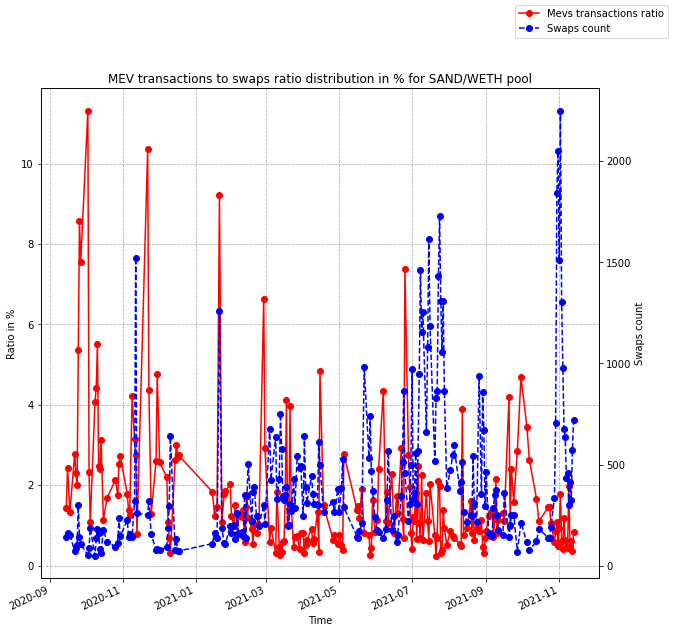

In [68]:
sand_weth_sim.show_mevs_to_swaps_ratio(sand_weth_filtered_swaps_df, sand_weth_mevs_df)

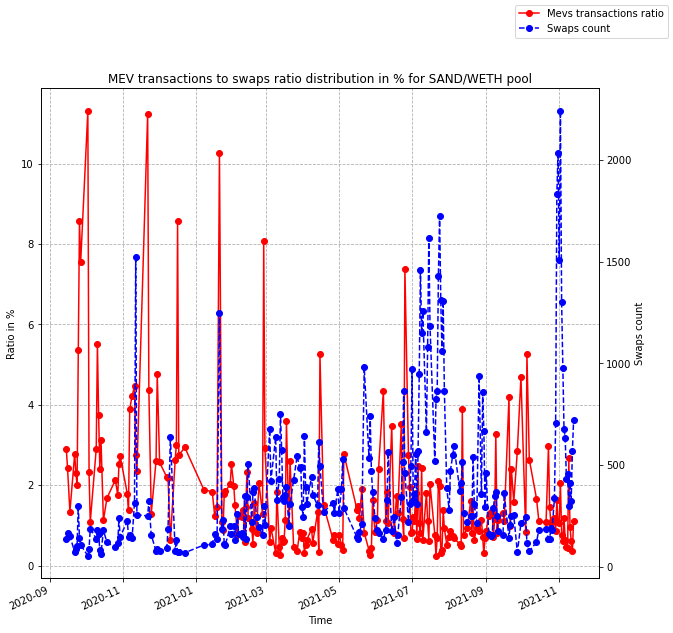

In [69]:
sand_weth_sim.show_mevs_to_swaps_ratio(sand_weth_suspicious_filtered_swaps_df, sand_weth_possible_mevs_df)

### Plotting ratio of MEVs and suspicious transactions to filtered swaps

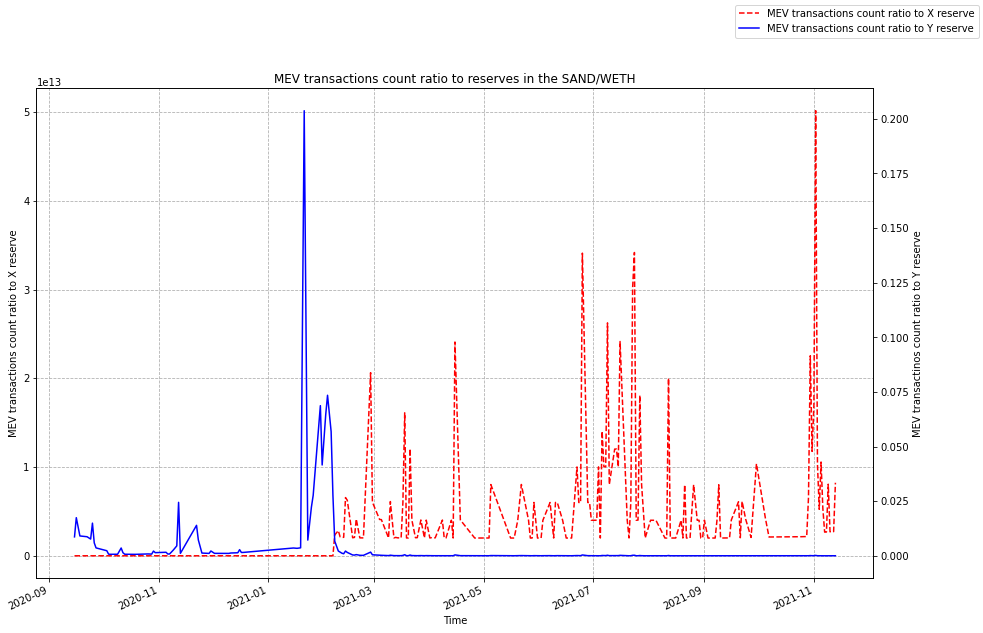

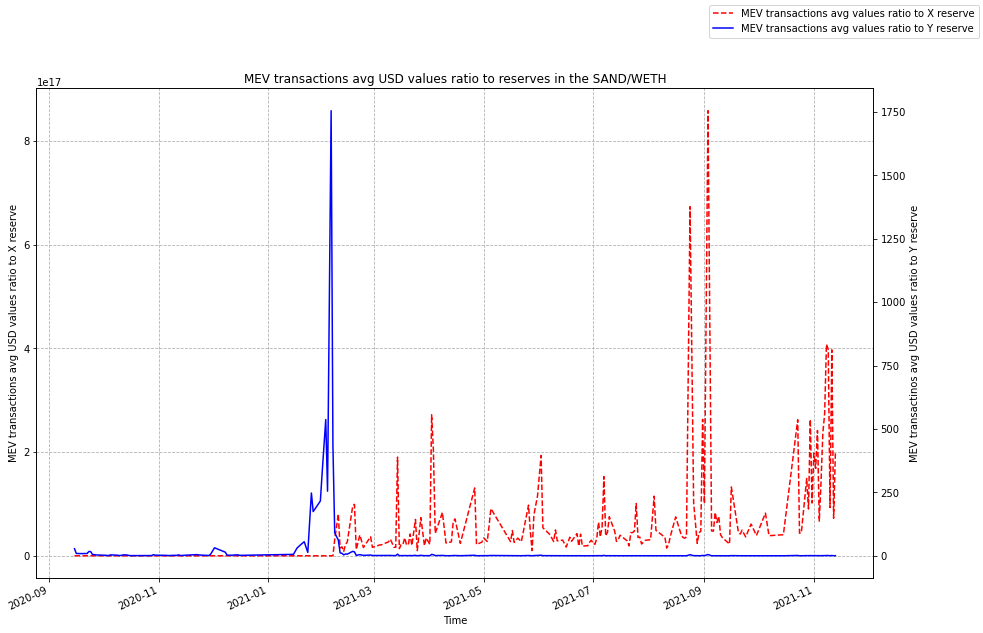

In [70]:
sand_weth_sim.show_mevs_to_reserves_ratio(sand_weth_swaps_mitigation_off_df, sand_weth_mevs_df, width=15, height=10)
sand_weth_sim.show_mevs_values_to_reserves_ratio(sand_weth_swaps_mitigation_off_df, sand_weth_mevs_df, width=15, height=10)

### Plotting transaction values distribution of passed swaps, blocked swaps and not enough reserves swaps

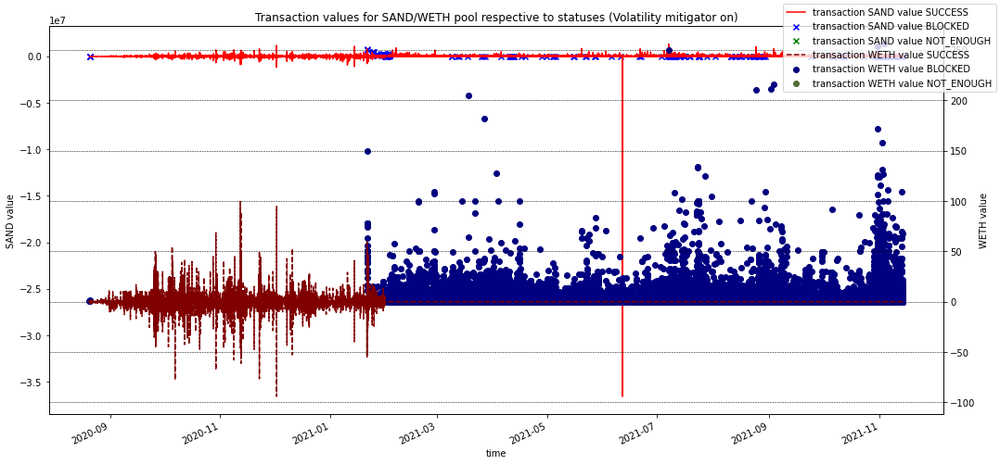

In [71]:
sand_weth_sim.plot_transactions_by_type(sand_weth_swaps_mitigation_on_df, ignore_success=False, width=15, height=7)

### Plotting mitigation comparison, slice factor distribution, reserves distributions, cumulative prices distributions, transaction frequency distributions, price impact after each transaction distributions

Original SAND/WETH pool has next statuses counts:
SUCCESS                80382
NOT_ENOUGH_RESERVES    49611
Name: status, dtype: int64
Mitigated SAND/WETH dataframe has next statuses counts:
SUCCESS                             69453
BLOCKED_BY_VOLATILITY_MITIGATION    60540
Name: status, dtype: int64
TWAP unavailability ratio for SAND/WETH is 7.692721915795466e-06
Mitigated SAND/WETH dataframe has next Mitigator statuses:
CHECKED                129992
CANT_CONSULT_ORACLE         1
Name: mitigator_check_status, dtype: int64


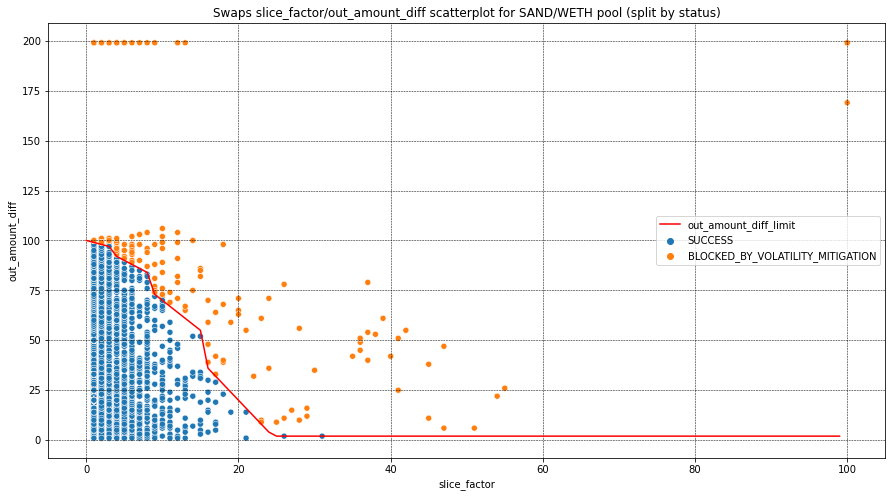

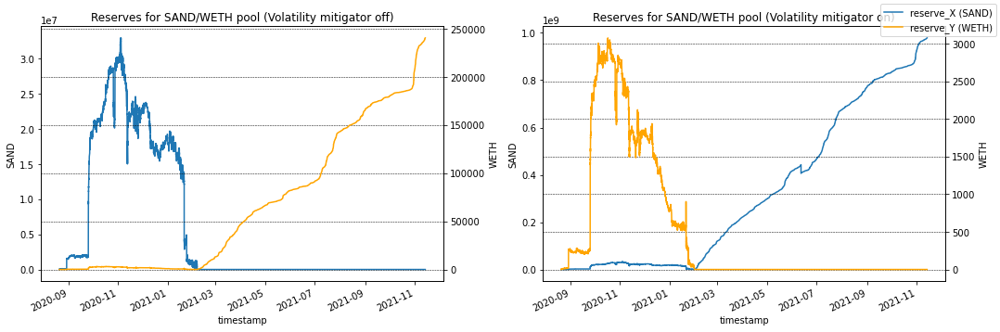

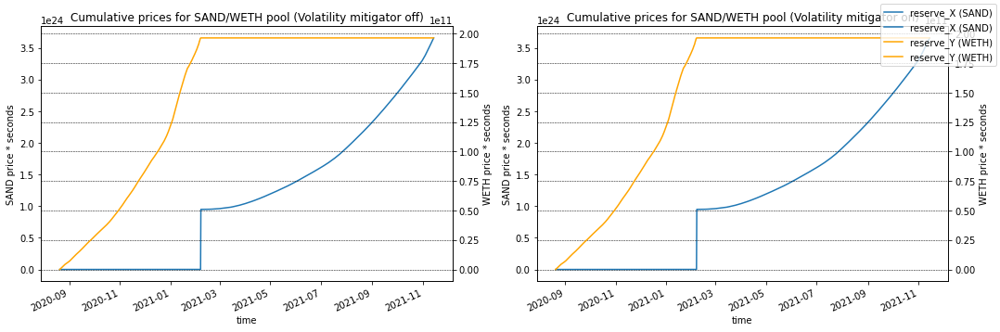

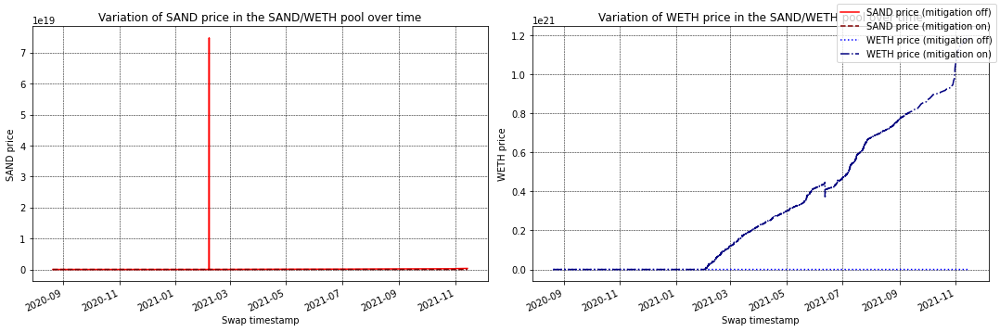

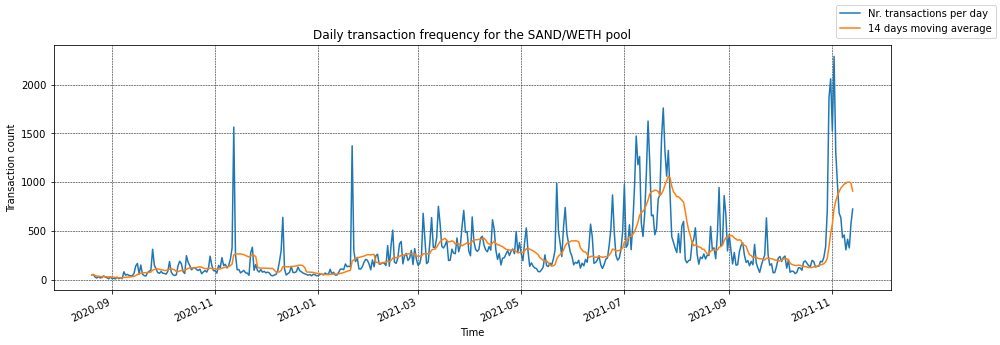

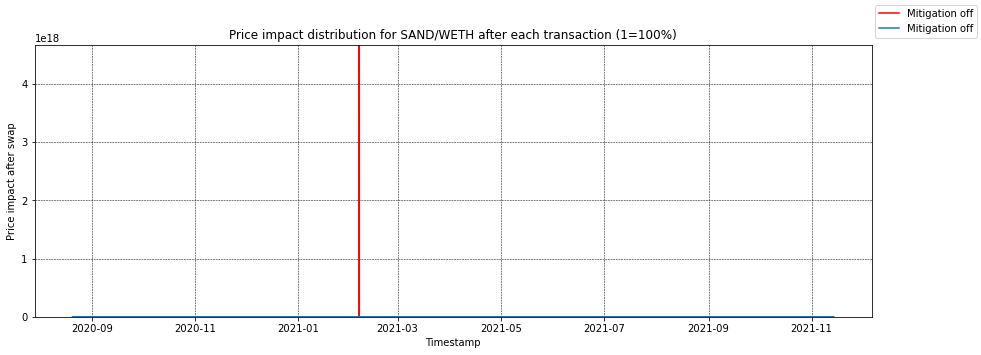

In [72]:
sand_weth_sim.show_mitigation_comparison(sand_weth_swaps_mitigation_off_df, sand_weth_swaps_mitigation_on_df)
sand_weth_sim.px_hist_blocked_transactions_slice(sand_weth_swaps_mitigation_on_df)
sand_weth_sim.px_hist_blocked_transactions_difference_from_oracle(sand_weth_swaps_mitigation_on_df)
sand_weth_sim.plot_slice_distribution_and_diff_limit_line(sand_weth_swaps_mitigation_on_df)
sand_weth_sim.plot_reserves_with_and_without_mitigation(sand_weth_swaps_mitigation_off_df, sand_weth_swaps_mitigation_on_df)
sand_weth_sim.plot_cumulative_prices_with_and_without_mitigation(sand_weth_swaps_mitigation_off_df, sand_weth_swaps_mitigation_off_df, make_big_num_convert=True)
sand_weth_sim.plot_price_distribution(sand_weth_swaps_mitigation_off_df, sand_weth_swaps_mitigation_on_df, separate_plots=True)
sand_weth_sim.plot_frequency_distribution(sand_weth_swaps_mitigation_on_df)
sand_weth_sim.plot_price_impact(sand_weth_swaps_mitigation_off_df, sand_weth_swaps_mitigation_on_df, 
                                smallest_y=sand_weth_swaps_mitigation_off_df['price_diff'].min(), 
                                biggest_y=sand_weth_swaps_mitigation_off_df['price_diff'].max())

In [73]:
sand_weth_blocked_df = sand_weth_swaps_mitigation_on_df[sand_weth_swaps_mitigation_on_df['status'] == 'BLOCKED_BY_VOLATILITY_MITIGATION']
sand_weth_blocked_mevs_df = pd.merge(sand_weth_blocked_df, sand_weth_mevs_df, on='txd')
sand_weth_blocked_mevs_df

,id,token_in_x,token_out_x,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender_x,to_x,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff,token_in_y,token_out_y,amount_in,amount_out,amount_usd,timestamp,sender_y,to_y,profit
0,19633,SAND,WETH,705933.394259,0.0,6.337598e+01,NaN,CHECKED,2.806344e+01,77.0,9.0,27.0,BLOCKED_BY_VOLATILITY_MITIGATION,885269.0,2021-01-21 08:03:34,2021-01-21 08:03:29,0xe5b1e5c8e45a24266f3c247d1ba951b349531c6e4ea7...,0x000000000000084e91743124a982076c59f10084,0x000000000000084e91743124a982076c59f10084,19633,8.529369e+06,8.368445e+02,7.137756e+09,1253,170420037422,True,8.529369e+06,8.368445e+02,7.137756e+09,1253,170420037422,True,9.811330e-05,0.0,SAND,WETH,705933.394259,52.998081,69347.982131,2021-01-21 08:03:29,0x000000000000084e91743124a982076c59f10084,0x000000000000084e91743124a982076c59f10084,3922.988597
1,19643,WETH,SAND,43.959118,0.0,4.193992e+05,NaN,CHECKED,1.108210e+06,90.0,6.0,12.0,BLOCKED_BY_VOLATILITY_MITIGATION,885278.0,2021-01-21 08:05:49,2021-01-21 08:05:39,0xc3dcbbd693084fb1ffa521d2892f3d3bb969d13fa47b...,0x686d210f9cbbfa532eb2af4798b043a35af07de3,0x686d210f9cbbfa532eb2af4798b043a35af07de3,19643,8.507621e+06,8.392853e+02,7.140321e+09,1253,170421462537,True,8.507621e+06,8.392853e+02,7.140321e+09,1253,170421462537,True,9.865099e-05,0.0,WETH,SAND,43.959118,581581.567597,57534.916984,2021-01-21 08:05:39,0x686d210f9cbbfa532eb2af4798b043a35af07de3,0x686d210f9cbbfa532eb2af4798b043a35af07de3,244.882127
2,19696,WETH,SAND,44.778647,0.0,4.101733e+05,NaN,CHECKED,1.127508e+06,93.0,6.0,12.0,BLOCKED_BY_VOLATILITY_MITIGATION,885289.0,2021-01-21 08:08:34,2021-01-21 08:08:25,0xefe9ad9aa3f14d88ac7c7ba1f2e95c6c5718d37f39bb...,0x00000000cd47aa64daf64f5144b0d7885754374c,0x00000000cd47aa64daf64f5144b0d7885754374c,19696,8.355337e+06,8.587004e+02,7.174731e+09,1253,170423110536,True,8.355337e+06,8.587004e+02,7.174731e+09,1253,170423110536,True,1.027727e-04,0.0,WETH,SAND,44.778647,465202.830048,58467.305383,2021-01-21 08:08:25,0x00000000cd47aa64daf64f5144b0d7885754374c,0x00000000cd47aa64daf64f5144b0d7885754374c,1569.735519
3,19718,WETH,SAND,50.000000,0.0,4.765473e+05,NaN,CHECKED,1.258428e+06,90.0,6.0,12.0,BLOCKED_BY_VOLATILITY_MITIGATION,885293.0,2021-01-21 08:09:34,2021-01-21 08:09:22,0xaec1f20c4dad438d2bc6d8456d3a113731b0e5ed6c53...,0x000000000000084e91743124a982076c59f10084,0x000000000000084e91743124a982076c59f10084,19718,8.561404e+06,8.397916e+02,7.189795e+09,1253,170423709285,True,8.561404e+06,8.397916e+02,7.189795e+09,1253,170423709285,True,9.809041e-05,0.0,WETH,SAND,50.000000,447444.740604,65200.510680,2021-01-21 08:09:22,0x000000000000084e91743124a982076c59f10084,0x000000000000084e91743124a982076c59f10084,27499.192497
4,19768,WETH,SAND,30.000000,0.0,2.704284e+05,NaN,CHECKED,7.537411e+05,94.0,4.0,8.0,BLOCKED_BY_VOLATILITY_MITIGATION,885309.0,2021-01-21 08:13:34,2021-01-21 08:13:22,0x118a3d983f3983b77d18f96a48fcd7821c14c8d518d5...,0x000000000000084e91743124a982076c59f10084,0x000000000000084e91743124a982076c59f10084,19768,7.689992e+06,8.148589e+02,6.266258e+09,1253,170426115483,True,7.689992e+06,8.148589e+02,6.266258e+09,1253,170426115483,True,1.059636e-04,0.0,WETH,SAND,30.000000,208285.332985,39010.549150,2021-01-21 08:13:22,0x000000000000084e91743124a982076c59f10084,0x000000000000084e91743124a982076c59f10084,872.465065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
469,132429,WETH,SAND,63.119173,0.0,9.721729e+08,NaN,CHECKED,7.379593e+22,199.0,100.0,98.0,BLOCKED_BY_VOLATILITY_MITIGATION,2577620.0,2021-11-11 03:31:19,2021-1

# ALICE/WETH (NFT)

In [74]:
alice_weth_mints_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,0,6.000000,0.101598,1615805569,SUCCESS,0,1615805569,1615805569,0,0.000000,0.000000,0.000000e+00,0,0,False,6.000000,0.101598,6.095886e-01,0,0,False
1,1,46.261184,0.783341,1615883849,SUCCESS,5219,1615883854,1615883849,1,6.000000,0.101598,6.095886e-01,0,0,False,52.261184,0.884940,4.624799e+01,0,0,False
2,17,16737.068671,96.832368,1616689181,SUCCESS,58908,1616689189,1616689181,17,90.135115,0.520868,4.694853e+01,7117,87847835,False,16827.203786,97.353236,1.638183e+06,7117,87847835,False
3,25,993.683353,7.264836,1616700870,SUCCESS,59687,1616700874,1616700870,25,14987.640663,109.417683,1.639913e+06,7335,93897434,False,15981.324016,116.682519,1.864741e+06,7335,93897434,False
4,43,2851.000000,20.025448,1616727125,SUCCESS,61438,1616727139,1616727125,43,16275.247221,114.772372,1.867949e+06,7496,97104383,False,19126.247221,134.797820,2.578176e+06,7496,97104383,False
5,44,7118.442317,50.000000,1616727287,SUCCESS,61448,1616727289,1616727287,44,19126.247221,134.797820,2.578176e+06,7496,97104383,False,26244.689538,184.797820,4.849961e+06,7496,97104383,False
6,45,4271.065390,30.000000,1616727410,SUCCESS,61457,1616727424,1616727410,45,26244.689538,184.797820,4.849961e+06,7496,97104383,False,30515.754928,214.797820,6.554718e+06,7496,97104383,False
7,70,100.000000,0.786183,1616761872,SUCCESS,63754,1616761879,1616761872,70,28870.003170,227.202488,6.559337e+06,7745,101789849,False,28970.003170,227.988671,6.604833e+06,7745,101789849,False
8,85,1075.901600,8.270369,1616772213,SUCCESS,64443,1616772214,1616772213,85,29315.139731,225.462610,6.609468e+06,7857,103692315,False,30391.041331,233.732979,7.103389e+06,7857,103692315,False
9,89,301.370000,2.437962,1616791298,SUCCESS,65716,1616791309,1616791298,89,29632.079857,239.756104,7.104472e+06,7985,105743471,False,29933.449857,242.194066,7.249704e+06,7985,105743471,False


In [75]:
alice_weth_burns_mitigation_off_df

,id,X_amount,Y_amount,timestamp,status,block_number,block_timestamp,transaction_timestamp,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on
0,97,970.524283,7.451131,1616820260,SUCCESS,67647,1616820274,1616820260,97,31159.026016,239.285000,7.455888e+06,8214,109426956,False,30188.501733,231.833869,6.998717e+06,8214,109426956,False
1,205,44.370849,0.425158,1616952613,SUCCESS,76470,1616952619,1616952613,205,27438.404735,262.162530,7.193322e+06,9342,125308940,False,27394.033886,261.737373,7.170042e+06,9342,125308940,False
2,232,20.643398,0.192727,1616996962,SUCCESS,79427,1616996974,1616996962,232,28111.119545,261.699876,7.356676e+06,9741,129771088,False,28090.476147,261.507148,7.345860e+06,9741,129771088,False
3,238,155.562830,1.505671,1617007337,SUCCESS,80118,1617007339,1617007337,238,27587.585930,266.372967,7.348587e+06,9875,131310894,False,27432.023100,264.867296,7.265846e+06,9875,131310894,False
4,346,57.815938,0.433081,1617369800,SUCCESS,104283,1617369814,1617369800,346,32864.066561,245.803364,8.078098e+06,12845,175416848,False,32806.250623,245.370283,8.049679e+06,12845,175416848,False
5,383,119.999999,0.832313,1617462389,SUCCESS,110455,1617462394,1617462389,383,39932.883920,278.089087,1.110490e+07,13519,188490067,False,39812.883921,277.256774,1.103839e+07,13519,188490067,False
6,537,6197.517242,37.706955,1618052663,SUCCESS,149807,1618052674,1618052663,537,42684.669764,262.997010,1.122594e+07,17419,277060620,False,36487.152522,225.290055,8.220193e+06,17419,277060620,False
7,546,16679.110145,98.610485,1618109464,SUCCESS,153593,1618109464,1618109464,546,37070.508788,221.964558,8.228339e+06,17691,284526380,False,20391.398643,123.354073,2.515362e+06,17691,284526380,False
8,596,1194.704911,7.557609,1618241010,SUCCESS,162363,1618241014,1618241010,596,19864.459949,127.121484,2.525200e+06,18500,305914993,False,18669.755038,119.563875,2.232228e+06,18500,305914993,False
9,630,192.252928,0.954394,1618547286,SUCCESS,182782,1618547299,1618547286,630,21274.369688,106.644041,2.268785e+06,20262,360756127,False,21082.116760,105.689647,2.228161e+06,20262,360756127,False


In [76]:
alice_weth_swaps_mitigation_off_df

,id,token_in,token_out,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender,to,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff
0,2,ALICE,WETH,12.839028,0.0,0.173123,0.000692,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,5219.0,2021-03-16 08:37:34,2021-03-16 08:37:32,0x2cdf6512b85e1c20f548ba8c318846a1dd8dd2917ebd...,0x0000000000c9b1dde987a6abe20a2af8d9e636d9,0x0000000000c9b1dde987a6abe20a2af8d9e636d9,2,52.261184,0.884940,4.624799e+01,0,0,False,65.100212,0.711124,4.629430e+01,0,0,False,0.010924,-0.354898
1,3,ALICE,WETH,2.000000,0.0,0.020990,0.000084,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,6048.0,2021-03-16 12:04:49,2021-03-16 12:04:44,0x73191438977d7ff2d8acb9df6bc49cac321949ab4c6e...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,3,65.100212,0.711124,4.629430e+01,0,0,False,67.100212,0.690049,4.630246e+01,135,1138369,False,0.010284,-0.058558
2,4,ALICE,WETH,14.224945,0.0,0.119702,0.000479,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,10740.0,2021-03-17 07:37:49,2021-03-17 07:37:35,0x272eaf073e8ea7d7b2cc263db9b05ae91684866d64fa...,0xdef1c0ded9bec7f1a1670819833240f027b25eff,0xf5ef67632cd2256d939702a126fe2c047d0a07bf,4,67.100212,0.690049,4.630246e+01,135,1138369,False,81.325157,0.569869,4.634466e+01,859,7982100,False,0.007007,-0.318613
3,5,WETH,ALICE,0.187000,0.0,19.941395,0.000748,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,11694.0,2021-03-17 11:36:19,2021-03-17 11:36:13,0x8301c0fd62a4f98a3306837835556300874eefc6e7ce...,0x11111112542d85b3ef69ae05771c2dccff4faa26,0xe8c423de4fa5e56537517944a77ff94cee6fb8e2,5,81.325157,0.569869,4.634466e+01,859,7982100,False,61.383762,0.756121,4.641353e+01,959,10024260,False,0.012318,0.757874
4,6,ALICE,WETH,10.000000,0.0,0.105011,0.000420,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,11897.0,2021-03-17 12:27:04,2021-03-17 12:26:52,0x3eac79213f0d93f912851dfa46fafc82469eda6ac4b1...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,6,61.383762,0.756121,4.641353e+01,959,10024260,False,71.383762,0.650689,4.644866e+01,997,10271460,False,0.009115,-0.259992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8425,8501,ALICE,WETH,38.000000,0.0,0.238383,0.000954,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1467756.0,2021-11-25 06:31:49,2021-11-25 06:31:38,0x96e76e56d4c52c1e9507a78205c870c73ede13cffa18...,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,0x7a250d5630b4cf539739df2c5dacb4c659f2488d,8501,21435.250631,136.064788,2.916583e+06,89622,6229554974,False,21473.250631,135.825451,2.916614e+06,89626,6229644770,False,0.006325,-0.003526
8426,8502,WETH,ALICE,1.750000,0.0,270.448973,0.007000,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1467815.0,2021-11-25 06:46:34,2021-11-25 06:46:23,0x520703fd9962956401290da1be9f02836d0f1d059960...,0x642bffb61457fefa2fdd57c13aa24a2eaf0e5eea,0xdd75cd55c1367b3d2d928c6181eea46999d24a72,8502,21473.250631,135.825451,2.916614e+06,89626,6229644770,False,21202.801658,137.568451,2.916837e+06,89631,6229784684,False,0.006488,0.025752
8427,8503,WETH,ALICE,0.294813,0.0,44.888552,0.001179,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1467938.0,2021-11-25 07:17:19,2021-11-25 07:17:09,0xbe0ec899a9286f086e146d2eecb6a6122d105a059ee9...,0xe66b31678d6c16e9ebf358268a790b763c133750,0x0225ca88e84784211297e6bfaecdf737842dec2e,8503,21202.801658,137.568451,2.916837e+06,89631,6229784684,False,21157.913106,137.862085,2.916874e+06,89643,6230069046,False,0.006516,0.004261
8428,8504,WETH,ALICE,0.024781,0.0,3.764516,0.000099,MITIGATOR_OFF,NaN,NaN,NaN,NaN,SUCCESS,1467970.0,2021-11-25 07:25:19,2021-11-25 07:25:05,0xa074507c9ec72aa1d0f716b6482d76e4

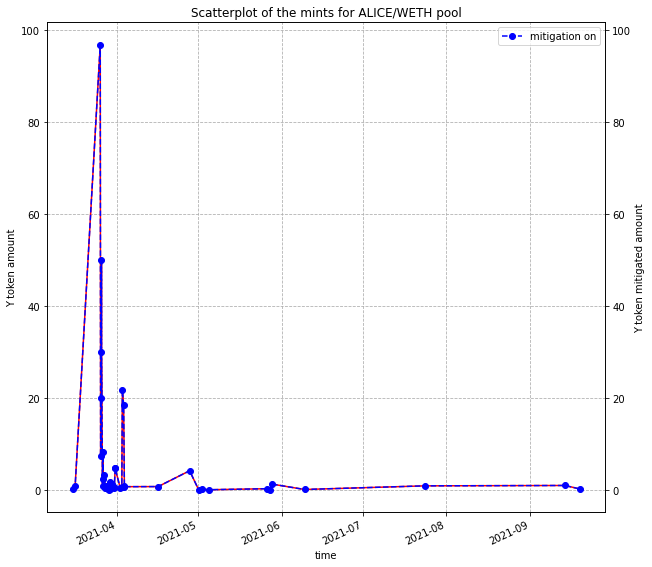

In [77]:
plot_mints(alice_weth_mints_mitigation_on_df, alice_weth_mints_mitigation_off_df, pool_name='ALICE/WETH')

## MEV transactions extraction and analysis

### MEV attacks and possible MEVs extraction

There are 77 MEV attacks performed on the pool

In [9]:
alice_weth_filtered_swaps_df, alice_weth_mevs_df = alice_weth_sim.extract_filtered_and_mevs_dfs()

initial len = 8431, filtered len = 8099
txds = 332
out values = 166


In [79]:
alice_weth_suspicious_filtered_swaps_df, alice_weth_possible_mevs_df = alice_weth_sim.extract_suspicious_and_filtered_swaps_dfs()

initial len = 8431, filtered len = 7881
txds = 550
out values = 275.0


In [80]:
alice_weth_mevs_df = alice_weth_sim.calculate_attack_profit(alice_weth_mevs_df)

### Plotting values of MEVs and possible MEVs with filtered swaps values

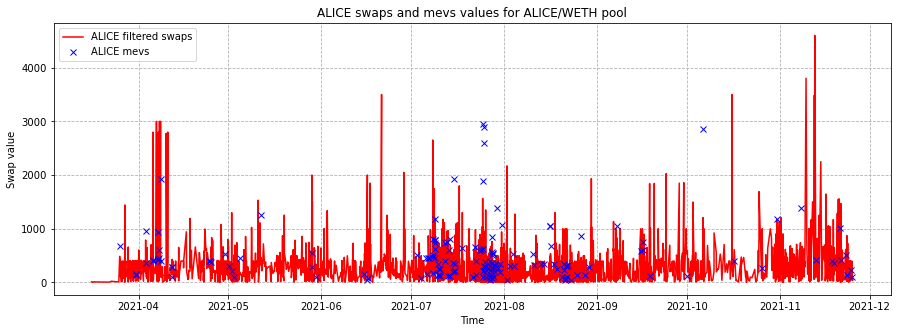

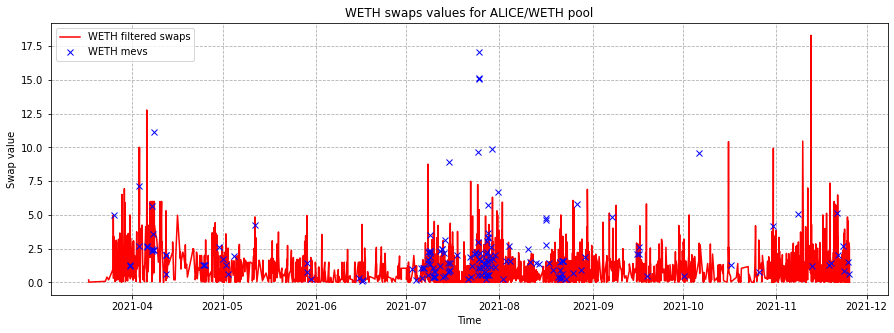

In [81]:
alice_weth_sim.show_swaps_and_mevs_by_token(alice_weth_filtered_swaps_df, alice_weth_mevs_df, width=15, height=5)

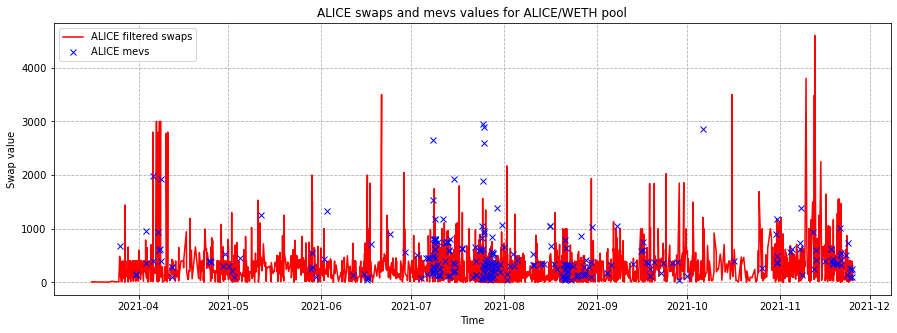

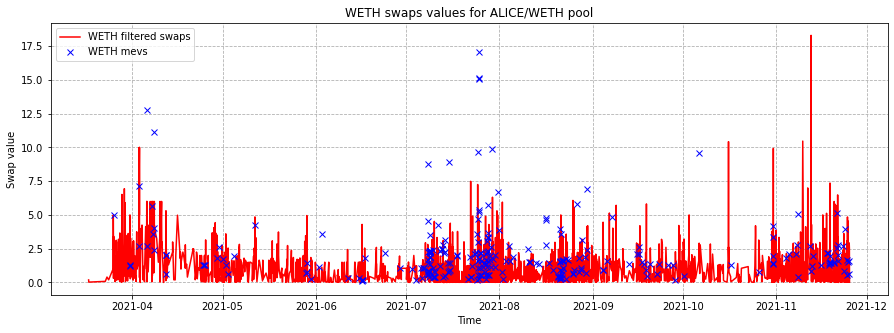

In [82]:
alice_weth_sim.show_swaps_and_mevs_by_token(alice_weth_suspicious_filtered_swaps_df, alice_weth_possible_mevs_df, width=15, height=5)

### Plotting MEV transactions and possible MEV transactions with filtered swaps daily count distributions

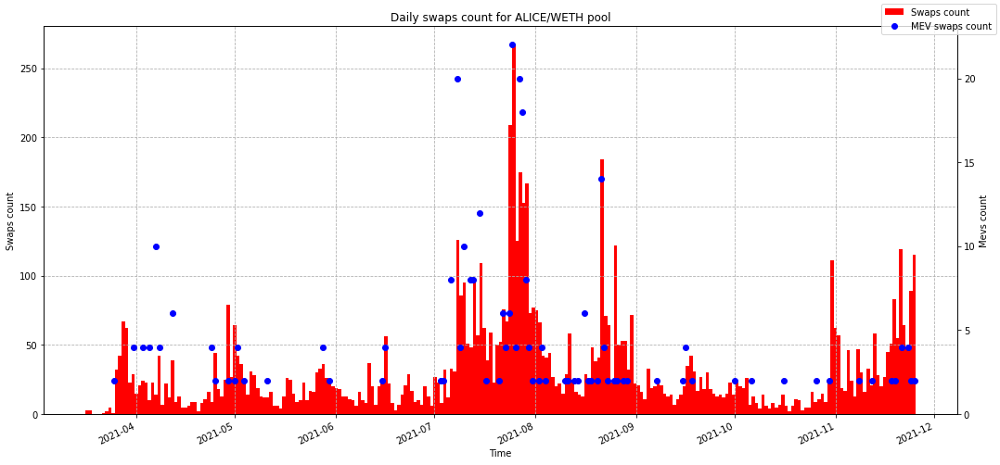

In [83]:
alice_weth_sim.show_swaps_and_mevs_daily_count_by_token(alice_weth_filtered_swaps_df, alice_weth_mevs_df, mevs_alter_axis=True)

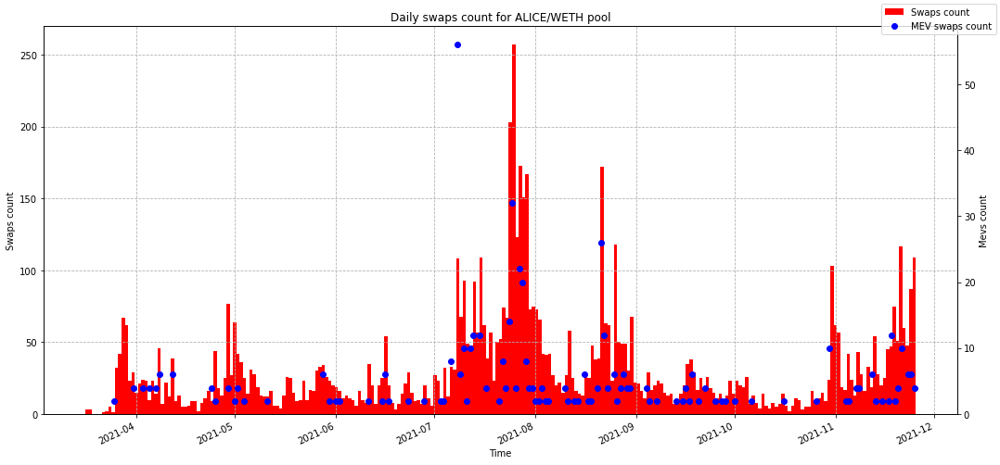

In [84]:
alice_weth_sim.show_swaps_and_mevs_daily_count_by_token(alice_weth_suspicious_filtered_swaps_df, alice_weth_possible_mevs_df, mevs_alter_axis=True)

### Plotting ratio of MEV attacks to filtered swaps

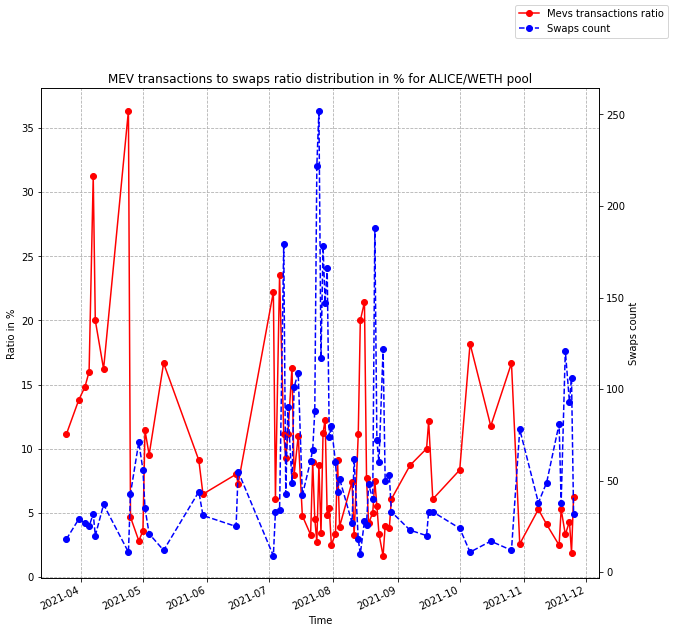

In [85]:
alice_weth_sim.show_mevs_to_swaps_ratio(alice_weth_filtered_swaps_df, alice_weth_mevs_df)

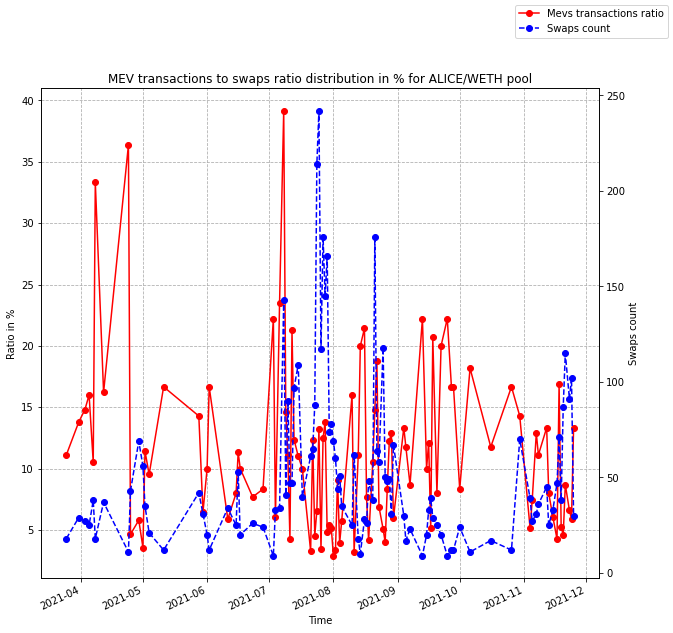

In [86]:
alice_weth_sim.show_mevs_to_swaps_ratio(alice_weth_suspicious_filtered_swaps_df, alice_weth_possible_mevs_df)

### Plotting ratio of MEVs and suspicious transactions to filtered swaps

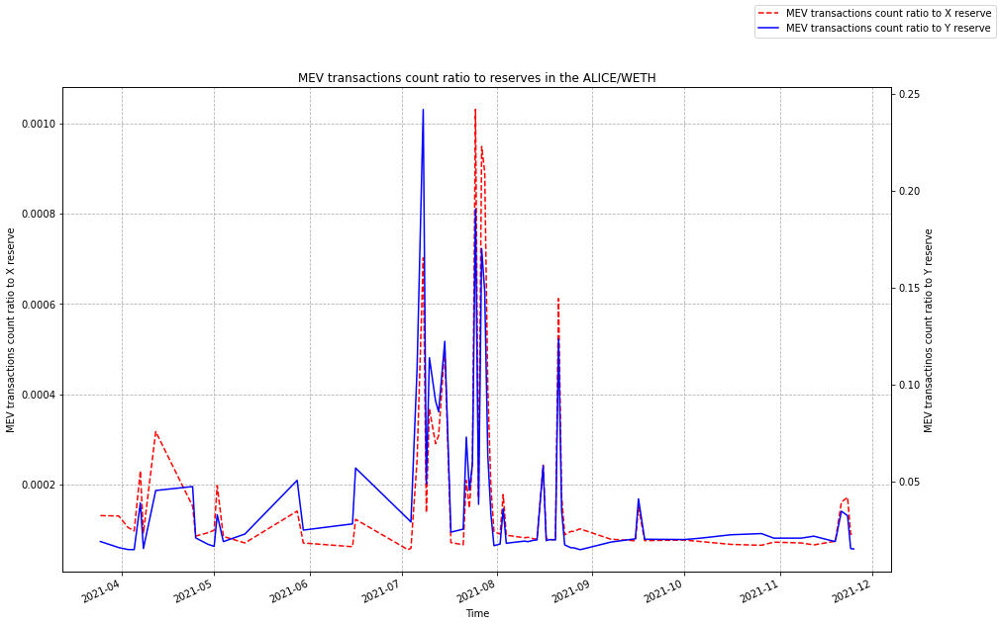

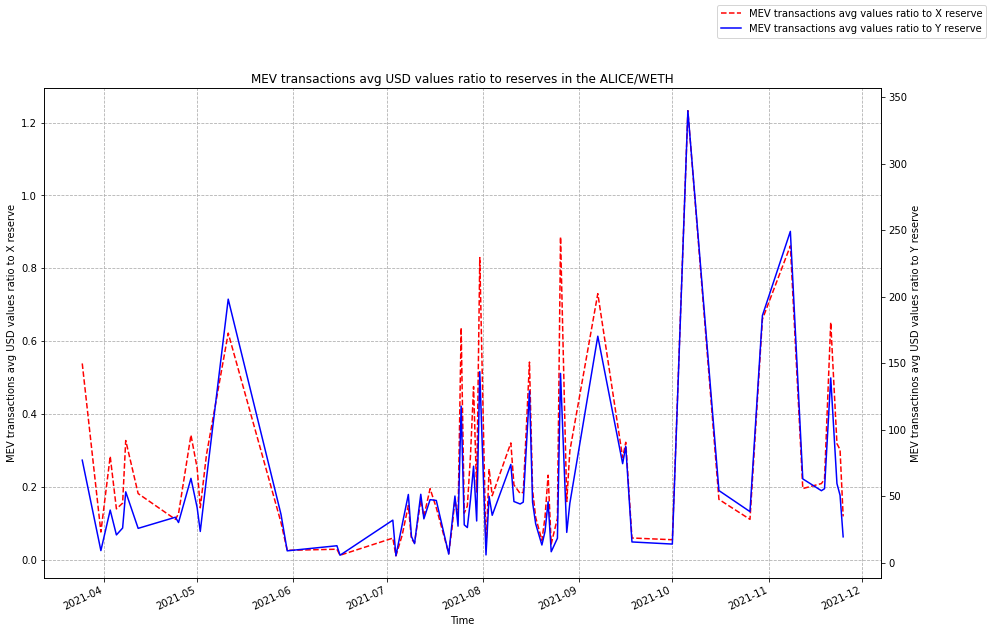

In [87]:
alice_weth_sim.show_mevs_to_reserves_ratio(alice_weth_swaps_mitigation_off_df, alice_weth_mevs_df, width=15, height=10)
alice_weth_sim.show_mevs_values_to_reserves_ratio(alice_weth_swaps_mitigation_off_df, alice_weth_mevs_df, width=15, height=10)

### Plotting transaction values distribution of passed swaps, blocked swaps and not enough reserves swaps

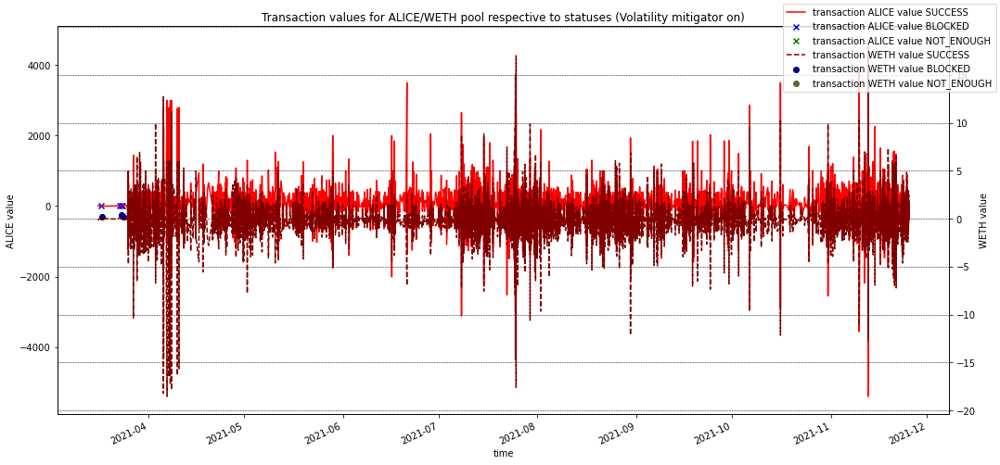

In [88]:
alice_weth_sim.plot_transactions_by_type(alice_weth_swaps_mitigation_on_df, ignore_success=False, width=15, height=7)

### Plotting mitigation comparison, slice factor distribution, reserves distributions, cumulative prices distributions, transaction frequency distributions, price impact after each transaction distributions

Original ALICE/WETH pool has next statuses counts:
SUCCESS    8430
Name: status, dtype: int64
Mitigated ALICE/WETH dataframe has next statuses counts:
SUCCESS                             8423
BLOCKED_BY_VOLATILITY_MITIGATION       7
Name: status, dtype: int64
TWAP unavailability ratio for ALICE/WETH is 0.00023724792408066428
Mitigated ALICE/WETH dataframe has next Mitigator statuses:
CHECKED                8428
CANT_CONSULT_ORACLE       2
Name: mitigator_check_status, dtype: int64


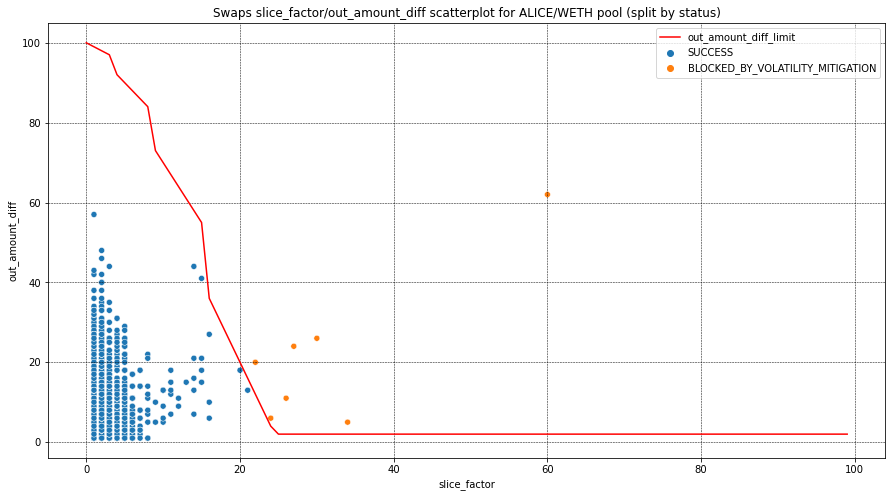

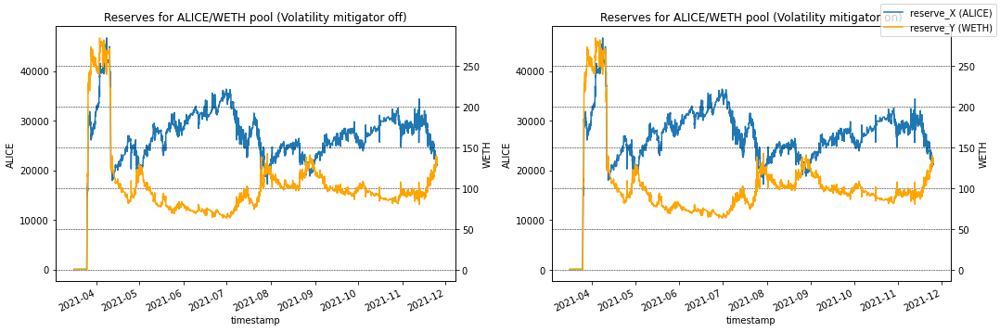

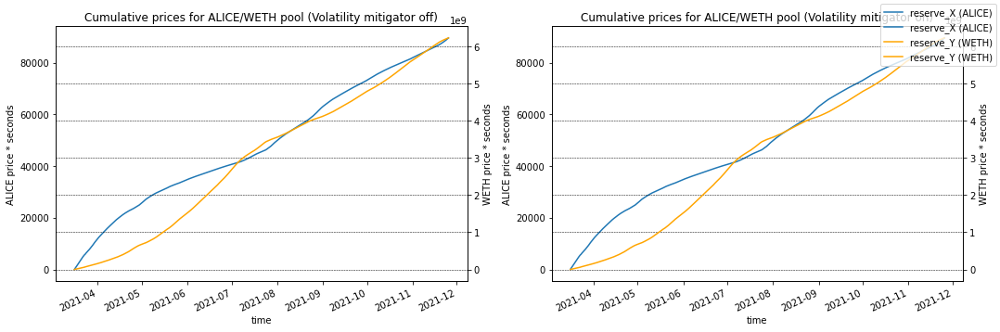

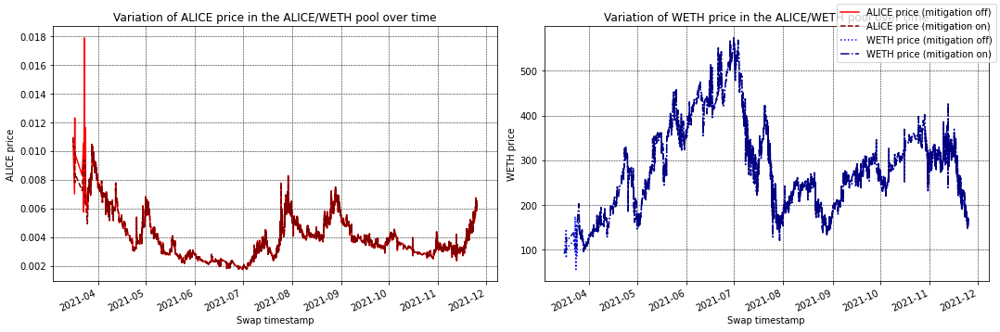

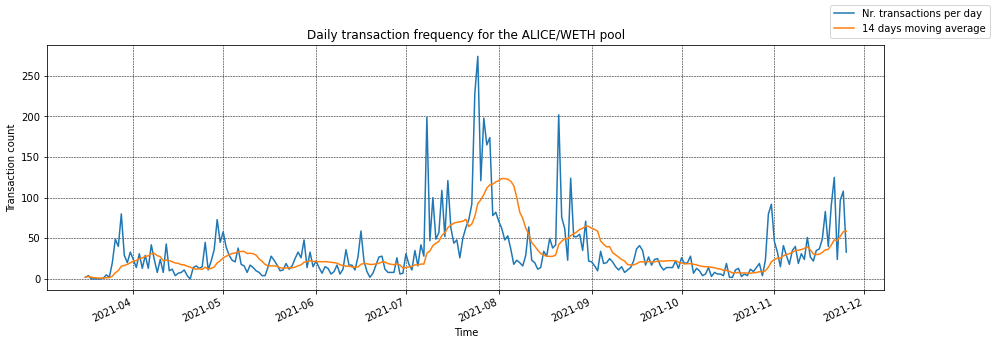

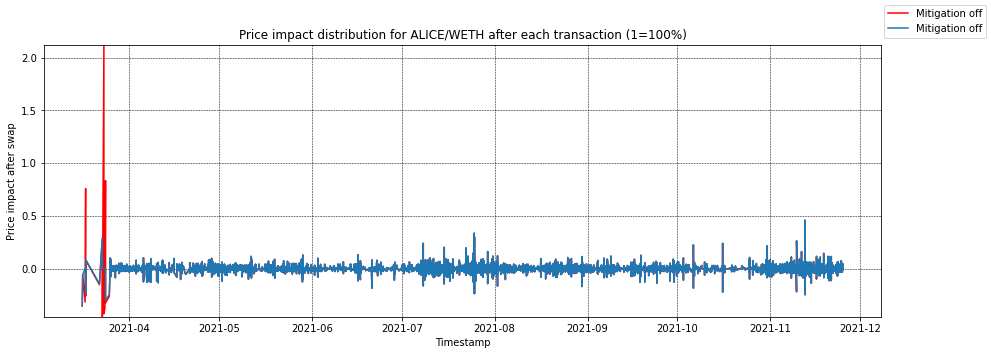

In [89]:
alice_weth_sim.show_mitigation_comparison(alice_weth_swaps_mitigation_off_df, alice_weth_swaps_mitigation_on_df)
alice_weth_sim.px_hist_blocked_transactions_slice(alice_weth_swaps_mitigation_on_df)
alice_weth_sim.px_hist_blocked_transactions_difference_from_oracle(alice_weth_swaps_mitigation_on_df)
alice_weth_sim.plot_slice_distribution_and_diff_limit_line(alice_weth_swaps_mitigation_on_df)
alice_weth_sim.plot_reserves_with_and_without_mitigation(alice_weth_swaps_mitigation_off_df, alice_weth_swaps_mitigation_on_df)
alice_weth_sim.plot_cumulative_prices_with_and_without_mitigation(alice_weth_swaps_mitigation_off_df, alice_weth_swaps_mitigation_off_df)
alice_weth_sim.plot_price_distribution(alice_weth_swaps_mitigation_off_df, alice_weth_swaps_mitigation_on_df, separate_plots=True)
alice_weth_sim.plot_frequency_distribution(alice_weth_swaps_mitigation_on_df)
alice_weth_sim.plot_price_impact(alice_weth_swaps_mitigation_off_df, alice_weth_swaps_mitigation_on_df, 
                                smallest_y=alice_weth_swaps_mitigation_off_df['price_diff'].min(), 
                                biggest_y=alice_weth_swaps_mitigation_off_df['price_diff'].max())

In [90]:
alice_weth_blocked_df = alice_weth_swaps_mitigation_on_df[alice_weth_swaps_mitigation_on_df['status'] == 'BLOCKED_BY_VOLATILITY_MITIGATION']
alice_weth_blocked_mevs_df = pd.merge(alice_weth_blocked_df, alice_weth_mevs_df, on='txd')
alice_weth_blocked_mevs_df

,id,token_in_x,token_out_x,token_in_amount,token_out_amount_min,token_out_amount,system_fee,mitigator_check_status,oracle_amount_out,out_amount_diff,slice_factor,slice_factor_curve,status,block_number,block_timestamp,transaction_timestamp,txd,sender_x,to_x,transaction_id,reserve_X_before,reserve_Y_before,k_before,price_X_cumulative_before,price_Y_cumulative_before,is_volatility_mitigator_on_before,reserve_X,reserve_Y,k,price_X_cumulative,price_Y_cumulative,is_volatility_mitigator_on,X_price,price_diff,token_in_y,token_out_y,amount_in,amount_out,amount_usd,timestamp,sender_y,to_y,profit


# Collecting MEVS into list

In [11]:
mevs_transactions_list = [*axs_weth_mevs_df['txd'].unique(), *mana_weth_mevs_df['txd'].unique(),
                          *enj_weth_mevs_df['txd'].unique(), *sand_weth_mevs_df['txd'].unique(),
                          *alice_weth_mevs_df['txd'].unique()]

In [14]:
import pickle
with open('nft_pools_mevs', 'wb') as f: pickle.dump(mevs_transactions_list, f)